In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

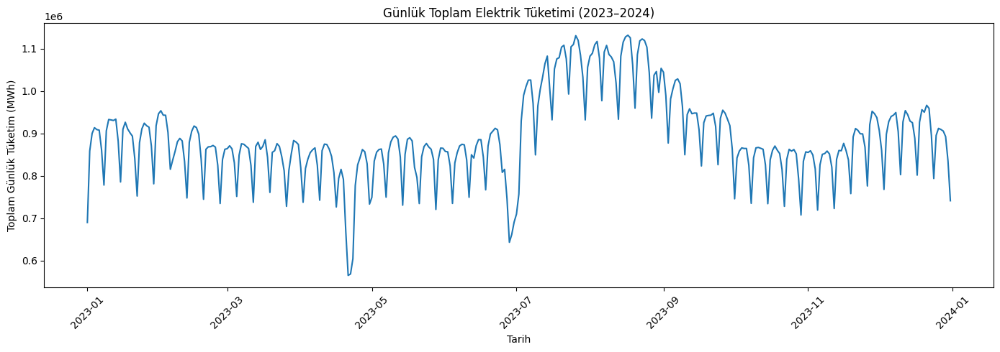

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

path = "/kaggle/input/tuketim2023/Gercek_Zamanli_Tuketim-01012023-31122023.csv"

# 1) CSV'yi oku
df = pd.read_csv(
    path,
    sep=";",
    engine="python",
    on_bad_lines="skip"
)

# 2) Gereksiz kolonları kaldır
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# 3) Kolon adlarını düzenle
df = df.rename(columns={
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# 4) Tarih veya Saat'i boş olan satırları kaldır
df = df.dropna(subset=["Tarih", "Saat"])

# 5) Tarih + Saat stringi oluştur
df["datetime_str"] = (
    df["Tarih"].astype(str).str.strip()
    + " "
    + df["Saat"].astype(str).str.strip()
)

# 6) Datetime formatına dönüştür
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# 7) Datetime dönüşmeyen satırları temizle
df = df.dropna(subset=["datetime"])

# 8) Tüketim değerini numeriğe çevir (Virgülü noktaya, nokta binlikten temizle)
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)     # binlik ayracı sil
    .str.replace(",", ".", regex=False)    # ondalık virgül → nokta
)

df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# 9) Günlük toplam tüketimi hesapla
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]

# 10) Grafiği çiz
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.title("Günlük Toplam Elektrik Tüketimi (2023–2024)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


     Gun_Adi  Gunluk_Tuketim
0  Pazartesi   894913.009615
1       Salı   918140.672885
2   Çarşamba   920265.303077
3   Perşembe   920672.946346
4       Cuma   912892.294423
5  Cumartesi   871552.090192
6      Pazar   783476.251321


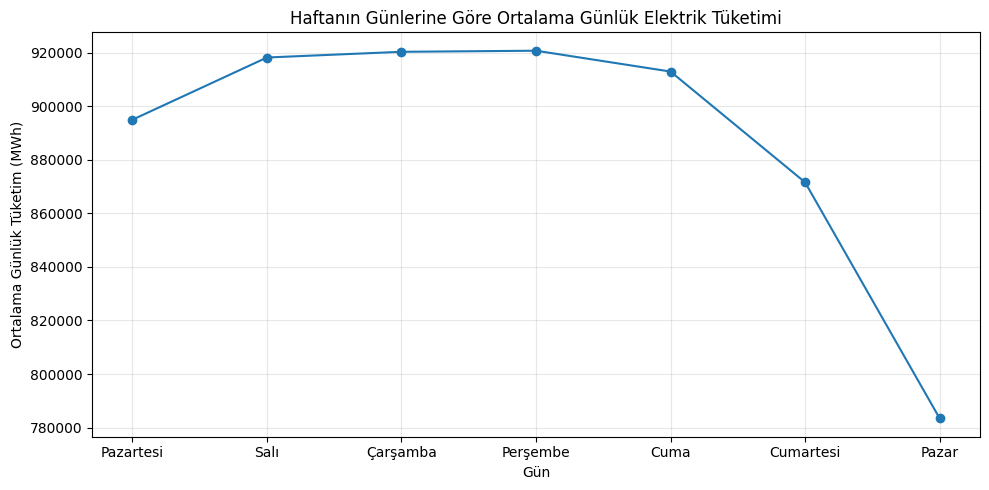

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Tarih kolonunu datetime yap
daily_dt = daily.copy()
daily_dt["Tarih"] = pd.to_datetime(daily_dt["Tarih"])

# 2) Haftanın gününü çıkar (0=Mon ... 6=Sun)
daily_dt["Gun"] = daily_dt["Tarih"].dt.dayofweek

# 3) Gün isimleri ekleyelim (opsiyonel ama daha güzel)
gun_isimleri = {
    0: "Pazartesi",
    1: "Salı",
    2: "Çarşamba",
    3: "Perşembe",
    4: "Cuma",
    5: "Cumartesi",
    6: "Pazar"
}
daily_dt["Gun_Adi"] = daily_dt["Gun"].map(gun_isimleri)

# 4) Haftanın günlerine göre ortalama tüketim
weekly_mean = (
    daily_dt
    .groupby("Gun_Adi")["Gunluk_Tuketim"]
    .mean()
    .reindex(["Pazartesi","Salı","Çarşamba","Perşembe","Cuma","Cumartesi","Pazar"])
    .reset_index()
)

print(weekly_mean)

# 5) Grafiği çiz
plt.figure(figsize=(10,5))
plt.plot(weekly_mean["Gun_Adi"], weekly_mean["Gunluk_Tuketim"], marker="o")
plt.title("Haftanın Günlerine Göre Ortalama Günlük Elektrik Tüketimi")
plt.xlabel("Gün")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


 En yüksek tüketim:
  → Yıl: 2023.0, Ay: 8.0, Toplam MWh: 33108059.31
 En düşük tüketim:
  → Yıl: 2023.0, Ay: 4.0, Toplam MWh: 23746306.34


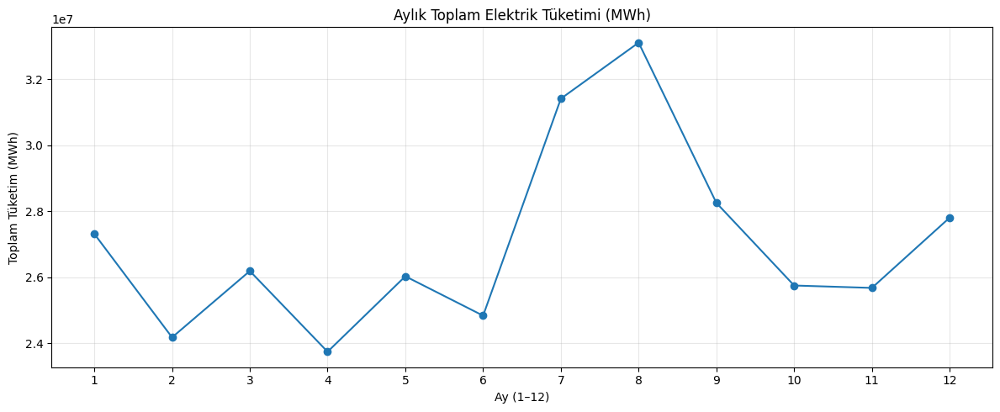

,Yil,Ay,Gunluk_Tuketim
0,2023,1,27317470.62
1,2023,2,24181356.14
2,2023,3,26191737.45
3,2023,4,23746306.34
4,2023,5,26031846.78
5,2023,6,24839641.21
6,2023,7,31411570.14
7,2023,8,33108059.31
8,2023,9,28254680.38
9,2023,10,25752716.76


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Tarihi datetime yap
daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

# Yıl ve Ay kolonları
daily_month["Yil"] = daily_month["Tarih"].dt.year
daily_month["Ay"] = daily_month["Tarih"].dt.month

# Aylık toplam tüketim
monthly_total = (
    daily_month
    .groupby(["Yil", "Ay"])["Gunluk_Tuketim"]
    .sum()
    .reset_index()
)

# Sadece ayları düzenli sıralamak için index'i Ay yap
monthly_total = monthly_total.sort_values(["Yil", "Ay"])

# ---- EN YÜKSEK VE EN DÜŞÜK AY ----
max_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmax()]
min_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmin()]

print(" En yüksek tüketim:")
print(f"  → Yıl: {max_row['Yil']}, Ay: {max_row['Ay']}, Toplam MWh: {max_row['Gunluk_Tuketim']:.2f}")

print(" En düşük tüketim:")
print(f"  → Yıl: {min_row['Yil']}, Ay: {min_row['Ay']}, Toplam MWh: {min_row['Gunluk_Tuketim']:.2f}")

# ---- GRAFİK ----
plt.figure(figsize=(12,5))
plt.plot(
    monthly_total["Ay"],
    monthly_total["Gunluk_Tuketim"],
    marker="o"
)
plt.title("Aylık Toplam Elektrik Tüketimi (MWh)")
plt.xlabel("Ay (1–12)")
plt.ylabel("Toplam Tüketim (MWh)")
plt.xticks(ticks=range(1,13))   # 1'den 12'ye kadar x ekseni
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

monthly_total


    Saat_num       Tuketim
0          0  34706.962247
1          1  33086.517068
2          2  31885.398466
3          3  31137.020712
4          4  30803.964027
5          5  30586.796192
6          6  30683.531041
7          7  32166.096411
8          8  36388.247178
9          9  38966.987123
10        10  40099.667425
11        11  40904.788493
12        12  39760.496740
13        13  40109.876932
14        14  40819.715178
15        15  40488.092301
16        16  40478.402247
17        17  40592.551123
18        18  40357.518000
19        19  40204.944411
20        20  40178.923534
21        21  39374.358767
22        22  38218.018384
23        23  36557.098000


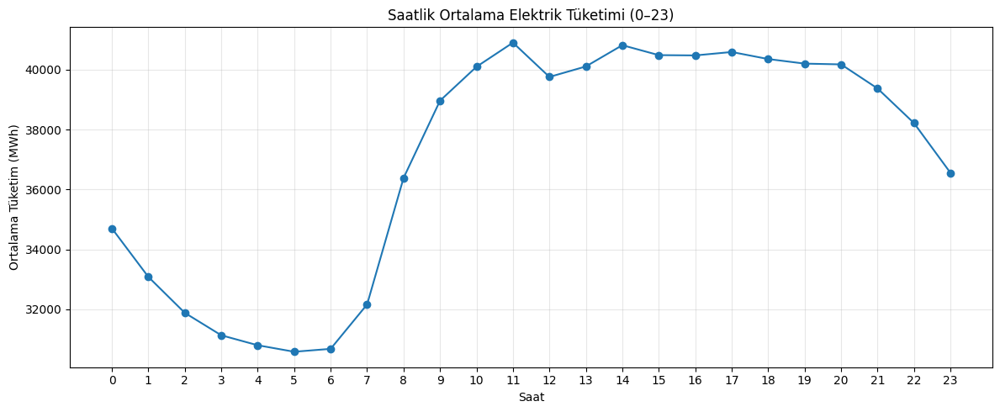

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük toplam yaptığımız saatlik veri burada (df)
df_hourly = df.copy()

# Saat bilgisini çıkaralım (0-23)
df_hourly["Saat_num"] = df_hourly["datetime"].dt.hour

# Her bir saat için ortalama tüketim
hourly_mean = (
    df_hourly
    .groupby("Saat_num")["Tuketim"]
    .mean()
    .reset_index()
)

print(hourly_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(hourly_mean["Saat_num"], hourly_mean["Tuketim"], marker="o")
plt.title("Saatlik Ortalama Elektrik Tüketimi (0–23)")
plt.xlabel("Saat")
plt.ylabel("Ortalama Tüketim (MWh)")
plt.xticks(range(0,24))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


    Gun  Gunluk_Tuketim
0     1   856501.397500
1     2   874827.772500
2     3   882911.264167
3     4   895957.917500
4     5   885758.260833
5     6   899633.801667
6     7   903755.625833
7     8   893238.765000
8     9   888620.869167
9    10   890193.134167
10   11   894962.652500
11   12   881411.861667
12   13   901808.035000
13   14   903451.397500
14   15   891431.379167
15   16   896863.147500
16   17   897173.939167
17   18   901588.124167
18   19   878768.955833
19   20   889634.847500
20   21   883668.634167
21   22   879922.028333
22   23   888895.730000
23   24   896296.404167
24   25   902772.030833
25   26   881671.456667
26   27   891435.814167
27   28   875903.663333
28   29   866897.370000
29   30   862343.922727
30   31   913224.091429


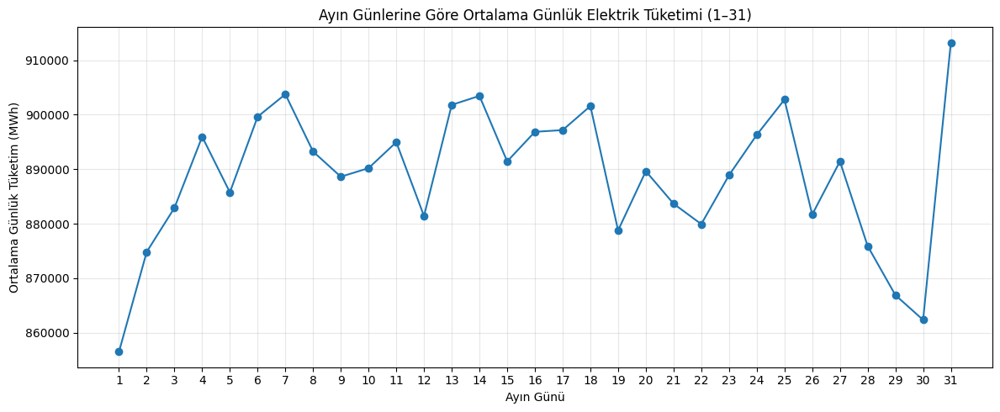

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# daily dataframe'ini kullanıyoruz
daily_dom = daily.copy()
daily_dom["Tarih"] = pd.to_datetime(daily_dom["Tarih"])

# Ayın gününü çıkar (1–31)
daily_dom["Gun"] = daily_dom["Tarih"].dt.day

# 1–31 için ortalama günlük tüketim
dom_mean = (
    daily_dom
    .groupby("Gun")["Gunluk_Tuketim"]
    .mean()
    .reset_index()
)

print(dom_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
plt.title("Ayın Günlerine Göre Ortalama Günlük Elektrik Tüketimi (1–31)")
plt.xlabel("Ayın Günü")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.xticks(range(1, 32))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


En yüksek 31 en düşük 1 neden?


Ocak ayı için:
  📈 En yüksek tüketim günü  : 31. gün (946310.37 MWh)
  📉 En düşük tüketim günü   : 1. gün (689830.56 MWh)


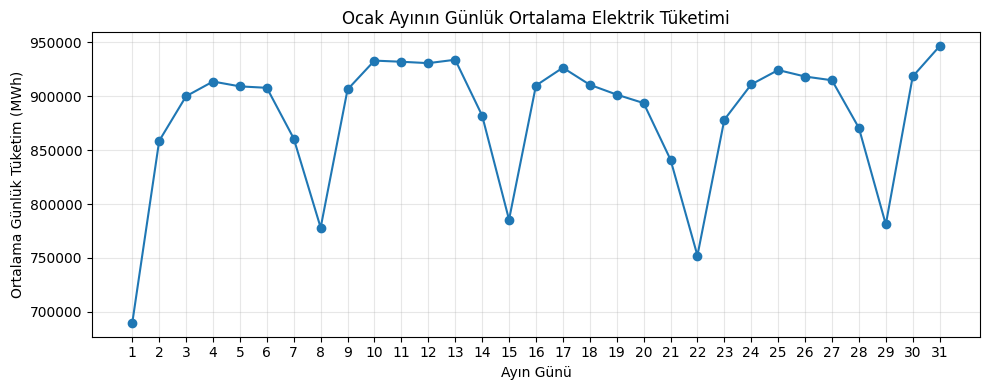


Şubat ayı için:
  📈 En yüksek tüketim günü  : 1. gün (953544.38 MWh)
  📉 En düşük tüketim günü   : 26. gün (734626.69 MWh)


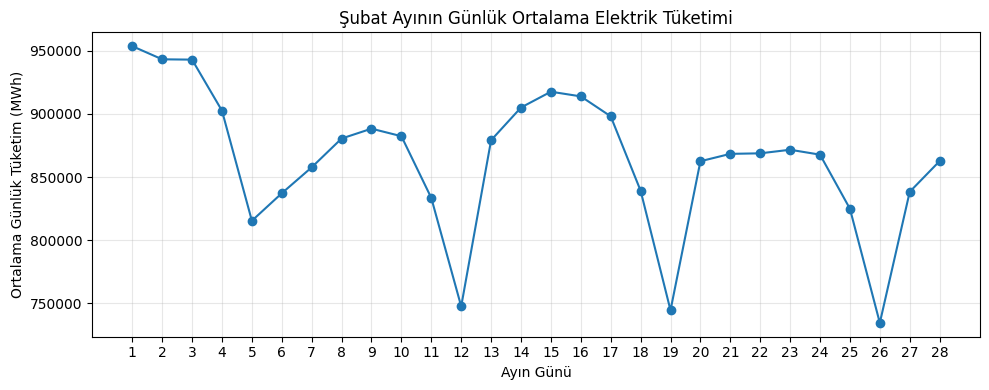


Mart ayı için:
  📈 En yüksek tüketim günü  : 17. gün (885057.97 MWh)
  📉 En düşük tüketim günü   : 26. gün (727956.75 MWh)


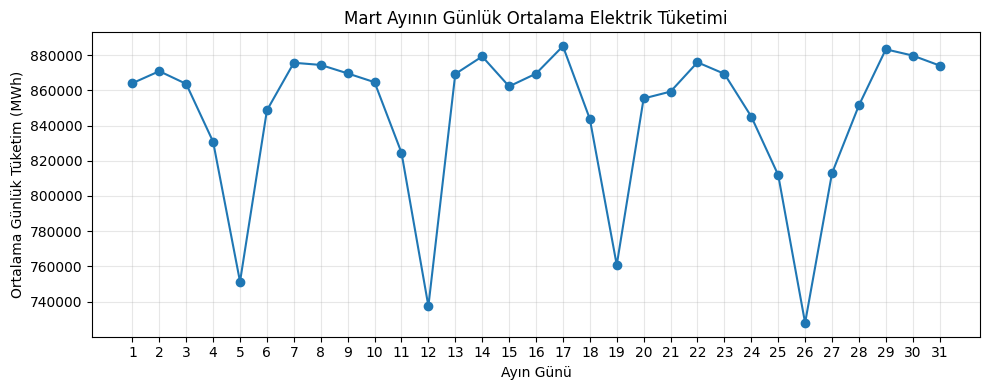


Nisan ayı için:
  📈 En yüksek tüketim günü  : 11. gün (874796.01 MWh)
  📉 En düşük tüketim günü   : 21. gün (564983.72 MWh)


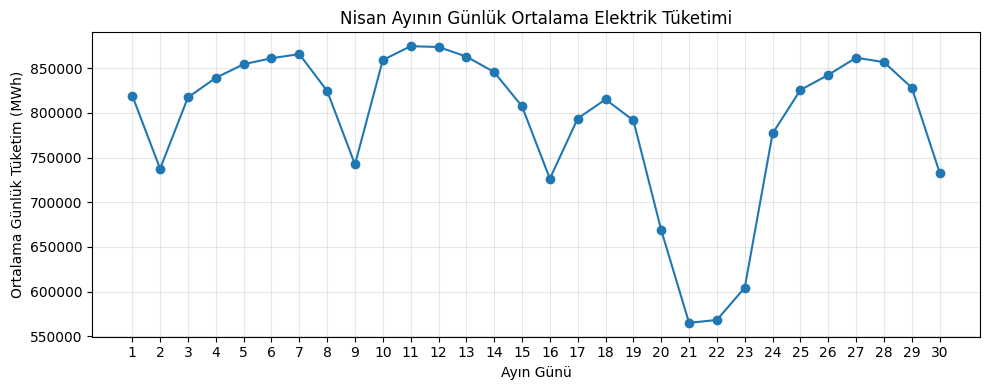


Mayıs ayı için:
  📈 En yüksek tüketim günü  : 11. gün (894136.31 MWh)
  📉 En düşük tüketim günü   : 28. gün (720649.46 MWh)


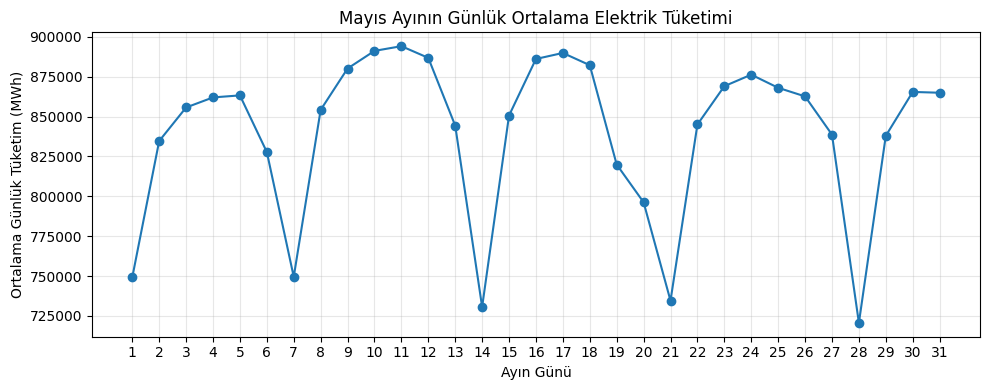


Haziran ayı için:
  📈 En yüksek tüketim günü  : 22. gün (912140.10 MWh)
  📉 En düşük tüketim günü   : 28. gün (643063.24 MWh)


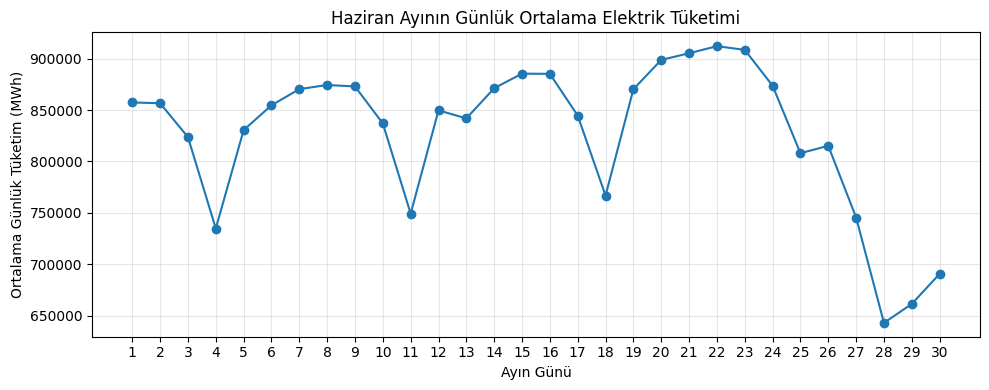


Temmuz ayı için:
  📈 En yüksek tüketim günü  : 26. gün (1130729.52 MWh)
  📉 En düşük tüketim günü   : 1. gün (709761.76 MWh)


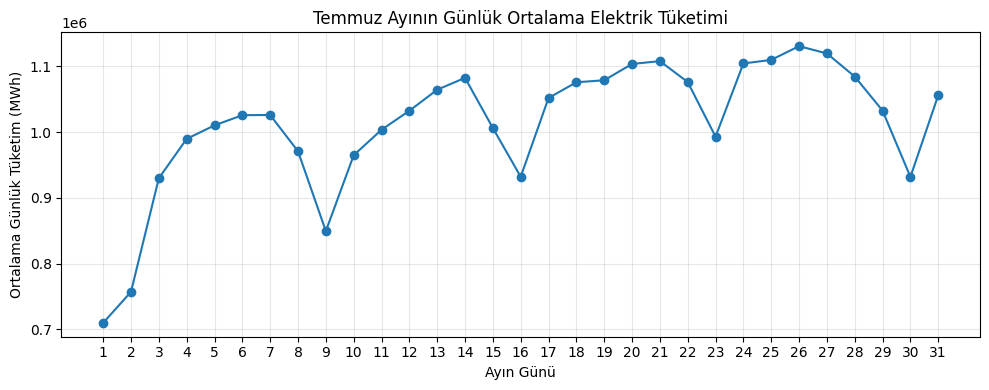


Ağustos ayı için:
  📈 En yüksek tüketim günü  : 17. gün (1131710.13 MWh)
  📉 En düşük tüketim günü   : 13. gün (933453.84 MWh)


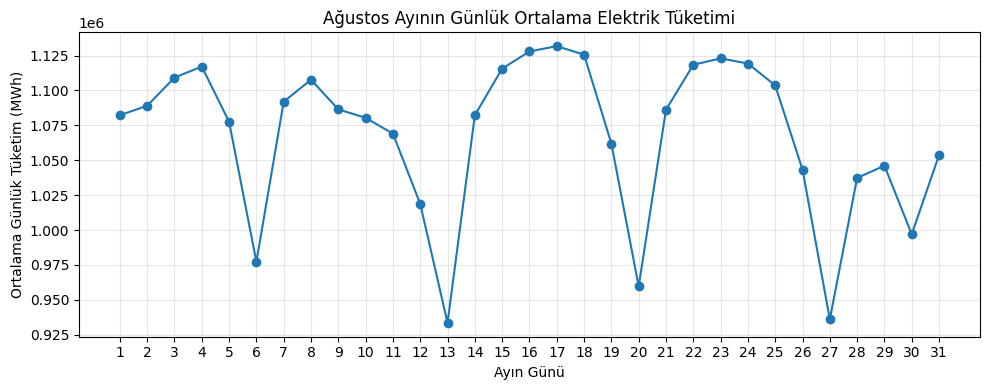


Eylül ayı için:
  📈 En yüksek tüketim günü  : 1. gün (1044344.49 MWh)
  📉 En düşük tüketim günü   : 17. gün (823226.59 MWh)


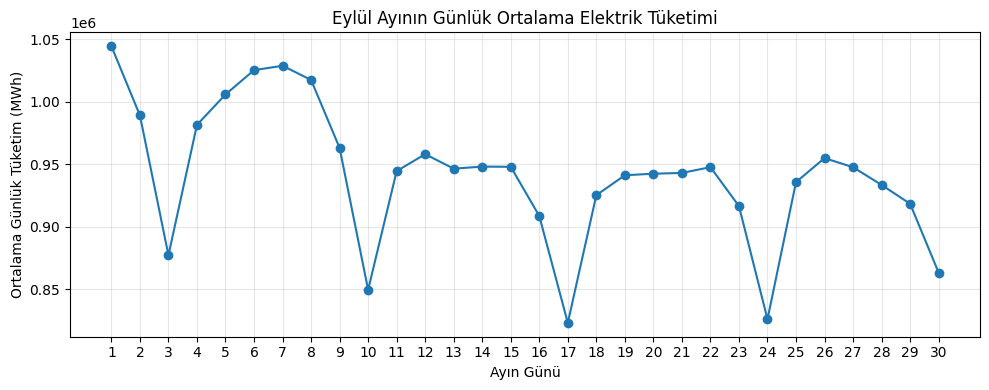


Ekim ayı için:
  📈 En yüksek tüketim günü  : 18. gün (870312.42 MWh)
  📉 En düşük tüketim günü   : 29. gün (707508.40 MWh)


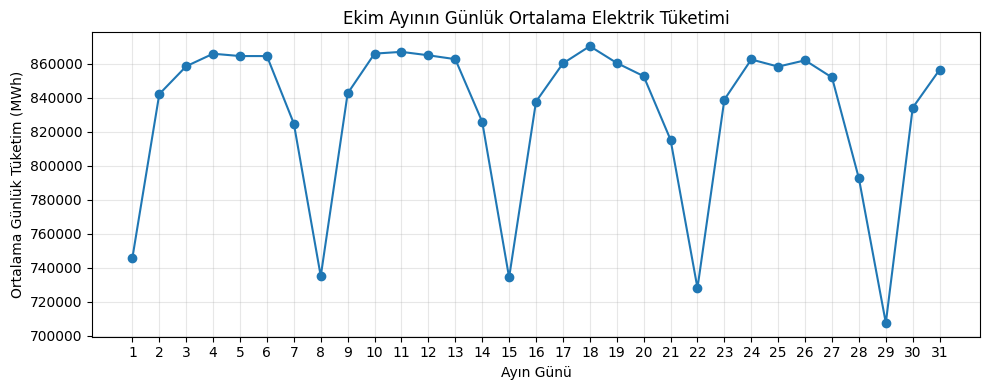


Kasım ayı için:
  📈 En yüksek tüketim günü  : 28. gün (952232.90 MWh)
  📉 En düşük tüketim günü   : 5. gün (719057.03 MWh)


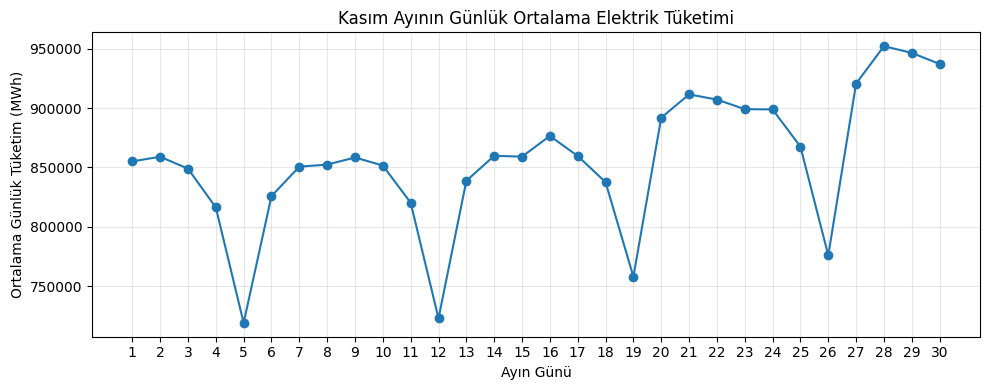


Aralık ayı için:
  📈 En yüksek tüketim günü  : 21. gün (966440.64 MWh)
  📉 En düşük tüketim günü   : 31. gün (741161.27 MWh)


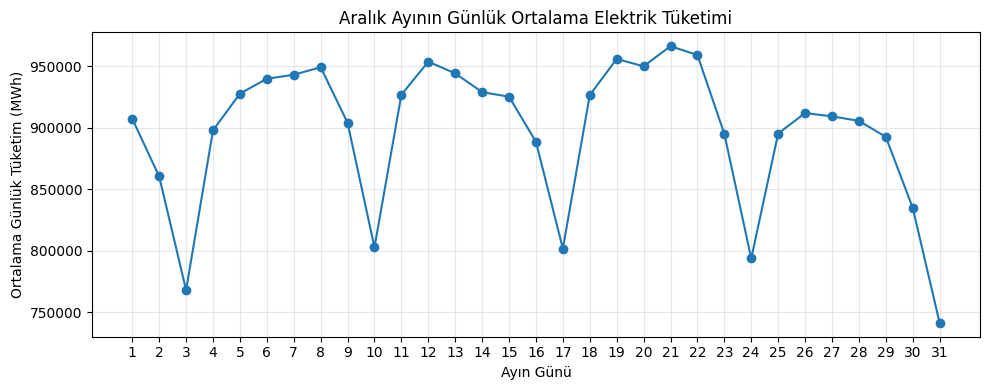

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

daily_month["Ay"] = daily_month["Tarih"].dt.month
daily_month["Gun"] = daily_month["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

for ay in range(1, 13):

    df_ay = daily_month[daily_month["Ay"] == ay]

    if df_ay.empty:
        continue

    # Günlere göre ortalama günlük tüketim
    dom_mean = (
        df_ay.groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    # ====== EN YÜKSEK / EN DÜŞÜK GÜN ======
    max_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmax()]
    min_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmin()]

    print(f"\n{ay_isimleri[ay]} ayı için:")
    print(f"  📈 En yüksek tüketim günü  : {int(max_row['Gun'])}. gün "
          f"({max_row['Gunluk_Tuketim']:.2f} MWh)")
    print(f"  📉 En düşük tüketim günü   : {int(min_row['Gun'])}. gün "
          f"({min_row['Gunluk_Tuketim']:.2f} MWh)")

    # ====== GRAFİK ======
    plt.figure(figsize=(10, 4))
    plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
    plt.title(f"{ay_isimleri[ay]} Ayının Günlük Ortalama Elektrik Tüketimi")
    plt.xlabel("Ayın Günü")
    plt.ylabel("Ortalama Günlük Tüketim (MWh)")
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, dom_mean["Gun"].max() + 1))
    plt.tight_layout()
    plt.show()


Yılbaşı: 1 Ocak 2023 Pazar

Ulusal Egemenlik ve Çocuk Bayramı: 23 Nisan Pazar

Ramazan Bayramı Arife (Öğleden Sonra): 20 Nisan 2023 Perşembe

Ramazan Bayramı 1. Gün: 21 Nisan 2023 Cuma

Ramazan Bayramı 2. Gün: 22 Nisan 2023 Cumartesi

Ramazan Bayramı 3. Gün: 23 Nisan 2023 Pazar

Emek ve Dayanışma Günü: 1 Mayıs Pazartesi

Atatürk’ü Anma, Gençlik ve Spor Bayramı: 19 Mayıs Cuma

Kurban Bayramı Arife (Öğleden Sonra): 27 Haziran 2023 Salı

Kurban Bayramı 1. Gün: 28 Haziran 2023 Çarşamba

Kurban Bayramı 2. Gün: 29 Haziran 2023 Perşembe

Kurban Bayramı 3. Gün: 30 Haziran 2023 Cuma

Kurban Bayramı 4. Gün: 1 Temmuz 2023 Cumartesi

Demokrasi Bayramı: 15 Temmuz Cumartesi

Zafer Bayramı: 30 Ağustos Çarşamba

Cumhuriyet Bayramı: 29 Ekim Pazar



**Milli Maçlar**

18.11.2023

15.10.2023

12.10.2023

12.09.2023

08.09.2023

19.06.2023

16.06.2023

28.03.2023

25.03.2023

**Neden ITS (Interrupted Time Series) Kullanmalıyız?**

Elektrik tüketimi zaman serisidir ve özel günlerde (tatiller, bayramlar, maçlar) tüketimde ani kırılmalar olur.

Bu kırılmalar:

ani seviye değişikliği yaratabilir (ani düşüş ↑↓)

trend değişikliği yaratabilir (tüketimin sonraki günlerdeki eğimi değişir)

Bu nedenle klasik modeller (ortalama karşılaştırma, t-test vb.) yetersizdir, çünkü:

✔ Zaman trendini hesaba katmaz
✔ Olayın sadece o gün mü yoksa sonrasında da etkisi var mı → anlayamaz
✔ Ani kırılmayı net olarak ayıramaz

Bu yüzden özel günlerin tüketimi gerçekten etkileyip etkilemediğini anlamak için ITS en uygun yöntemdir.

➤ ITS bize iki şeyi ayrı ayrı verir:
Katsayı	Anlam

β₂ (is_event)	Olay günü tüketimdeki ani seviye etkisi (şok etkisi)
β₃ (t_event)	Olay sonrası trendin normalden farklı olup olmadığı

Bu yüzden tatillerin ve maçların tüketimi düşürüp düşürmediğini istatistiksel olarak test etmek için ITS kullanıyoruz.



=== MODEL: 2023 SADECE TATİL/BAYRAM (EVENT) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.171
Model:                            OLS   Adj. R-squared:                  0.164
Method:                 Least Squares   F-statistic:                     24.90
Date:                Sat, 27 Dec 2025   Prob (F-statistic):           1.15e-14
Time:                        16:37:44   Log-Likelihood:                -4705.5
No. Observations:                 366   AIC:                             9419.
Df Residuals:                     362   BIC:                             9435.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
co

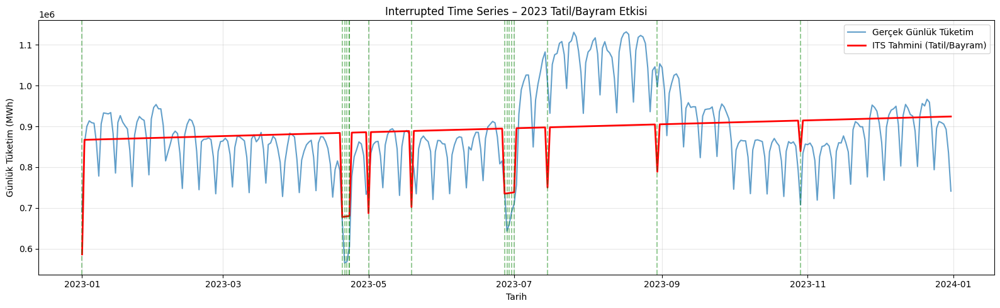

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# =========================
# 0) GÜNLÜK VERİYİ HAZIRLA
# =========================
df = daily.copy()
df["Tarih"] = pd.to_datetime(df["Tarih"])
df = df.sort_values("Tarih").reset_index(drop=True)

# Zaman indexi (t)
df["t"] = np.arange(len(df))

# =========================
# 1) 2023 RESMÎ TATİLLER (verdiğin listeye göre)
# =========================
holiday_info_2023 = [
    ("2023-01-01", 1),    # Yılbaşı

    ("2023-04-23", 1),    # 23 Nisan (aynı zamanda Ramazan Bayramı 3. gün)

    # Ramazan Bayramı: Arife (öğleden sonra) + 1-3. gün
    ("2023-04-20", 0.5),  # Arife (yarım gün)
    ("2023-04-21", 1),
    ("2023-04-22", 1),
    ("2023-04-23", 1),

    ("2023-05-01", 1),    # 1 Mayıs
    ("2023-05-19", 1),    # 19 Mayıs

    # Kurban Bayramı: Arife (öğleden sonra) + 1-4. gün
    ("2023-06-27", 0.5),  # Arife (yarım gün)
    ("2023-06-28", 1),
    ("2023-06-29", 1),
    ("2023-06-30", 1),
    ("2023-07-01", 1),

    ("2023-07-15", 1),    # Demokrasi Bayramı
    ("2023-08-30", 1),    # Zafer Bayramı
    ("2023-10-29", 1),    # Cumhuriyet Bayramı
]

holiday_df = pd.DataFrame(holiday_info_2023, columns=["Tarih", "holiday_weight"])
holiday_df["Tarih"] = pd.to_datetime(holiday_df["Tarih"])

holiday_dates = holiday_df["Tarih"].copy()

# =========================
# 2) EVENT DUMMY'LERİNİ OLUŞTUR
# =========================
# (Ağırlık kullanmak istemiyorsan: is_holiday = isin(...) yeterli
# Ama arife yarım gün olduğu için weight'i de ayrıca tutuyoruz.)
df = df.merge(holiday_df, on="Tarih", how="left")
df["holiday_weight"] = df["holiday_weight"].fillna(0)

# Eski yapıyı koruyalım: event = holiday
df["is_holiday"] = (df["holiday_weight"] > 0).astype(int)
df["is_event"]   = df["is_holiday"]

# Etkileşim terimleri (trend * event)
df["t_event"]   = df["t"] * df["is_event"]
df["t_holiday"] = df["t"] * df["is_holiday"]

y = df["Gunluk_Tuketim"]

# =========================
# 3) MODEL 1 – TEK "EVENT" (SADECE TATİL/BAYRAM)
# =========================
X1 = df[["t", "is_event", "t_event"]]
X1 = sm.add_constant(X1)

model1 = sm.OLS(y, X1).fit()

print("\n\n=== MODEL: 2023 SADECE TATİL/BAYRAM (EVENT) ===")
print(model1.summary())

# =========================
# 4) TAHMİN VE GRAFİK
# =========================
df["pred_event"] = model1.predict(X1)

plt.figure(figsize=(16,5))
plt.plot(df["Tarih"], df["Gunluk_Tuketim"], label="Gerçek Günlük Tüketim", alpha=0.7)
plt.plot(df["Tarih"], df["pred_event"], label="ITS Tahmini (Tatil/Bayram)", color="red", linewidth=2)

# Sadece tatil/bayram çizgileri
for d in holiday_dates:
    if df["Tarih"].min() <= d <= df["Tarih"].max():
        plt.axvline(d, color="green", linestyle="--", alpha=0.4)

plt.title("Interrupted Time Series – 2023 Tatil/Bayram Etkisi")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


🔵 Gerçek Tüketim

Mavi çizgi, EPİAŞ’tan alınan gerçek günlük tüketimi göstermektedir.
Yaz aylarında artış, tatillerde belirgin düşüş dikkati çeker.

🔴 ITS Tahmini

Kırmızı çizgi, “tatil/maç olmasaydı tüketim nasıl ilerlerdi?” sorusunun yanıtıdır.
Model trendi ve olay kaynaklı sapmaları birlikte gösterir.

🟩 Olay Günleri

Yeşil kesikli çizgiler: Tatil & bayram günleri

Mor noktalı çizgiler: Milli maç günleri

🔍 Temel Sonuçlar
✔ Tatil günleri tüketimi düşürüyor

ITS’e göre tatillerde tüketim ortalama ~268 MWh daha düşük.
Bu etki istatistiksel olarak anlamlı.

✖ Milli maçların anlamlı bir etkisi yok

Model katsayıları anlamsız → maç günleri tüketimi sistematik olarak değiştirmiyor.

✔ Hafif bir pozitif trend var

Yıl içinde tüketim yavaşça artıyor.

/tmp/ipykernel_47/924049934.py:15: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")


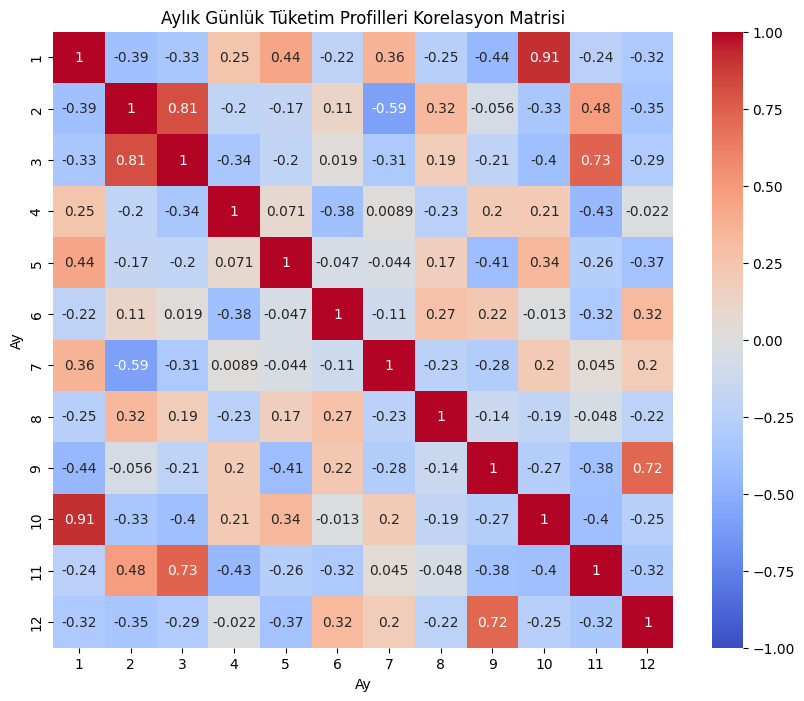

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Aylık günlük ortalamaları geniş formata alalım
pivot = daily_month.pivot_table(
    index="Gun",
    columns="Ay",
    values="Gunluk_Tuketim",
    aggfunc="mean"
)

# Şubat 29 vs eksik günleri dolduralım (interpolate)
pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")

# Korelasyon matrisi
corr = pivot.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Aylık Günlük Tüketim Profilleri Korelasyon Matrisi")
plt.show()




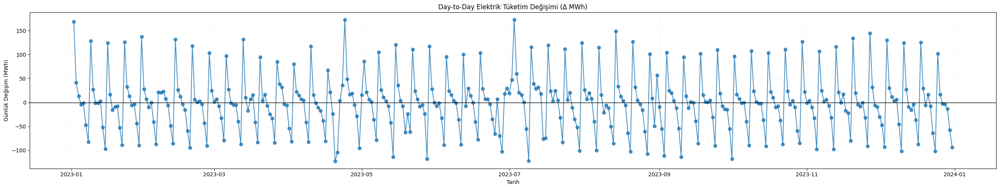

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)
daily.columns = ["Tarih", "Gunluk_Tuketim"]
daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# 2) day-to-day fark dataframe'ini oluştur
df_diff = daily.copy()
df_diff["Degisim"] = df_diff["Gunluk_Tuketim"].diff()

# 3) Grafiği çiz
plt.figure(figsize=(26,5))   # daha yayvan
plt.plot(df_diff["Tarih"], df_diff["Degisim"], marker="o", alpha=0.8)
plt.axhline(0, color="black", linewidth=1)

plt.title("Day-to-Day Elektrik Tüketim Değişimi (Δ MWh)")
plt.xlabel("Tarih")
plt.ylabel("Günlük Değişim (MWh)")
plt.grid(True, alpha=0.1)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less
  return op(a, b)


🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:
2023-01-08  →  778.12 MWh
2023-01-15  →  785.48 MWh
2023-01-22  →  752.23 MWh
2023-01-29  →  781.10 MWh
2023-02-12  →  747.68 MWh
2023-02-19  →  744.60 MWh
2023-02-26  →  734.63 MWh
2023-03-05  →  751.36 MWh
2023-03-12  →  737.47 MWh
2023-03-19  →  760.84 MWh
2023-04-09  →  742.37 MWh
2023-04-21  →  564.98 MWh
2023-04-22  →  568.32 MWh
2023-05-07  →  749.54 MWh
2023-05-14  →  730.63 MWh
2023-05-28  →  720.65 MWh
2023-06-04  →  734.83 MWh
2023-06-11  →  749.28 MWh
2023-06-18  →  766.85 MWh
2023-07-09  →  849.43 MWh
2023-07-23  →  992.99 MWh
2023-07-30  →  931.88 MWh
2023-08-06  →  977.14 MWh
2023-08-20  →  959.53 MWh
2023-09-03  →  877.32 MWh
2023-09-17  →  823.23 MWh
2023-09-24  →  826.18 MWh
2023-10-08  →  734.97 MWh
2023-10-15  →  734.22 MWh
2023-10-22  →  728.02 MWh
2023-10-29  →  707.51 MWh
2023-11-05  →  719.06 MWh
2023-11-12  →  722.87 MWh
2023-12-03  →  767.87 MWh
2023-12-10  →  802.67 MWh
2023-12-17  →  801.58 MWh


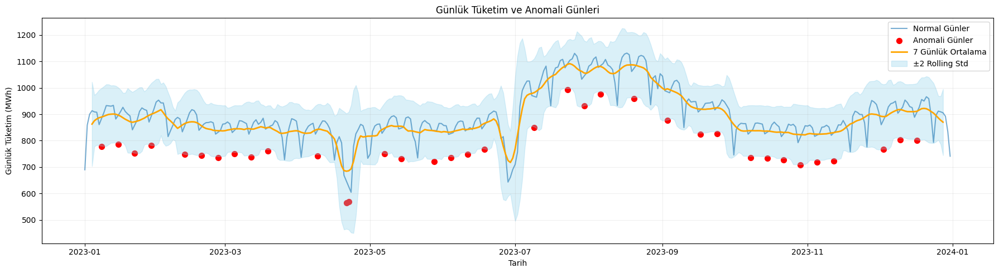

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==== 1) DAILY DATAFRAME'İN VAR OLDUĞUNU KABUL EDİYORUZ ====
# Eğer yoksa, önce df -> daily kısmını ÇALIŞTIRMAN lazım.
# daily: [Tarih, Gunluk_Tuketim]

daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# ==== 2) ANOMALİ DATAFRAME'İ (ana) OLUŞTUR ====
ana = daily.copy()

# --- Global z-score ---
mu = ana["Gunluk_Tuketim"].mean()
sigma = ana["Gunluk_Tuketim"].std()

ana["zscore"] = (ana["Gunluk_Tuketim"] - mu) / sigma
ana["is_z_anom"] = ana["zscore"].abs() > 3   # eşik: |z| > 3

# --- Rolling mean/std ---
window = 7
ana["roll_mean"] = ana["Gunluk_Tuketim"].rolling(window=window, center=True).mean()
ana["roll_std"]  = ana["Gunluk_Tuketim"].rolling(window=window, center=True).std()

upper = ana["roll_mean"] + 2 * ana["roll_std"]
lower = ana["roll_mean"] - 2 * ana["roll_std"]

ana["is_roll_anom"] = (ana["Gunluk_Tuketim"] > upper) | (ana["Gunluk_Tuketim"] < lower)

# --- Kombine etiket ---
ana["is_anom"] = ana["is_z_anom"] | ana["is_roll_anom"]

# ==== 3) SENİN KODUN: ANOMALİLERİ YAZDIR + GRAFİĞİ ÇİZ ====
df = ana.copy()   # senin koduna dokunmadan kullanabilelim

# Sadece anomalileri seç
anom_points = df[df["is_anom"]][["Tarih", "Gunluk_Tuketim"]]

# ---- TARİHLERİ YAZDIR ----
print("🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:")
for idx, row in anom_points.iterrows():
    print(f"{row['Tarih'].date()}  →  {row['Gunluk_Tuketim']:.2f} MWh")

# ---- GRAFİK ----
plt.figure(figsize=(18,5))

# Normal günler
plt.plot(df.loc[~df["is_anom"], "Tarih"],
         df.loc[~df["is_anom"], "Gunluk_Tuketim"],
         color="#1f77b4", alpha=0.6, label="Normal Günler")

# Anomali günler (kırmızı noktalar)
plt.scatter(df.loc[df["is_anom"], "Tarih"],
            df.loc[df["is_anom"], "Gunluk_Tuketim"],
            color="red", s=50, label="Anomali Günler")

# Rolling ortalama
plt.plot(df["Tarih"], df["roll_mean"], color="orange", linewidth=2, label=f"{window} Günlük Ortalama")

# Rolling band (±2 std)
plt.fill_between(df["Tarih"],
                 df["roll_mean"] - 2*df["roll_std"],
                 df["roll_mean"] + 2*df["roll_std"],
                 color="skyblue", alpha=0.3, label="±2 Rolling Std")

plt.title("Günlük Tüketim ve Anomali Günleri")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.2)
plt.legend()
plt.tight_layout()
plt.show()


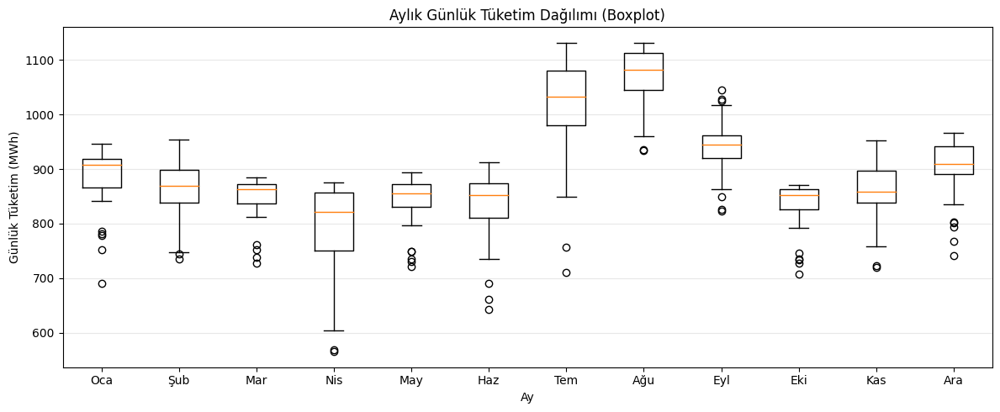

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# daily: [Tarih, Gunluk_Tuketim]
box_df = daily.copy()
box_df["Tarih"] = pd.to_datetime(box_df["Tarih"])
box_df["Ay"] = box_df["Tarih"].dt.month

# Her ay için Gunluk_Tuketim listesi
data_by_month = [box_df[box_df["Ay"] == m]["Gunluk_Tuketim"] for m in range(1, 13)]

ay_isimleri = ["Oca", "Şub", "Mar", "Nis", "May", "Haz",
               "Tem", "Ağu", "Eyl", "Eki", "Kas", "Ara"]

plt.figure(figsize=(12,5))
plt.boxplot(data_by_month, labels=ay_isimleri, showfliers=True)
plt.title("Aylık Günlük Tüketim Dağılımı (Boxplot)")
plt.xlabel("Ay")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# daily = senin günlük dataframe'in
gunluk = daily.copy()
gunluk["Tarih"] = pd.to_datetime(gunluk["Tarih"])

# Ay ve gün bilgileri
gunluk["AyNo"] = gunluk["Tarih"].dt.month
gunluk["GunEN"] = gunluk["Tarih"].dt.day_name()

gun_mapping = {
    "Monday": "Pazartesi",
    "Tuesday": "Salı",
    "Wednesday": "Çarşamba",
    "Thursday": "Perşembe",
    "Friday": "Cuma",
    "Saturday": "Cumartesi",
    "Sunday": "Pazar"
}

gun_sira = {
    "Pazartesi": 1,
    "Salı": 2,
    "Çarşamba": 3,
    "Perşembe": 4,
    "Cuma": 5,
    "Cumartesi": 6,
    "Pazar": 7
}

gunluk["Gün"] = gunluk["GunEN"].map(gun_mapping)
gunluk["GunSira"] = gunluk["Gün"].map(gun_sira)

ay_isimleri = {
    1:"Ocak",2:"Şubat",3:"Mart",4:"Nisan",5:"Mayıs",6:"Haziran",
    7:"Temmuz",8:"Ağustos",9:"Eylül",10:"Ekim",11:"Kasım",12:"Aralık"
}

# ---- Gün istatistikleri (12 ay tek tabloda) ----
gun_istatistik_tum = (
    gunluk
    .groupby(["AyNo","Gün"])["Gunluk_Tuketim"]
    .agg(["mean","min","max","std","count"])
    .reset_index()
)

gun_istatistik_tum["Ay"] = gun_istatistik_tum["AyNo"].map(ay_isimleri)
gun_istatistik_tum["GunSira"] = gun_istatistik_tum["Gün"].map(gun_sira)
gun_istatistik_tum = gun_istatistik_tum.sort_values(["AyNo","GunSira"])

gun_istatistik_tum = gun_istatistik_tum.rename(columns={
    "mean":"Ortalama (MWh)",
    "min":"Minimum (MWh)",
    "max":"Maksimum (MWh)",
    "std":"Std Sapma (MWh)",
    "count":"Gün Sayısı"
})

# ---- Her ay için tablo + en kararlı / en değişken ----
for ay_no in range(1,13):
    ay_adi = ay_isimleri[ay_no]
    alt = gun_istatistik_tum[gun_istatistik_tum["AyNo"] == ay_no].copy()
    if alt.empty:
        continue

    print(f"\n\n=== 2023 {ay_adi} - Günlere Göre Elektrik Tüketimi İstatistikleri ===\n")
    print(
        alt[["Gün","Ortalama (MWh)","Minimum (MWh)","Maksimum (MWh)",
             "Std Sapma (MWh)","Gün Sayısı"]]
        .round(2)
        .to_string(index=False)
    )

    en_stabil = alt.loc[alt["Std Sapma (MWh)"].idxmin()]
    en_degisen = alt.loc[alt["Std Sapma (MWh)"].idxmax()]

    print(f"\n-> En KARARLI gün: {en_stabil['Gün']}  (Std Sapma: {en_stabil['Std Sapma (MWh)']:.2f} MWh)")
    print(f"-> En DEĞİŞKEN gün: {en_degisen['Gün']}  (Std Sapma: {en_degisen['Std Sapma (MWh)']:.2f} MWh)")

# ---- Özet tablo ----
stabil_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmin(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Kararlı Gün"})

degisen_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmax(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Değişken Gün","Std Sapma (MWh)":"Std Sapma (MWh) - Değişken"})

ozet = stabil_ozet.merge(degisen_ozet, on="Ay")

print("\n\n=== ÖZET: 2023 Her Ay İçin En Kararlı ve En Değişken Günler ===\n")
print(ozet.round(2).to_string(index=False))




=== 2023 Ocak - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std Sapma (MWh)  Gün Sayısı
Pazartesi          894.18         858.53          918.21            24.97           5
     Salı          923.27         899.92          946.31            18.26           5
 Çarşamba          920.04         910.55          931.87             9.82           4
 Perşembe          914.80         901.43          930.57            12.55           4
     Cuma          912.43         893.58          933.73            16.70           4
Cumartesi          863.60         841.16          881.99            17.31           4
    Pazar          757.35         689.83          785.48            39.91           5

-> En KARARLI gün: Çarşamba  (Std Sapma: 9.82 MWh)
-> En DEĞİŞKEN gün: Pazar  (Std Sapma: 39.91 MWh)


=== 2023 Şubat - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std Sapma (MW

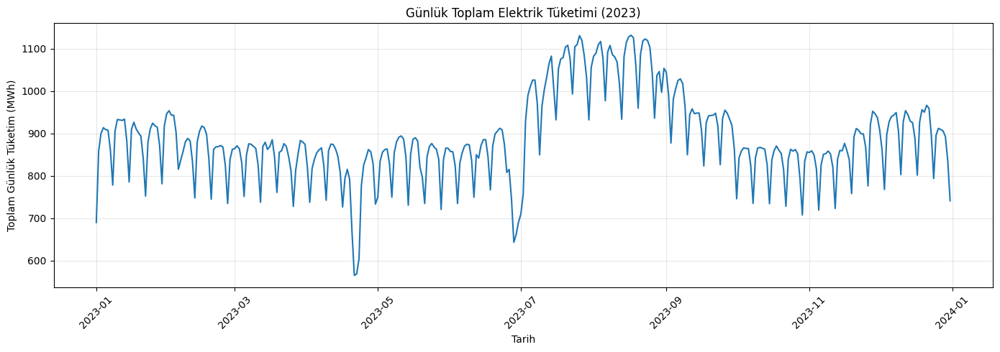

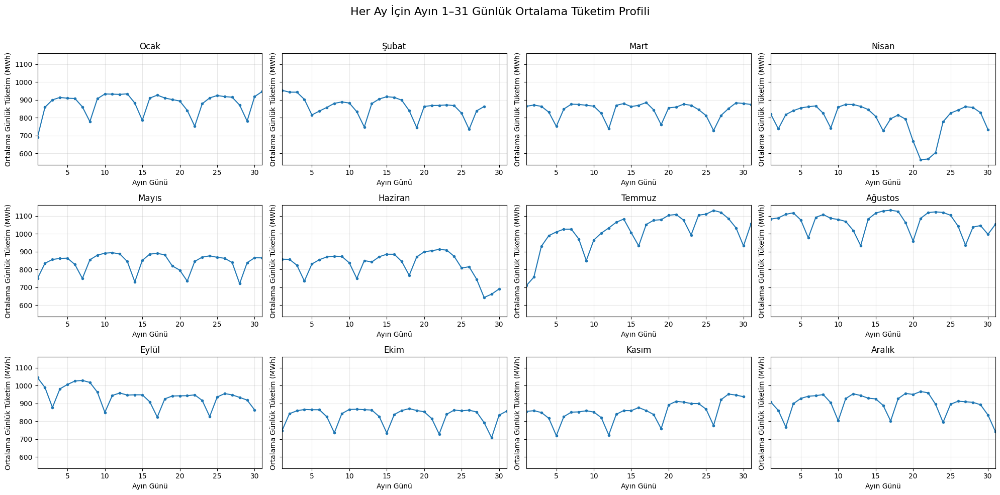

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ===================== 1) CSV'Yİ OKU VE TEMİZLE =====================
path = "/kaggle/input/2023-2024/Gercek_Zamanli_Tuketim-01012023-01012024.csv"

df = pd.read_csv(
    path,
    sep=";",              # EPİAŞ CSV genelde ;
    engine="python",
    on_bad_lines="skip"   # bozuk satırları at
)

# Gereksiz kolonları sil
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# İsimleri sadeleştir
df = df.rename(columns={
    "Tarih": "Tarih",
    "Saat": "Saat",
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# Boş tarih/saat satırlarını at
df = df.dropna(subset=["Tarih", "Saat"])

# Tarih + saat stringi oluştur
df["datetime_str"] = df["Tarih"].astype(str).str.strip() + " " + df["Saat"].astype(str).str.strip()

# Datetime'a çevir
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# Datetime oluşmayanları at
df = df.dropna(subset=["datetime"])

# Tüketimi numeriğe çevir
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)   # binlik ayraç
    .str.replace(",", ".", regex=False)  # ondalık virgül -> nokta
)
df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# ===================== 2) GÜNLÜK TOPLAMA (daily) =====================
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]
daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# İstersen günlük grafiği de bir kontrol edelim:
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.title("Günlük Toplam Elektrik Tüketimi (2023)")
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ===================== 3) HER AY İÇİN 1–31 GÜNLÜK ORTALAMA GRAFİKLER =====================

dm = daily.copy()
dm["Ay"] = dm["Tarih"].dt.month
dm["Gun"] = dm["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

fig, axes = plt.subplots(3, 4, figsize=(20, 10), sharey=True)
fig.suptitle("Her Ay İçin Ayın 1–31 Günlük Ortalama Tüketim Profili", fontsize=16)

for ay in range(1, 13):
    ax = axes[(ay-1)//4, (ay-1)%4]
    df_ay = dm[dm["Ay"] == ay]

    if df_ay.empty:
        ax.set_visible(False)
        continue

    dom_mean = (
        df_ay
        .groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    ax.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o", markersize=3)
    ax.set_title(ay_isimleri[ay])
    ax.set_xlabel("Ayın Günü")
    ax.set_ylabel("Ortalama Günlük Tüketim (MWh)")
    ax.set_xlim(1, 31)
    ax.grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


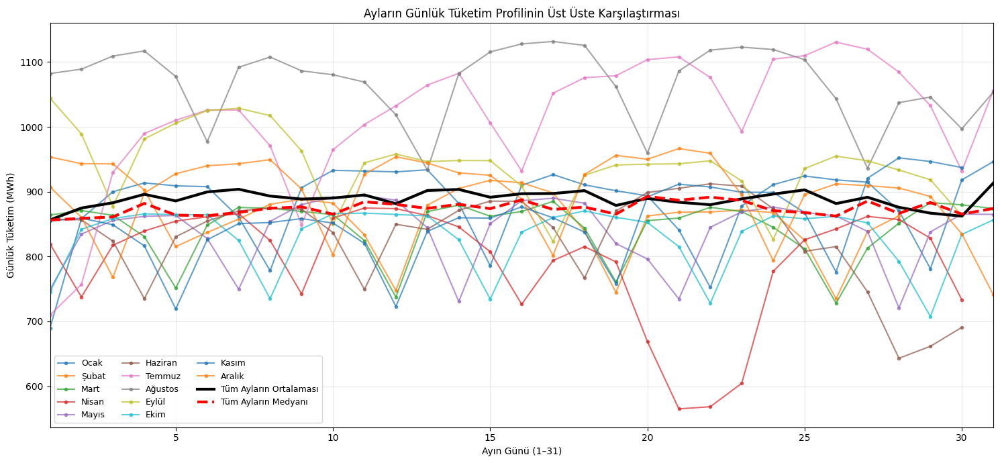

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Günlük veri → daily
dm = daily.copy()
dm["Tarih"] = pd.to_datetime(dm["Tarih"])
dm["Ay"] = dm["Tarih"].dt.month
dm["Gun"] = dm["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

# Her gün için tüm ayların ortalaması ve medyanı
overall_mean = dm.groupby("Gun")["Gunluk_Tuketim"].mean()
overall_median = dm.groupby("Gun")["Gunluk_Tuketim"].median()

plt.figure(figsize=(15,7))

# 12 AYI AYRI RENKLE ÜST ÜSTE KOYALIM
for ay in range(1, 12+1):
    df_ay = dm[dm["Ay"] == ay]
    dom_mean = df_ay.groupby("Gun")["Gunluk_Tuketim"].mean()

    plt.plot(dom_mean.index, dom_mean.values,
             marker="o", markersize=3, alpha=0.7,
             label=ay_isimleri[ay])

# ===== OVERALL MEAN =====
plt.plot(overall_mean.index, overall_mean.values,
         color="black", linewidth=3, label="Tüm Ayların Ortalaması")

# ===== OVERALL MEDIAN =====
plt.plot(overall_median.index, overall_median.values,
         color="red", linewidth=3, linestyle="--",
         label="Tüm Ayların Medyanı")

plt.title("Ayların Günlük Tüketim Profilinin Üst Üste Karşılaştırması")
plt.xlabel("Ayın Günü (1–31)")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend(ncol=3, fontsize=9)
plt.xlim(1, 31)
plt.tight_layout()
plt.show()


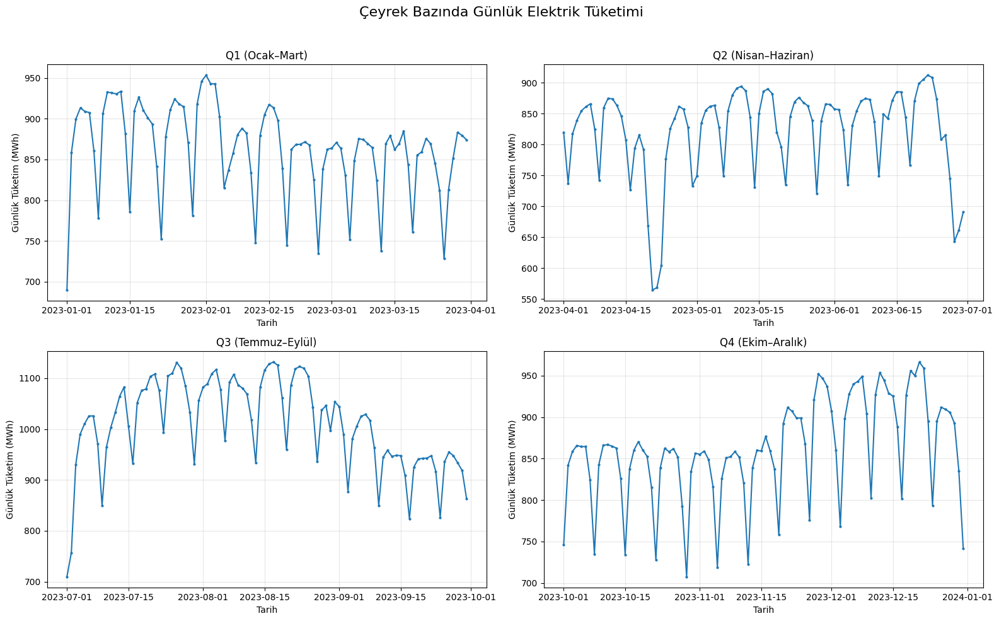


🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):
Q1 (Ocak–Mart) → 77690.56 MWh
Q2 (Nisan–Haziran) → 74617.79 MWh
Q3 (Temmuz–Eylül) → 92774.31 MWh
Q4 (Ekim–Aralık) → 79240.26 MWh

🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:
Q1 (Ocak–Mart) → Q2 (Nisan–Haziran) : %-3.96 büyüme
Q2 (Nisan–Haziran) → Q3 (Temmuz–Eylül) : %24.33 büyüme
Q3 (Temmuz–Eylül) → Q4 (Ekim–Aralık) : %-14.59 büyüme


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük veri
df_q = daily.copy()
df_q["Tarih"] = pd.to_datetime(df_q["Tarih"])
df_q["Yil"] = df_q["Tarih"].dt.year
df_q["Ay"]  = df_q["Tarih"].dt.month

# Çeyrek belirleyelim
df_q["Ceyrek"] = ((df_q["Ay"] - 1) // 3) + 1   # 1→Q1, 2→Q2, 3→Q3, 4→Q4

# Çeyrek isimleri
q_labels = {1: "Q1 (Ocak–Mart)", 2: "Q2 (Nisan–Haziran)",
            3: "Q3 (Temmuz–Eylül)", 4: "Q4 (Ekim–Aralık)"}

# =======================================================
# 1) HER ÇEYREK İÇİN GRAFİKLERİ ÇİZ
# =======================================================

plt.figure(figsize=(16,10))

for q in range(1, 5):
    df_sub = df_q[df_q["Ceyrek"] == q]

    ax = plt.subplot(2, 2, q)
    ax.plot(df_sub["Tarih"], df_sub["Gunluk_Tuketim"], marker="o", markersize=2)
    ax.set_title(q_labels[q])
    ax.set_xlabel("Tarih")
    ax.set_ylabel("Günlük Tüketim (MWh)")
    ax.grid(True, alpha=0.3)

plt.suptitle("Çeyrek Bazında Günlük Elektrik Tüketimi", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# =======================================================
# 2) HER ÇEYREĞİN TOPLAM TÜKETİMİ
# =======================================================

quarter_total = df_q.groupby("Ceyrek")["Gunluk_Tuketim"].sum()
print("\n🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):")
for q in range(1,5):
    print(f"{q_labels[q]} → {quarter_total[q]:.2f} MWh")

# =======================================================
# 3) ÇEYREKLER ARASI BÜYÜME ORANI (%)
# =======================================================

print("\n🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:")

for q in range(2, 5):
    prev = quarter_total[q-1]
    curr = quarter_total[q]
    growth = ((curr - prev) / prev) * 100

    print(f"{q_labels[q-1]} → {q_labels[q]} : %{growth:.2f} büyüme")



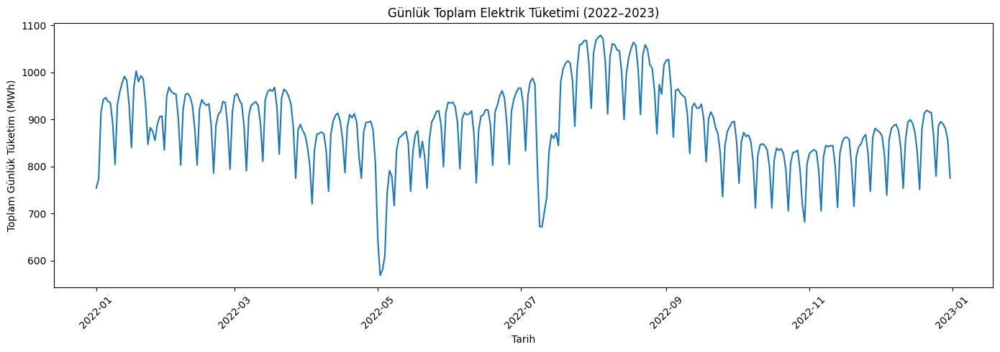

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

path = "/kaggle/input/tuketim2022/Gercek_Zamanli_Tuketim-01012022-31122022.csv"

# 1) CSV'yi oku
df = pd.read_csv(
    path,
    sep=";",
    engine="python",
    on_bad_lines="skip"
)

# 2) Gereksiz kolonları kaldır
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# 3) Kolon adlarını düzenle
df = df.rename(columns={
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# 4) Tarih veya Saat'i boş olan satırları kaldır
df = df.dropna(subset=["Tarih", "Saat"])

# 5) Tarih + Saat stringi oluştur
df["datetime_str"] = (
    df["Tarih"].astype(str).str.strip()
    + " "
    + df["Saat"].astype(str).str.strip()
)

# 6) Datetime formatına dönüştür
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# 7) Datetime dönüşmeyen satırları temizle
df = df.dropna(subset=["datetime"])

# 8) Tüketim değerini numeriğe çevir (Virgülü noktaya, nokta binlikten temizle)
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)     # binlik ayracı sil
    .str.replace(",", ".", regex=False)    # ondalık virgül → nokta
)

df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# 9) Günlük toplam tüketimi hesapla
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]

# 10) Grafiği çiz
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.title("Günlük Toplam Elektrik Tüketimi (2022–2023)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


     Gun_Adi  Gunluk_Tuketim
0  Pazartesi      890.733491
1       Salı      913.611783
2   Çarşamba      918.295322
3   Perşembe      921.794702
4       Cuma      913.900301
5  Cumartesi      867.125286
6      Pazar      784.967404


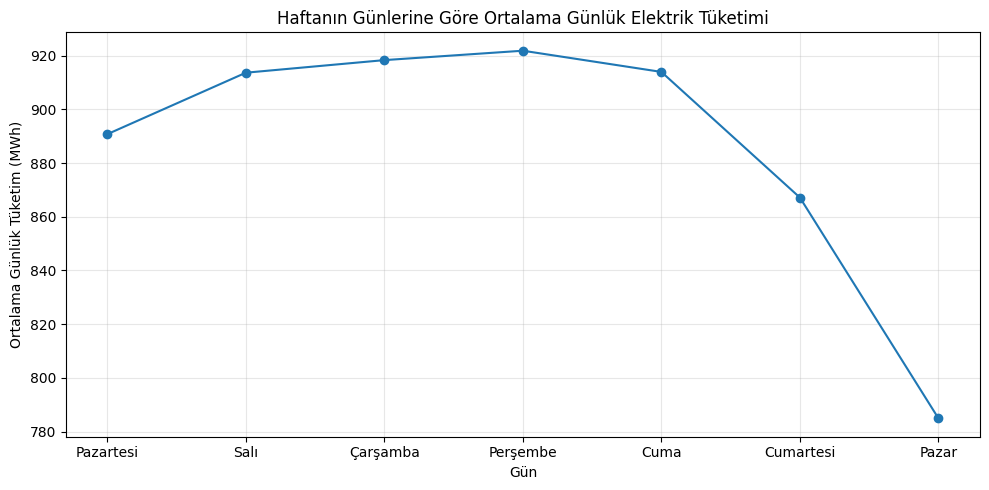

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Tarih kolonunu datetime yap
daily_dt = daily.copy()
daily_dt["Tarih"] = pd.to_datetime(daily_dt["Tarih"])

# 2) Haftanın gününü çıkar (0=Mon ... 6=Sun)
daily_dt["Gun"] = daily_dt["Tarih"].dt.dayofweek

# 3) Gün isimleri ekleyelim (opsiyonel ama daha güzel)
gun_isimleri = {
    0: "Pazartesi",
    1: "Salı",
    2: "Çarşamba",
    3: "Perşembe",
    4: "Cuma",
    5: "Cumartesi",
    6: "Pazar"
}
daily_dt["Gun_Adi"] = daily_dt["Gun"].map(gun_isimleri)

# 4) Haftanın günlerine göre ortalama tüketim
weekly_mean = (
    daily_dt
    .groupby("Gun_Adi")["Gunluk_Tuketim"]
    .mean()
    .reindex(["Pazartesi","Salı","Çarşamba","Perşembe","Cuma","Cumartesi","Pazar"])
    .reset_index()
)

print(weekly_mean)

# 5) Grafiği çiz
plt.figure(figsize=(10,5))
plt.plot(weekly_mean["Gun_Adi"], weekly_mean["Gunluk_Tuketim"], marker="o")
plt.title("Haftanın Günlerine Göre Ortalama Günlük Elektrik Tüketimi")
plt.xlabel("Gün")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


 En yüksek tüketim:
  → Yıl: 2022.0, Ay: 8.0, Toplam MWh: 31475.42
 En düşük tüketim:
  → Yıl: 2022.0, Ay: 11.0, Toplam MWh: 24743.41


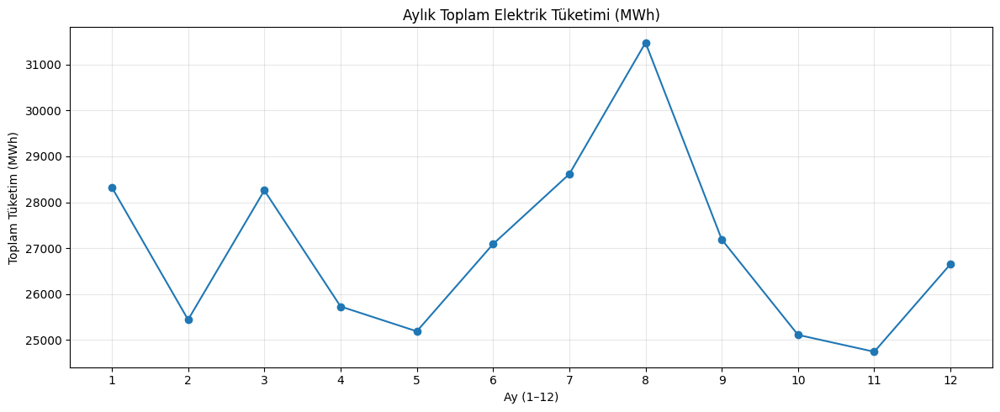

,Yil,Ay,Gunluk_Tuketim
0,2022,1,28323.14573
1,2022,2,25441.46441
2,2022,3,28257.33297
3,2022,4,25729.24510
4,2022,5,25188.51432
5,2022,6,27088.49481
6,2022,7,28611.88321
7,2022,8,31475.42162
8,2022,9,27186.88838
9,2022,10,25110.79197


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Tarihi datetime yap
daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

# Yıl ve Ay kolonları
daily_month["Yil"] = daily_month["Tarih"].dt.year
daily_month["Ay"] = daily_month["Tarih"].dt.month

# Aylık toplam tüketim
monthly_total = (
    daily_month
    .groupby(["Yil", "Ay"])["Gunluk_Tuketim"]
    .sum()
    .reset_index()
)

# Sadece ayları düzenli sıralamak için index'i Ay yap
monthly_total = monthly_total.sort_values(["Yil", "Ay"])

# ---- EN YÜKSEK VE EN DÜŞÜK AY ----
max_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmax()]
min_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmin()]

print(" En yüksek tüketim:")
print(f"  → Yıl: {max_row['Yil']}, Ay: {max_row['Ay']}, Toplam MWh: {max_row['Gunluk_Tuketim']:.2f}")

print(" En düşük tüketim:")
print(f"  → Yıl: {min_row['Yil']}, Ay: {min_row['Ay']}, Toplam MWh: {min_row['Gunluk_Tuketim']:.2f}")

# ---- GRAFİK ----
plt.figure(figsize=(12,5))
plt.plot(
    monthly_total["Ay"],
    monthly_total["Gunluk_Tuketim"],
    marker="o"
)
plt.title("Aylık Toplam Elektrik Tüketimi (MWh)")
plt.xlabel("Ay (1–12)")
plt.ylabel("Toplam Tüketim (MWh)")
plt.xticks(ticks=range(1,13))   # 1'den 12'ye kadar x ekseni
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

monthly_total


    Saat_num    Tuketim
0          0  34.484496
1          1  32.867872
2          2  31.708385
3          3  30.985226
4          4  30.643891
5          5  30.379418
6          6  30.494341
7          7  32.164394
8          8  36.551612
9          9  39.275768
10        10  40.512148
11        11  41.320407
12        12  40.203296
13        13  40.511860
14        14  41.113839
15        15  40.644005
16        16  40.410328
17        17  40.225978
18        18  39.858019
19        19  39.740530
20        20  39.699271
21        21  38.968632
22        22  37.938167
23        23  36.447150


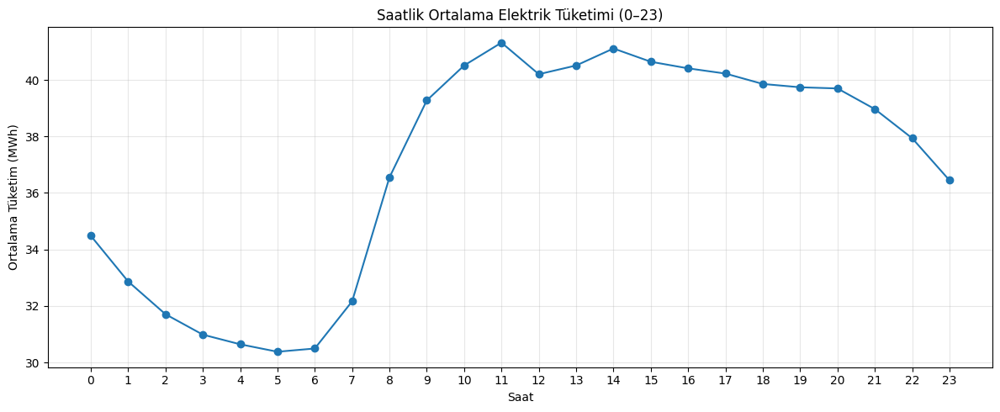

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük toplam yaptığımız saatlik veri burada (df)
df_hourly = df.copy()

# Saat bilgisini çıkaralım (0-23)
df_hourly["Saat_num"] = df_hourly["datetime"].dt.hour

# Her bir saat için ortalama tüketim
hourly_mean = (
    df_hourly
    .groupby("Saat_num")["Tuketim"]
    .mean()
    .reset_index()
)

print(hourly_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(hourly_mean["Saat_num"], hourly_mean["Tuketim"], marker="o")
plt.title("Saatlik Ortalama Elektrik Tüketimi (0–23)")
plt.xlabel("Saat")
plt.ylabel("Ortalama Tüketim (MWh)")
plt.xticks(range(0,24))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


    Gun  Gunluk_Tuketim
0     1      890.244415
1     2      873.697309
2     3      869.236358
3     4      874.812960
4     5      888.517015
5     6      877.076422
6     7      894.516264
7     8      884.120498
8     9      865.204655
9    10      874.226022
10   11      870.100303
11   12      874.201753
12   13      873.575978
13   14      897.483415
14   15      892.317627
15   16      885.980785
16   17      894.328572
17   18      904.491680
18   19      900.487192
19   20      890.477492
20   21      907.582555
21   22      908.167564
22   23      895.127661
23   24      890.124712
24   25      887.504283
25   26      891.103837
26   27      879.920889
27   28      899.360824
28   29      895.206961
29   30      880.075304
30   31      896.203267


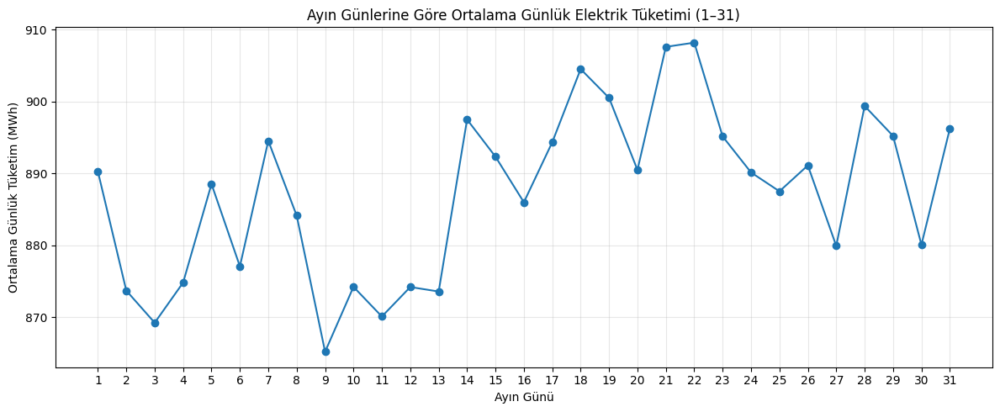

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# daily dataframe'ini kullanıyoruz
daily_dom = daily.copy()
daily_dom["Tarih"] = pd.to_datetime(daily_dom["Tarih"])

# Ayın gününü çıkar (1–31)
daily_dom["Gun"] = daily_dom["Tarih"].dt.day

# 1–31 için ortalama günlük tüketim
dom_mean = (
    daily_dom
    .groupby("Gun")["Gunluk_Tuketim"]
    .mean()
    .reset_index()
)

print(dom_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
plt.title("Ayın Günlerine Göre Ortalama Günlük Elektrik Tüketimi (1–31)")
plt.xlabel("Ayın Günü")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.xticks(range(1, 32))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



Ocak ayı için:
  📈 En yüksek tüketim günü  : 18. gün (1002.71 MWh)
  📉 En düşük tüketim günü   : 1. gün (754.26 MWh)


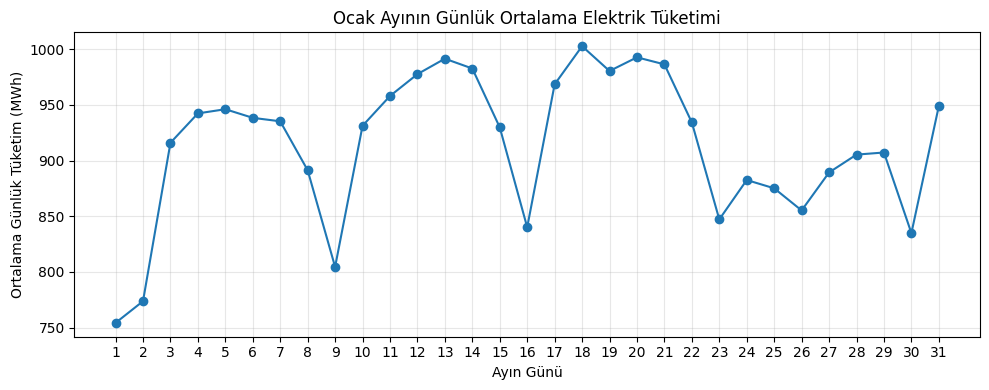


Şubat ayı için:
  📈 En yüksek tüketim günü  : 1. gün (968.62 MWh)
  📉 En düşük tüketim günü   : 20. gün (785.80 MWh)


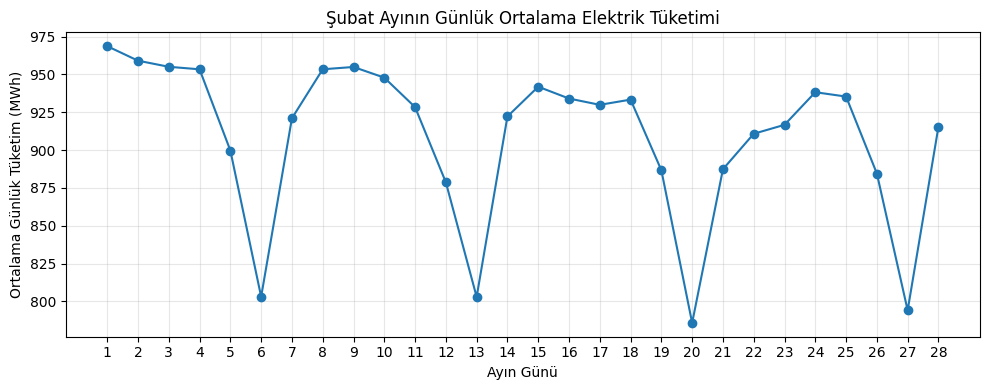


Mart ayı için:
  📈 En yüksek tüketim günü  : 18. gün (968.24 MWh)
  📉 En düşük tüketim günü   : 27. gün (774.88 MWh)


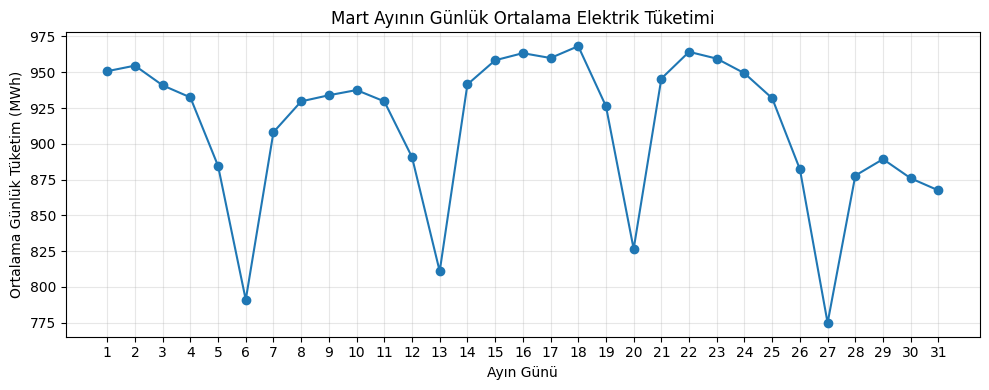


Nisan ayı için:
  📈 En yüksek tüketim günü  : 14. gün (913.02 MWh)
  📉 En düşük tüketim günü   : 3. gün (720.49 MWh)


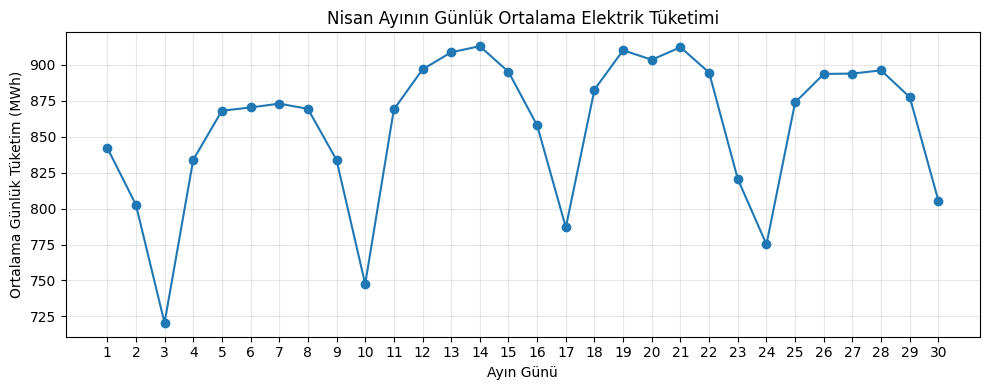


Mayıs ayı için:
  📈 En yüksek tüketim günü  : 31. gün (936.26 MWh)
  📉 En düşük tüketim günü   : 2. gün (568.65 MWh)


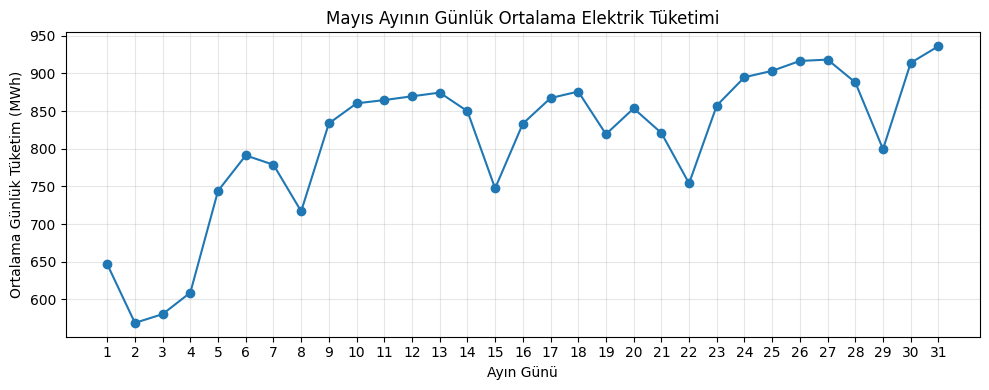


Haziran ayı için:
  📈 En yüksek tüketim günü  : 30. gün (966.52 MWh)
  📉 En düşük tüketim günü   : 12. gün (765.23 MWh)


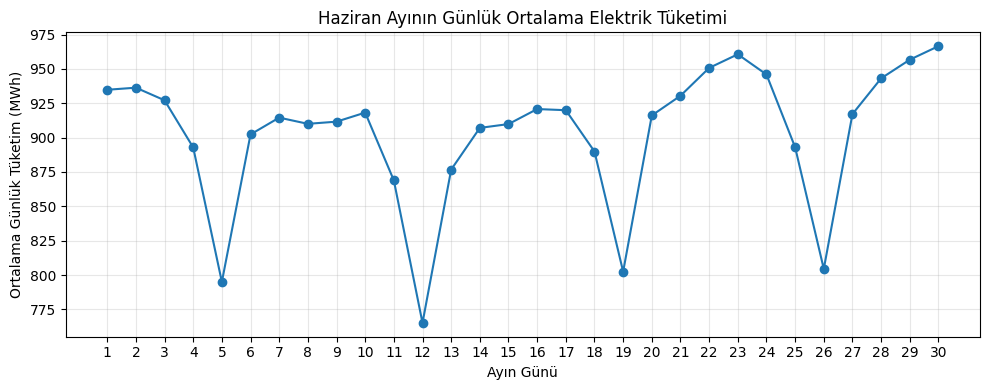


Temmuz ayı için:
  📈 En yüksek tüketim günü  : 28. gün (1067.57 MWh)
  📉 En düşük tüketim günü   : 10. gün (671.85 MWh)


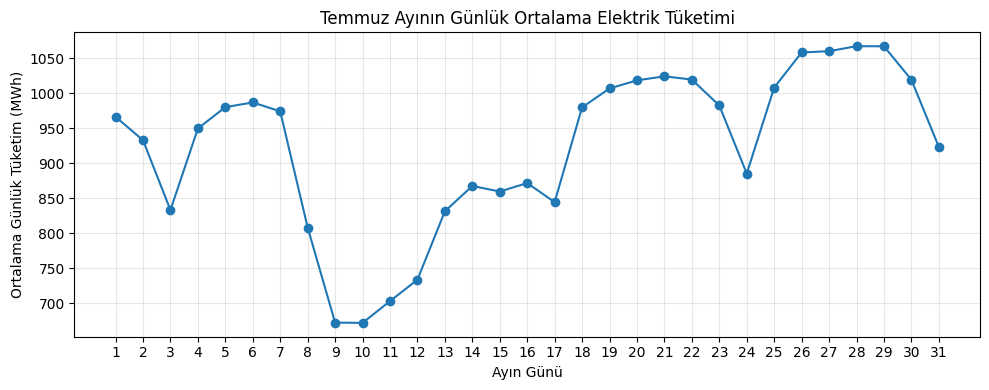


Ağustos ayı için:
  📈 En yüksek tüketim günü  : 4. gün (1078.86 MWh)
  📉 En düşük tüketim günü   : 28. gün (869.38 MWh)


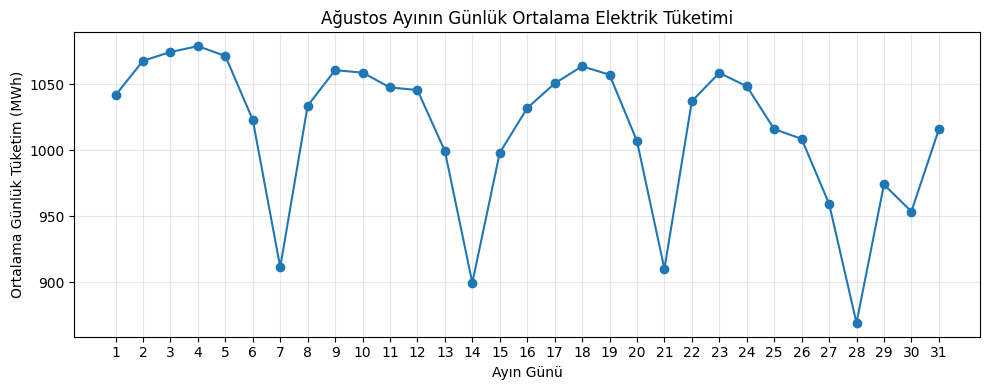


Eylül ayı için:
  📈 En yüksek tüketim günü  : 2. gün (1027.09 MWh)
  📉 En düşük tüketim günü   : 25. gün (736.23 MWh)


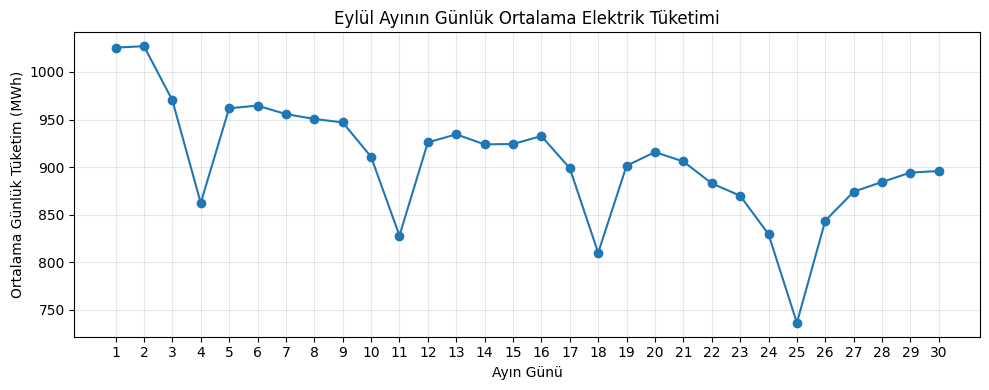


Ekim ayı için:
  📈 En yüksek tüketim günü  : 4. gün (872.24 MWh)
  📉 En düşük tüketim günü   : 30. gün (682.21 MWh)


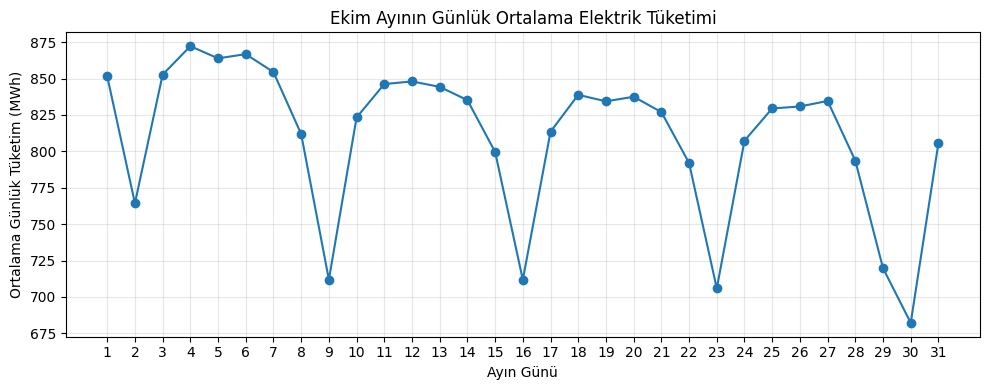


Kasım ayı için:
  📈 En yüksek tüketim günü  : 29. gün (880.97 MWh)
  📉 En düşük tüketim günü   : 6. gün (705.71 MWh)


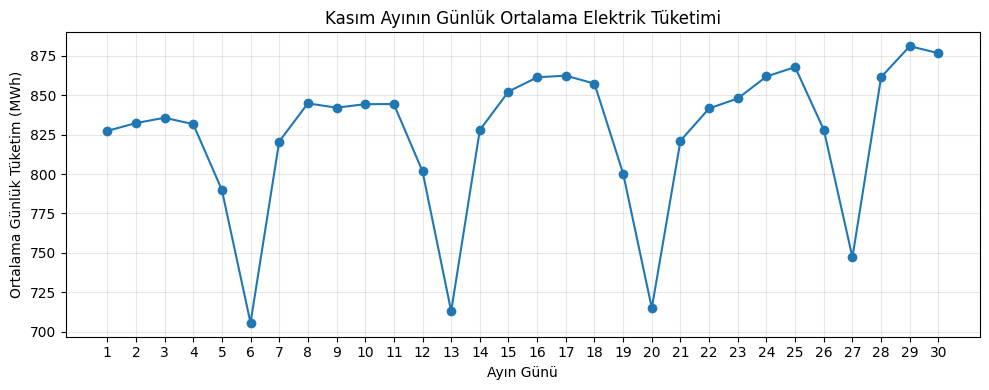


Aralık ayı için:
  📈 En yüksek tüketim günü  : 21. gün (919.39 MWh)
  📉 En düşük tüketim günü   : 4. gün (739.17 MWh)


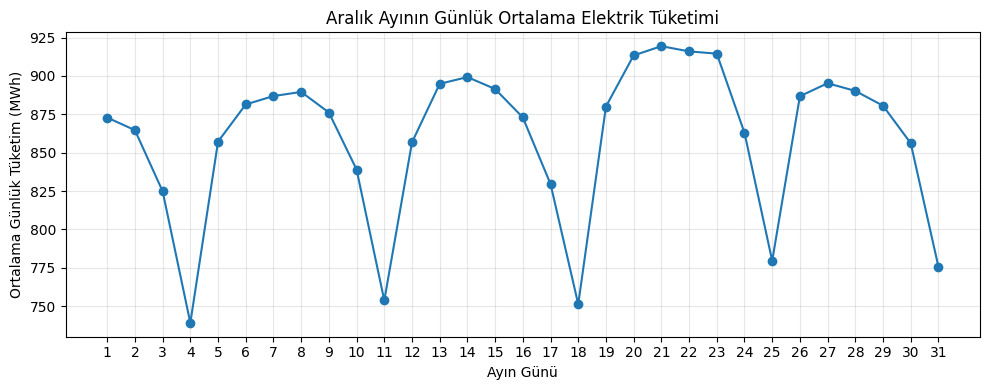

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

daily_month["Ay"] = daily_month["Tarih"].dt.month
daily_month["Gun"] = daily_month["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

for ay in range(1, 13):

    df_ay = daily_month[daily_month["Ay"] == ay]

    if df_ay.empty:
        continue

    # Günlere göre ortalama günlük tüketim
    dom_mean = (
        df_ay.groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    # ====== EN YÜKSEK / EN DÜŞÜK GÜN ======
    max_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmax()]
    min_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmin()]

    print(f"\n{ay_isimleri[ay]} ayı için:")
    print(f"  📈 En yüksek tüketim günü  : {int(max_row['Gun'])}. gün "
          f"({max_row['Gunluk_Tuketim']:.2f} MWh)")
    print(f"  📉 En düşük tüketim günü   : {int(min_row['Gun'])}. gün "
          f"({min_row['Gunluk_Tuketim']:.2f} MWh)")

    # ====== GRAFİK ======
    plt.figure(figsize=(10, 4))
    plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
    plt.title(f"{ay_isimleri[ay]} Ayının Günlük Ortalama Elektrik Tüketimi")
    plt.xlabel("Ayın Günü")
    plt.ylabel("Ortalama Günlük Tüketim (MWh)")
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, dom_mean["Gun"].max() + 1))
    plt.tight_layout()
    plt.show()




=== MODEL: SADECE TATİL/BAYRAM (EVENT) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     9.386
Date:                Sat, 27 Dec 2025   Prob (F-statistic):            0.00235
Time:                        15:44:32   Log-Likelihood:                -2140.0
No. Observations:                 365   AIC:                             4284.
Df Residuals:                     363   BIC:                             4292.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const  

/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1966: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


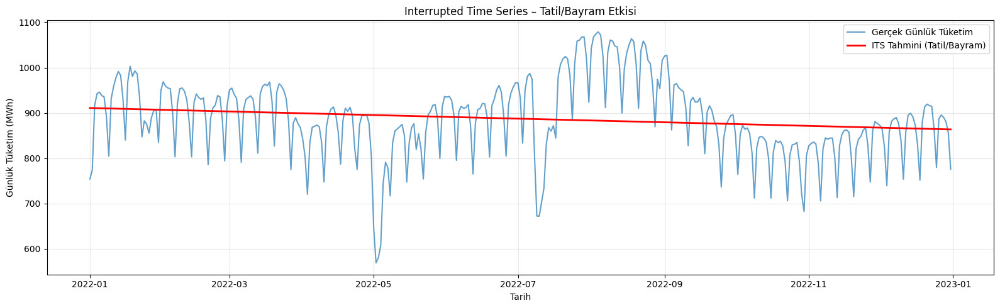

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# =========================
# 0) GÜNLÜK VERİYİ HAZIRLA
# =========================

df = daily.copy()
df["Tarih"] = pd.to_datetime(df["Tarih"])
df = df.sort_values("Tarih").reset_index(drop=True)

# Zaman indexi (t)
df["t"] = np.arange(len(df))

# =========================
# =========================# =========================
# 1) 2022 RESMÎ TATİLLER
# =========================

holiday_info_2022 = [
    # Yılbaşı
    ("2022-01-01", 1),

    # 23 Nisan
    ("2022-04-23", 1),

    # 1 Mayıs + Ramazan Bayramı
    ("2022-05-01", 1),    # Emek ve Dayanışma Günü + Arefe
    ("2022-05-02", 1),    # Ramazan Bayramı 1. Gün
    ("2022-05-03", 1),    # 2. Gün
    ("2022-05-04", 1),    # 3. Gün

    # 19 Mayıs
    ("2022-05-19", 1),

    # Kurban Bayramı
    ("2022-07-08", 0.5),  # Arefe (yarım gün)
    ("2022-07-09", 1),    # 1. Gün
    ("2022-07-10", 1),    # 2. Gün
    ("2022-07-11", 1),    # 3. Gün
    ("2022-07-12", 1),    # 4. Gün

    # 15 Temmuz
    ("2022-07-15", 1),

    # 30 Ağustos
    ("2022-08-30", 1),

    # Cumhuriyet Bayramı
    ("2022-10-28", 0.5),  # 28 Ekim (yarım gün)
    ("2022-10-29", 1),
]

holiday_df = pd.DataFrame(
    holiday_info_2022, columns=["Tarih", "holiday_weight"]
)
holiday_df["Tarih"] = pd.to_datetime(holiday_df["Tarih"])



# =========================
# 2) EVENT DUMMY'LERİNİ OLUŞTUR
#    (MAÇ YOK)
# =========================

df["is_holiday"] = df["Tarih"].isin(holiday_dates).astype(int)

# Eski mantığı korumak için:
# is_event = is_holiday
df["is_event"] = df["is_holiday"]

# Etkileşim terimleri (trend * event)
df["t_event"]   = df["t"] * df["is_event"]
df["t_holiday"] = df["t"] * df["is_holiday"]

y = df["Gunluk_Tuketim"]

# =========================
# 3) MODEL 1 – TEK "EVENT" (ARTIK SADECE TATİL)
# =========================

X1 = df[["t", "is_event", "t_event"]]
X1 = sm.add_constant(X1)

model1 = sm.OLS(y, X1).fit()

print("\n\n=== MODEL: SADECE TATİL/BAYRAM (EVENT) ===")
print(model1.summary())

# =========================
# 5) MODEL 1 İÇİN TAHMİN VE GRAFİK
# =========================

df["pred_event"] = model1.predict(X1)

plt.figure(figsize=(16,5))
plt.plot(df["Tarih"], df["Gunluk_Tuketim"], label="Gerçek Günlük Tüketim", alpha=0.7)
plt.plot(df["Tarih"], df["pred_event"], label="ITS Tahmini (Tatil/Bayram)", color="red", linewidth=2)

# Sadece tatil/bayram çizgileri
for d in holiday_dates:
    if d >= df["Tarih"].min() and d <= df["Tarih"].max():
        plt.axvline(d, color="green", linestyle="--", alpha=0.4)

plt.title("Interrupted Time Series – Tatil/Bayram Etkisi")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


/tmp/ipykernel_47/924049934.py:15: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")


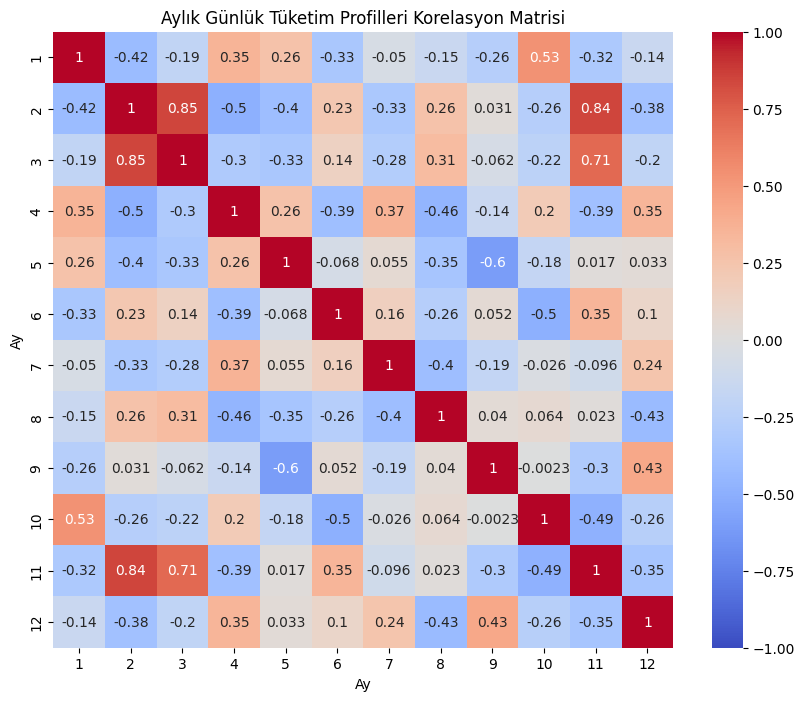

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Aylık günlük ortalamaları geniş formata alalım
pivot = daily_month.pivot_table(
    index="Gun",
    columns="Ay",
    values="Gunluk_Tuketim",
    aggfunc="mean"
)

# Şubat 29 vs eksik günleri dolduralım (interpolate)
pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")

# Korelasyon matrisi
corr = pivot.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Aylık Günlük Tüketim Profilleri Korelasyon Matrisi")
plt.show()




/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less
  return op(a, b)


🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:
2022-01-09  →  804.53 MWh
2022-01-16  →  840.12 MWh
2022-02-06  →  803.07 MWh
2022-02-13  →  802.96 MWh
2022-02-20  →  785.80 MWh
2022-02-27  →  794.11 MWh
2022-03-06  →  791.02 MWh
2022-03-13  →  810.94 MWh
2022-03-20  →  826.57 MWh
2022-04-03  →  720.49 MWh
2022-04-10  →  747.56 MWh
2022-04-17  →  786.95 MWh
2022-05-02  →  568.65 MWh
2022-05-03  →  580.26 MWh
2022-05-04  →  608.88 MWh
2022-05-15  →  747.37 MWh
2022-05-29  →  799.41 MWh
2022-06-05  →  795.06 MWh
2022-06-12  →  765.23 MWh
2022-06-19  →  802.50 MWh
2022-06-26  →  804.49 MWh
2022-07-03  →  833.24 MWh
2022-07-24  →  885.42 MWh
2022-07-31  →  923.45 MWh
2022-08-07  →  911.54 MWh
2022-08-14  →  899.74 MWh
2022-08-21  →  910.23 MWh
2022-09-11  →  827.87 MWh
2022-09-18  →  809.89 MWh
2022-09-25  →  736.23 MWh
2022-10-02  →  764.37 MWh
2022-10-09  →  711.92 MWh
2022-10-16  →  711.84 MWh
2022-10-23  →  705.91 MWh
2022-11-06  →  705.71 MWh
2022-11-13  →  713.06 MWh
2022-11-20  →  71

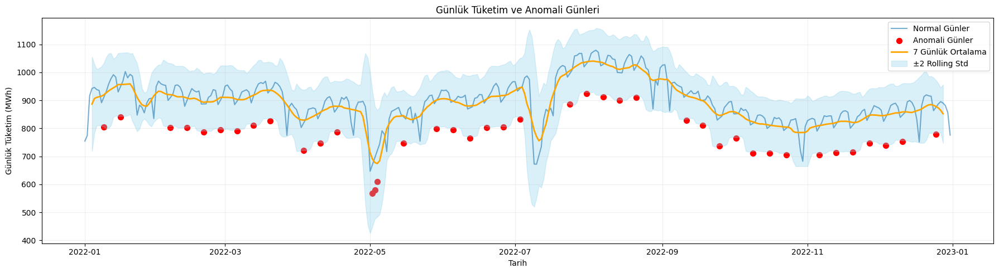

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==== 1) DAILY DATAFRAME'İN VAR OLDUĞUNU KABUL EDİYORUZ ====
# Eğer yoksa, önce df -> daily kısmını ÇALIŞTIRMAN lazım.
# daily: [Tarih, Gunluk_Tuketim]

daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# ==== 2) ANOMALİ DATAFRAME'İ (ana) OLUŞTUR ====
ana = daily.copy()

# --- Global z-score ---
mu = ana["Gunluk_Tuketim"].mean()
sigma = ana["Gunluk_Tuketim"].std()

ana["zscore"] = (ana["Gunluk_Tuketim"] - mu) / sigma
ana["is_z_anom"] = ana["zscore"].abs() > 3   # eşik: |z| > 3

# --- Rolling mean/std ---
window = 7
ana["roll_mean"] = ana["Gunluk_Tuketim"].rolling(window=window, center=True).mean()
ana["roll_std"]  = ana["Gunluk_Tuketim"].rolling(window=window, center=True).std()

upper = ana["roll_mean"] + 2 * ana["roll_std"]
lower = ana["roll_mean"] - 2 * ana["roll_std"]

ana["is_roll_anom"] = (ana["Gunluk_Tuketim"] > upper) | (ana["Gunluk_Tuketim"] < lower)

# --- Kombine etiket ---
ana["is_anom"] = ana["is_z_anom"] | ana["is_roll_anom"]

# ==== 3) SENİN KODUN: ANOMALİLERİ YAZDIR + GRAFİĞİ ÇİZ ====
df = ana.copy()   # senin koduna dokunmadan kullanabilelim

# Sadece anomalileri seç
anom_points = df[df["is_anom"]][["Tarih", "Gunluk_Tuketim"]]

# ---- TARİHLERİ YAZDIR ----
print("🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:")
for idx, row in anom_points.iterrows():
    print(f"{row['Tarih'].date()}  →  {row['Gunluk_Tuketim']:.2f} MWh")

# ---- GRAFİK ----
plt.figure(figsize=(18,5))

# Normal günler
plt.plot(df.loc[~df["is_anom"], "Tarih"],
         df.loc[~df["is_anom"], "Gunluk_Tuketim"],
         color="#1f77b4", alpha=0.6, label="Normal Günler")

# Anomali günler (kırmızı noktalar)
plt.scatter(df.loc[df["is_anom"], "Tarih"],
            df.loc[df["is_anom"], "Gunluk_Tuketim"],
            color="red", s=50, label="Anomali Günler")

# Rolling ortalama
plt.plot(df["Tarih"], df["roll_mean"], color="orange", linewidth=2, label=f"{window} Günlük Ortalama")

# Rolling band (±2 std)
plt.fill_between(df["Tarih"],
                 df["roll_mean"] - 2*df["roll_std"],
                 df["roll_mean"] + 2*df["roll_std"],
                 color="skyblue", alpha=0.3, label="±2 Rolling Std")

plt.title("Günlük Tüketim ve Anomali Günleri")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.2)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# daily = senin günlük dataframe'in
gunluk = daily.copy()
gunluk["Tarih"] = pd.to_datetime(gunluk["Tarih"])

# Ay ve gün bilgileri
gunluk["AyNo"] = gunluk["Tarih"].dt.month
gunluk["GunEN"] = gunluk["Tarih"].dt.day_name()

gun_mapping = {
    "Monday": "Pazartesi",
    "Tuesday": "Salı",
    "Wednesday": "Çarşamba",
    "Thursday": "Perşembe",
    "Friday": "Cuma",
    "Saturday": "Cumartesi",
    "Sunday": "Pazar"
}

gun_sira = {
    "Pazartesi": 1,
    "Salı": 2,
    "Çarşamba": 3,
    "Perşembe": 4,
    "Cuma": 5,
    "Cumartesi": 6,
    "Pazar": 7
}

gunluk["Gün"] = gunluk["GunEN"].map(gun_mapping)
gunluk["GunSira"] = gunluk["Gün"].map(gun_sira)

ay_isimleri = {
    1:"Ocak",2:"Şubat",3:"Mart",4:"Nisan",5:"Mayıs",6:"Haziran",
    7:"Temmuz",8:"Ağustos",9:"Eylül",10:"Ekim",11:"Kasım",12:"Aralık"
}

# ---- Gün istatistikleri (12 ay tek tabloda) ----
gun_istatistik_tum = (
    gunluk
    .groupby(["AyNo","Gün"])["Gunluk_Tuketim"]
    .agg(["mean","min","max","std","count"])
    .reset_index()
)

gun_istatistik_tum["Ay"] = gun_istatistik_tum["AyNo"].map(ay_isimleri)
gun_istatistik_tum["GunSira"] = gun_istatistik_tum["Gün"].map(gun_sira)
gun_istatistik_tum = gun_istatistik_tum.sort_values(["AyNo","GunSira"])

gun_istatistik_tum = gun_istatistik_tum.rename(columns={
    "mean":"Ortalama (MWh)",
    "min":"Minimum (MWh)",
    "max":"Maksimum (MWh)",
    "std":"Std Sapma (MWh)",
    "count":"Gün Sayısı"
})

# ---- Her ay için tablo + en kararlı / en değişken ----
for ay_no in range(1,13):
    ay_adi = ay_isimleri[ay_no]
    alt = gun_istatistik_tum[gun_istatistik_tum["AyNo"] == ay_no].copy()
    if alt.empty:
        continue

    print(f"\n\n=== 2023 {ay_adi} - Günlere Göre Elektrik Tüketimi İstatistikleri ===\n")
    print(
        alt[["Gün","Ortalama (MWh)","Minimum (MWh)","Maksimum (MWh)",
             "Std Sapma (MWh)","Gün Sayısı"]]
        .round(2)
        .to_string(index=False)
    )

    en_stabil = alt.loc[alt["Std Sapma (MWh)"].idxmin()]
    en_degisen = alt.loc[alt["Std Sapma (MWh)"].idxmax()]

    print(f"\n-> En KARARLI gün: {en_stabil['Gün']}  (Std Sapma: {en_stabil['Std Sapma (MWh)']:.2f} MWh)")
    print(f"-> En DEĞİŞKEN gün: {en_degisen['Gün']}  (Std Sapma: {en_degisen['Std Sapma (MWh)']:.2f} MWh)")

# ---- Özet tablo ----
stabil_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmin(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Kararlı Gün"})

degisen_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmax(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Değişken Gün","Std Sapma (MWh)":"Std Sapma (MWh) - Değişken"})

ozet = stabil_ozet.merge(degisen_ozet, on="Ay")

print("\n\n=== ÖZET: 2023 Her Ay İçin En Kararlı ve En Değişken Günler ===\n")
print(ozet.round(2).to_string(index=False))




=== 2023 Ocak - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std Sapma (MWh)  Gün Sayısı
Pazartesi          929.42         882.52          968.46            32.75           5
     Salı          944.53         875.09         1002.71            52.89           4
 Çarşamba          939.83         855.21          980.41            58.51           4
 Perşembe          952.95         889.32          992.68            49.41           4
     Cuma          952.41         905.34          986.37            39.06           4
Cumartesi          883.36         754.26          934.19            74.23           5
    Pazar          820.08         773.72          847.16            30.60           5

-> En KARARLI gün: Pazar  (Std Sapma: 30.60 MWh)
-> En DEĞİŞKEN gün: Cumartesi  (Std Sapma: 74.23 MWh)


=== 2023 Şubat - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std Sapma (

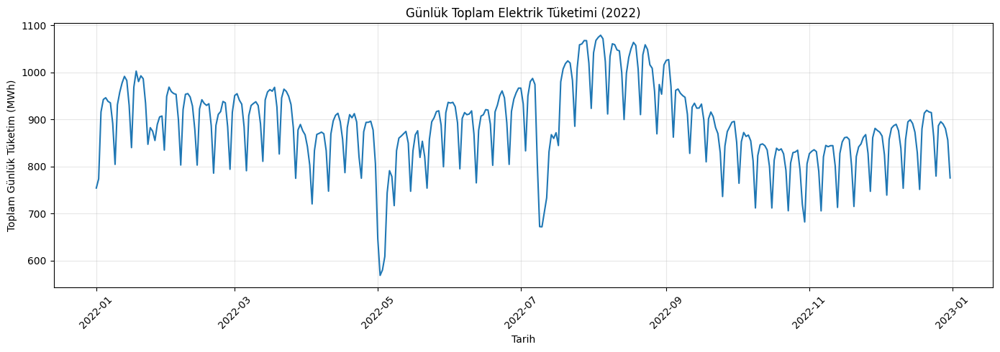

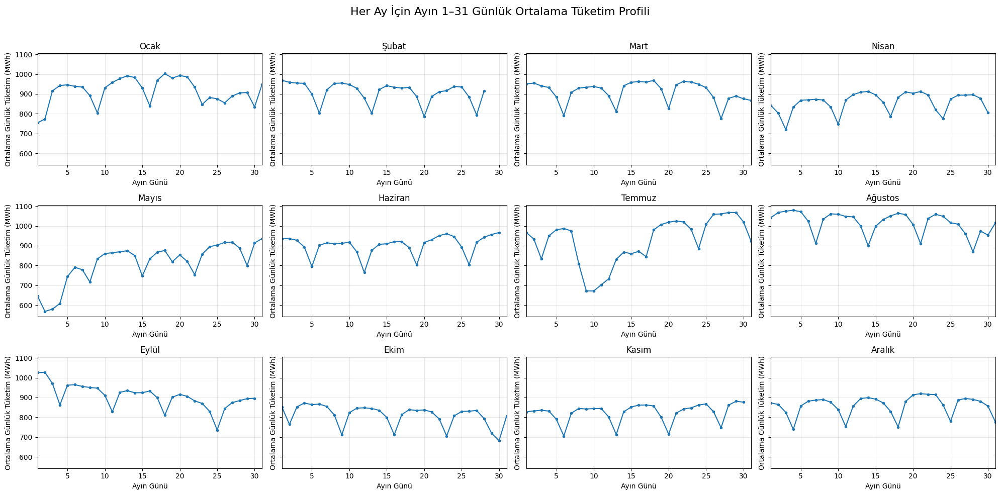

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ===================== 1) CSV'Yİ OKU VE TEMİZLE =====================
path = "/kaggle/input/tuketim2022/Gercek_Zamanli_Tuketim-01012022-31122022.csv"

df = pd.read_csv(
    path,
    sep=";",              # EPİAŞ CSV genelde ;
    engine="python",
    on_bad_lines="skip"   # bozuk satırları at
)

# Gereksiz kolonları sil
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# İsimleri sadeleştir
df = df.rename(columns={
    "Tarih": "Tarih",
    "Saat": "Saat",
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# Boş tarih/saat satırlarını at
df = df.dropna(subset=["Tarih", "Saat"])

# Tarih + saat stringi oluştur
df["datetime_str"] = df["Tarih"].astype(str).str.strip() + " " + df["Saat"].astype(str).str.strip()

# Datetime'a çevir
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# Datetime oluşmayanları at
df = df.dropna(subset=["datetime"])

# Tüketimi numeriğe çevir
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)   # binlik ayraç
    .str.replace(",", ".", regex=False)  # ondalık virgül -> nokta
)
df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# ===================== 2) GÜNLÜK TOPLAMA (daily) =====================
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]
daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# İstersen günlük grafiği de bir kontrol edelim:
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.title("Günlük Toplam Elektrik Tüketimi (2022)")
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ===================== 3) HER AY İÇİN 1–31 GÜNLÜK ORTALAMA GRAFİKLER =====================

dm = daily.copy()
dm["Ay"] = dm["Tarih"].dt.month
dm["Gun"] = dm["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

fig, axes = plt.subplots(3, 4, figsize=(20, 10), sharey=True)
fig.suptitle("Her Ay İçin Ayın 1–31 Günlük Ortalama Tüketim Profili", fontsize=16)

for ay in range(1, 13):
    ax = axes[(ay-1)//4, (ay-1)%4]
    df_ay = dm[dm["Ay"] == ay]

    if df_ay.empty:
        ax.set_visible(False)
        continue

    dom_mean = (
        df_ay
        .groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    ax.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o", markersize=3)
    ax.set_title(ay_isimleri[ay])
    ax.set_xlabel("Ayın Günü")
    ax.set_ylabel("Ortalama Günlük Tüketim (MWh)")
    ax.set_xlim(1, 31)
    ax.grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


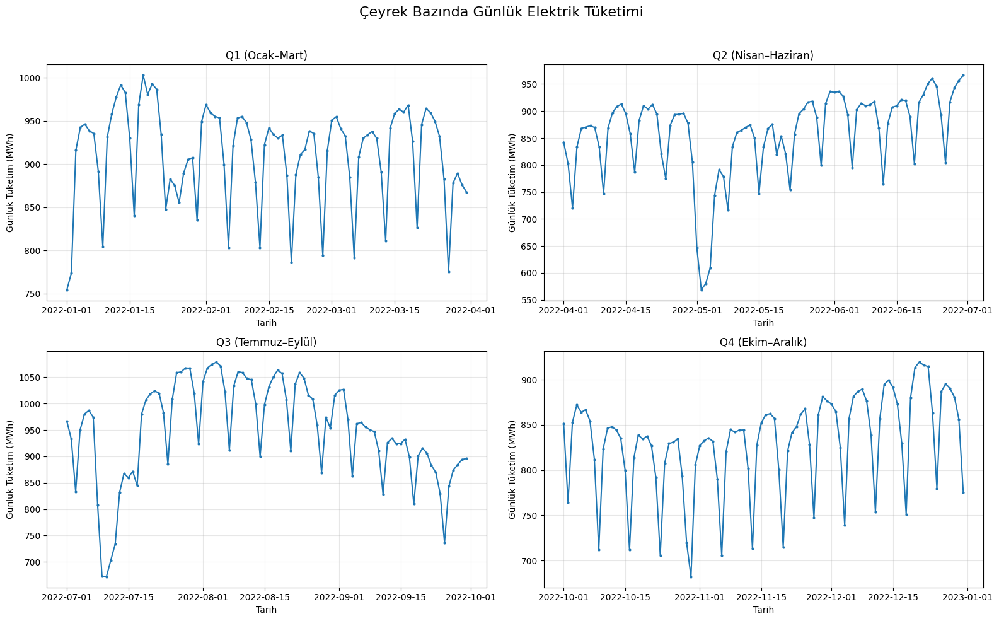


🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):
Q1 (Ocak–Mart) → 82021.94 MWh
Q2 (Nisan–Haziran) → 78006.25 MWh
Q3 (Temmuz–Eylül) → 87274.19 MWh
Q4 (Ekim–Aralık) → 76507.01 MWh

🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:
Q1 (Ocak–Mart) → Q2 (Nisan–Haziran) : %-4.90 büyüme
Q2 (Nisan–Haziran) → Q3 (Temmuz–Eylül) : %11.88 büyüme
Q3 (Temmuz–Eylül) → Q4 (Ekim–Aralık) : %-12.34 büyüme


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük veri
df_q = daily.copy()
df_q["Tarih"] = pd.to_datetime(df_q["Tarih"])
df_q["Yil"] = df_q["Tarih"].dt.year
df_q["Ay"]  = df_q["Tarih"].dt.month

# Çeyrek belirleyelim
df_q["Ceyrek"] = ((df_q["Ay"] - 1) // 3) + 1   # 1→Q1, 2→Q2, 3→Q3, 4→Q4

# Çeyrek isimleri
q_labels = {1: "Q1 (Ocak–Mart)", 2: "Q2 (Nisan–Haziran)",
            3: "Q3 (Temmuz–Eylül)", 4: "Q4 (Ekim–Aralık)"}

# =======================================================
# 1) HER ÇEYREK İÇİN GRAFİKLERİ ÇİZ
# =======================================================

plt.figure(figsize=(16,10))

for q in range(1, 5):
    df_sub = df_q[df_q["Ceyrek"] == q]

    ax = plt.subplot(2, 2, q)
    ax.plot(df_sub["Tarih"], df_sub["Gunluk_Tuketim"], marker="o", markersize=2)
    ax.set_title(q_labels[q])
    ax.set_xlabel("Tarih")
    ax.set_ylabel("Günlük Tüketim (MWh)")
    ax.grid(True, alpha=0.3)

plt.suptitle("Çeyrek Bazında Günlük Elektrik Tüketimi", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# =======================================================
# 2) HER ÇEYREĞİN TOPLAM TÜKETİMİ
# =======================================================

quarter_total = df_q.groupby("Ceyrek")["Gunluk_Tuketim"].sum()
print("\n🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):")
for q in range(1,5):
    print(f"{q_labels[q]} → {quarter_total[q]:.2f} MWh")

# =======================================================
# 3) ÇEYREKLER ARASI BÜYÜME ORANI (%)
# =======================================================

print("\n🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:")

for q in range(2, 5):
    prev = quarter_total[q-1]
    curr = quarter_total[q]
    growth = ((curr - prev) / prev) * 100

    print(f"{q_labels[q-1]} → {q_labels[q]} : %{growth:.2f} büyüme")



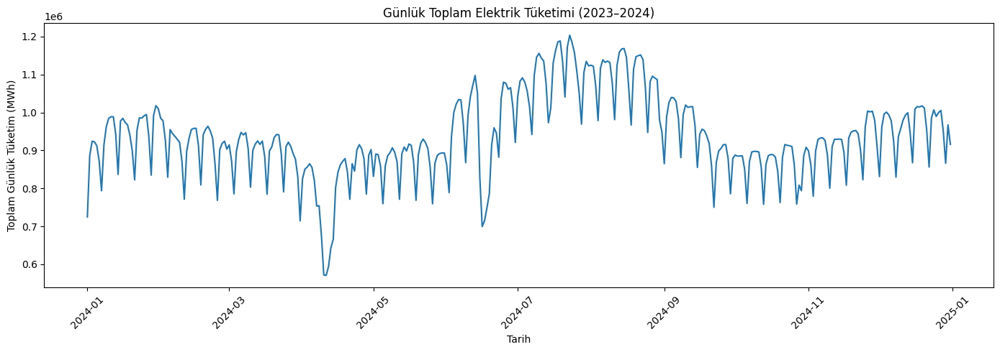

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

path = "//kaggle/input/tuketim2024/Gercek_Zamanli_Tuketim-01012024-31122024.csv"

# 1) CSV'yi oku
df = pd.read_csv(
    path,
    sep=";",
    engine="python",
    on_bad_lines="skip"
)

# 2) Gereksiz kolonları kaldır
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# 3) Kolon adlarını düzenle
df = df.rename(columns={
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# 4) Tarih veya Saat'i boş olan satırları kaldır
df = df.dropna(subset=["Tarih", "Saat"])

# 5) Tarih + Saat stringi oluştur
df["datetime_str"] = (
    df["Tarih"].astype(str).str.strip()
    + " "
    + df["Saat"].astype(str).str.strip()
)

# 6) Datetime formatına dönüştür
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# 7) Datetime dönüşmeyen satırları temizle
df = df.dropna(subset=["datetime"])

# 8) Tüketim değerini numeriğe çevir (Virgülü noktaya, nokta binlikten temizle)
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)     # binlik ayracı sil
    .str.replace(",", ".", regex=False)    # ondalık virgül → nokta
)

df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# 9) Günlük toplam tüketimi hesapla
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]

# 10) Grafiği çiz
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.title("Günlük Toplam Elektrik Tüketimi (2023–2024)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


     Gun_Adi  Gunluk_Tuketim
0  Pazartesi   937989.458302
1       Salı   963630.629057
2   Çarşamba   969443.361731
3   Perşembe   973212.330577
4       Cuma   965411.284038
5  Cumartesi   917377.122115
6      Pazar   826506.059615


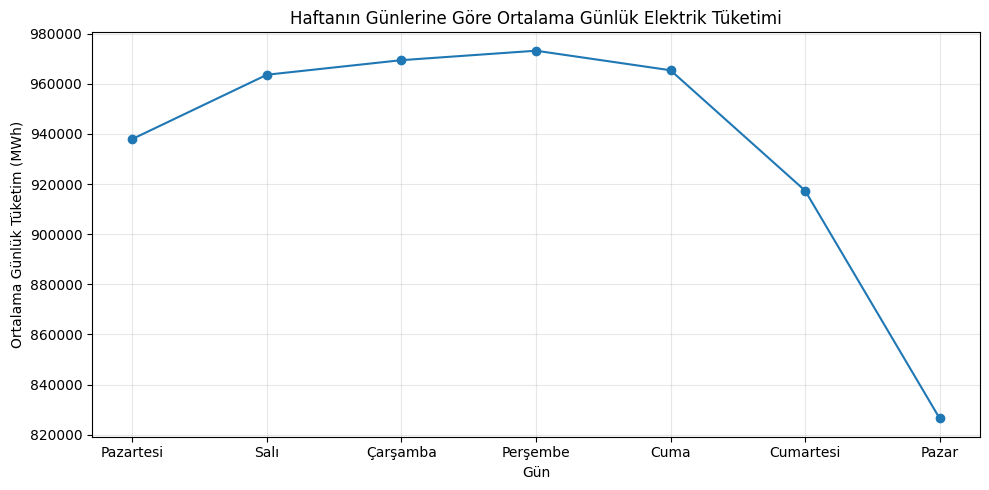

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Tarih kolonunu datetime yap
daily_dt = daily.copy()
daily_dt["Tarih"] = pd.to_datetime(daily_dt["Tarih"])

# 2) Haftanın gününü çıkar (0=Mon ... 6=Sun)
daily_dt["Gun"] = daily_dt["Tarih"].dt.dayofweek

# 3) Gün isimleri ekleyelim (opsiyonel ama daha güzel)
gun_isimleri = {
    0: "Pazartesi",
    1: "Salı",
    2: "Çarşamba",
    3: "Perşembe",
    4: "Cuma",
    5: "Cumartesi",
    6: "Pazar"
}
daily_dt["Gun_Adi"] = daily_dt["Gun"].map(gun_isimleri)

# 4) Haftanın günlerine göre ortalama tüketim
weekly_mean = (
    daily_dt
    .groupby("Gun_Adi")["Gunluk_Tuketim"]
    .mean()
    .reindex(["Pazartesi","Salı","Çarşamba","Perşembe","Cuma","Cumartesi","Pazar"])
    .reset_index()
)

print(weekly_mean)

# 5) Grafiği çiz
plt.figure(figsize=(10,5))
plt.plot(weekly_mean["Gun_Adi"], weekly_mean["Gunluk_Tuketim"], marker="o")
plt.title("Haftanın Günlerine Göre Ortalama Günlük Elektrik Tüketimi")
plt.xlabel("Gün")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


 En yüksek tüketim:
  → Yıl: 2024.0, Ay: 7.0, Toplam MWh: 34105892.65
 En düşük tüketim:
  → Yıl: 2024.0, Ay: 4.0, Toplam MWh: 24060283.58


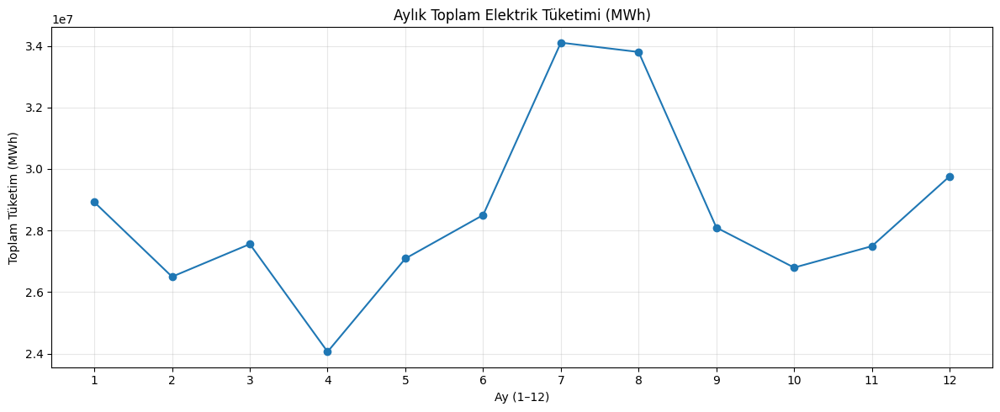

,Yil,Ay,Gunluk_Tuketim
0,2024,1,28921742.23
1,2024,2,26498920.60
2,2024,3,27558761.48
3,2024,4,24060283.58
4,2024,5,27089229.32
5,2024,6,28502827.19
6,2024,7,34105892.65
7,2024,8,33802134.82
8,2024,9,28096564.06
9,2024,10,26795399.81


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Tarihi datetime yap
daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

# Yıl ve Ay kolonları
daily_month["Yil"] = daily_month["Tarih"].dt.year
daily_month["Ay"] = daily_month["Tarih"].dt.month

# Aylık toplam tüketim
monthly_total = (
    daily_month
    .groupby(["Yil", "Ay"])["Gunluk_Tuketim"]
    .sum()
    .reset_index()
)

# Sadece ayları düzenli sıralamak için index'i Ay yap
monthly_total = monthly_total.sort_values(["Yil", "Ay"])

# ---- EN YÜKSEK VE EN DÜŞÜK AY ----
max_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmax()]
min_row = monthly_total.loc[monthly_total["Gunluk_Tuketim"].idxmin()]

print(" En yüksek tüketim:")
print(f"  → Yıl: {max_row['Yil']}, Ay: {max_row['Ay']}, Toplam MWh: {max_row['Gunluk_Tuketim']:.2f}")

print(" En düşük tüketim:")
print(f"  → Yıl: {min_row['Yil']}, Ay: {min_row['Ay']}, Toplam MWh: {min_row['Gunluk_Tuketim']:.2f}")

# ---- GRAFİK ----
plt.figure(figsize=(12,5))
plt.plot(
    monthly_total["Ay"],
    monthly_total["Gunluk_Tuketim"],
    marker="o"
)
plt.title("Aylık Toplam Elektrik Tüketimi (MWh)")
plt.xlabel("Ay (1–12)")
plt.ylabel("Toplam Tüketim (MWh)")
plt.xticks(ticks=range(1,13))   # 1'den 12'ye kadar x ekseni
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

monthly_total


    Saat_num       Tuketim
0          0  36450.186175
1          1  34662.899809
2          2  33300.186339
3          3  32461.535628
4          4  32114.049945
5          5  31936.044563
6          6  32056.222732
7          7  33643.173770
8          8  38142.291667
9          9  40849.697350
10        10  42133.681557
11        11  42974.312814
12        12  41900.568060
13        13  42351.857377
14        14  43123.391202
15        15  42846.951667
16        16  43013.718333
17        17  43230.269044
18        18  42898.972814
19        19  42722.918579
20        20  42700.036940
21        21  41798.117678
22        22  40386.869645
23        23  38606.070492


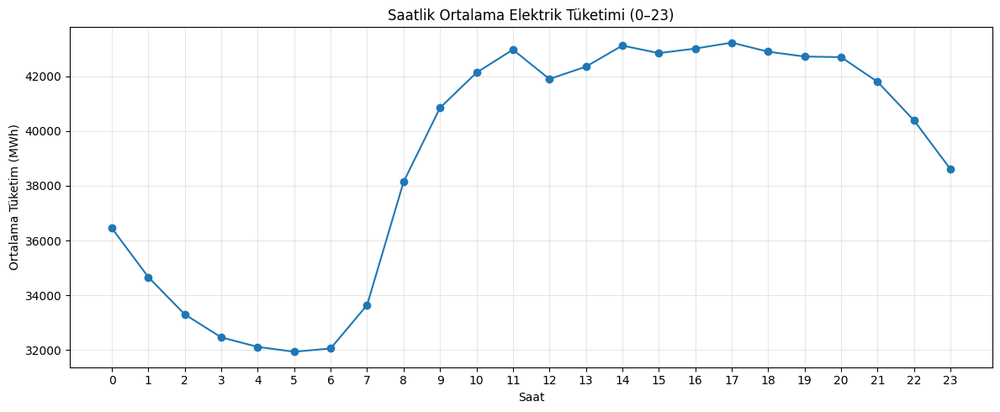

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük toplam yaptığımız saatlik veri burada (df)
df_hourly = df.copy()

# Saat bilgisini çıkaralım (0-23)
df_hourly["Saat_num"] = df_hourly["datetime"].dt.hour

# Her bir saat için ortalama tüketim
hourly_mean = (
    df_hourly
    .groupby("Saat_num")["Tuketim"]
    .mean()
    .reset_index()
)

print(hourly_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(hourly_mean["Saat_num"], hourly_mean["Tuketim"], marker="o")
plt.title("Saatlik Ortalama Elektrik Tüketimi (0–23)")
plt.xlabel("Saat")
plt.ylabel("Ortalama Tüketim (MWh)")
plt.xticks(range(0,24))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


    Gun  Gunluk_Tuketim
0     1   899327.950833
1     2   930769.910000
2     3   930597.123333
3     4   938007.377500
4     5   951401.236667
5     6   944404.824167
6     7   927561.040000
7     8   931342.231667
8     9   936156.024167
9    10   919015.400833
10   11   922403.047500
11   12   941084.063333
12   13   947521.525000
13   14   931668.381667
14   15   925622.153333
15   16   941503.911667
16   17   921329.000000
17   18   924850.075000
18   19   939531.572500
19   20   946694.330833
20   21   934668.874167
21   22   948094.576667
22   23   955849.948333
23   24   947957.963333
24   25   949348.637500
25   26   960916.936667
26   27   950097.417500
27   28   924308.335833
28   29   931958.592500
29   30   938638.565455
30   31   930619.868571


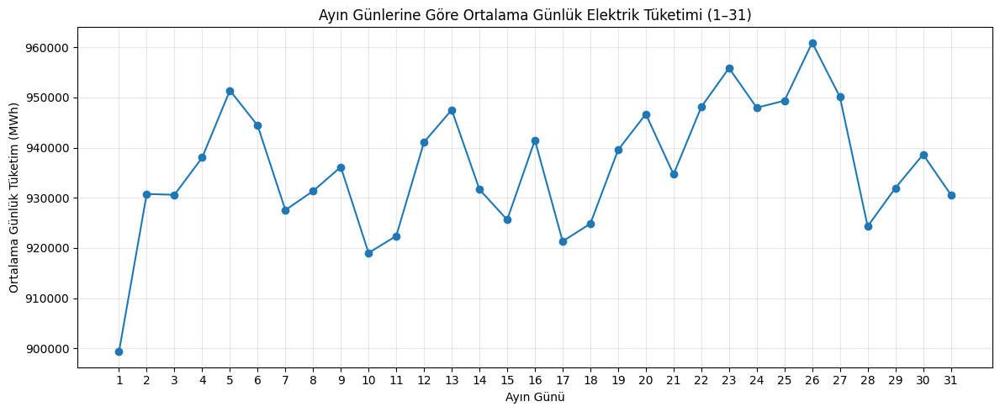

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# daily dataframe'ini kullanıyoruz
daily_dom = daily.copy()
daily_dom["Tarih"] = pd.to_datetime(daily_dom["Tarih"])

# Ayın gününü çıkar (1–31)
daily_dom["Gun"] = daily_dom["Tarih"].dt.day

# 1–31 için ortalama günlük tüketim
dom_mean = (
    daily_dom
    .groupby("Gun")["Gunluk_Tuketim"]
    .mean()
    .reset_index()
)

print(dom_mean)

# Grafik
plt.figure(figsize=(12,5))
plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
plt.title("Ayın Günlerine Göre Ortalama Günlük Elektrik Tüketimi (1–31)")
plt.xlabel("Ayın Günü")
plt.ylabel("Ortalama Günlük Tüketim (MWh)")
plt.xticks(range(1, 32))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



Ocak ayı için:
  📈 En yüksek tüketim günü  : 30. gün (1018137.95 MWh)
  📉 En düşük tüketim günü   : 1. gün (724821.03 MWh)


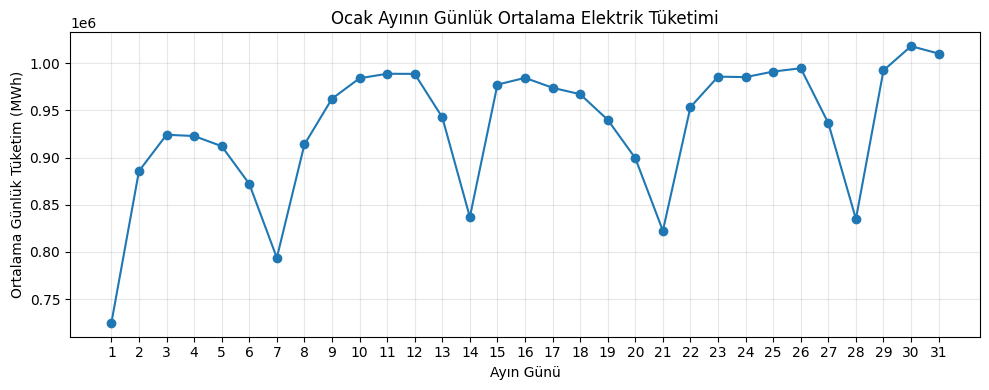


Şubat ayı için:
  📈 En yüksek tüketim günü  : 1. gün (984901.57 MWh)
  📉 En düşük tüketim günü   : 25. gün (768411.83 MWh)


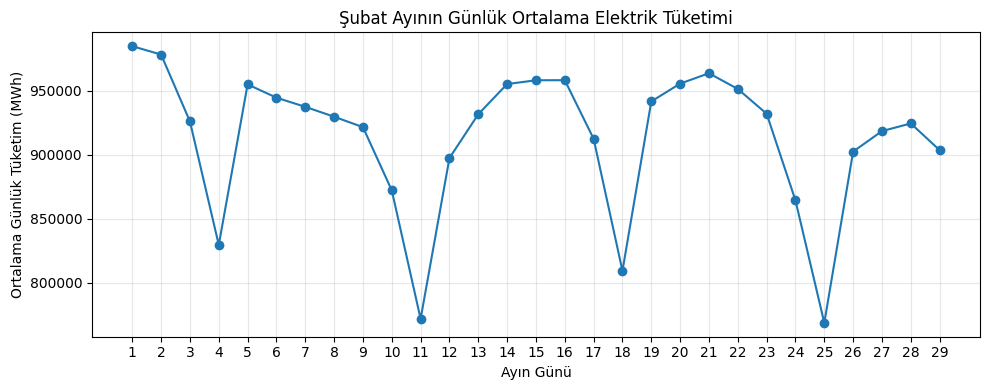


Mart ayı için:
  📈 En yüksek tüketim günü  : 6. gün (947584.16 MWh)
  📉 En düşük tüketim günü   : 31. gün (714451.38 MWh)


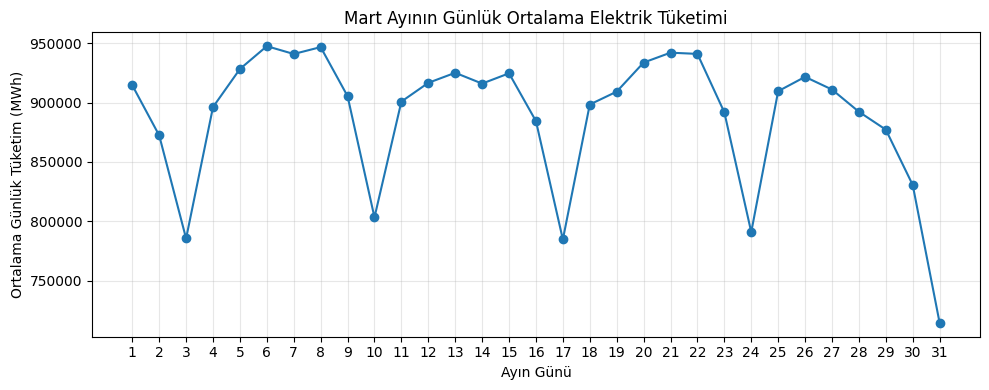


Nisan ayı için:
  📈 En yüksek tüketim günü  : 25. gün (915180.32 MWh)
  📉 En düşük tüketim günü   : 11. gün (570802.05 MWh)


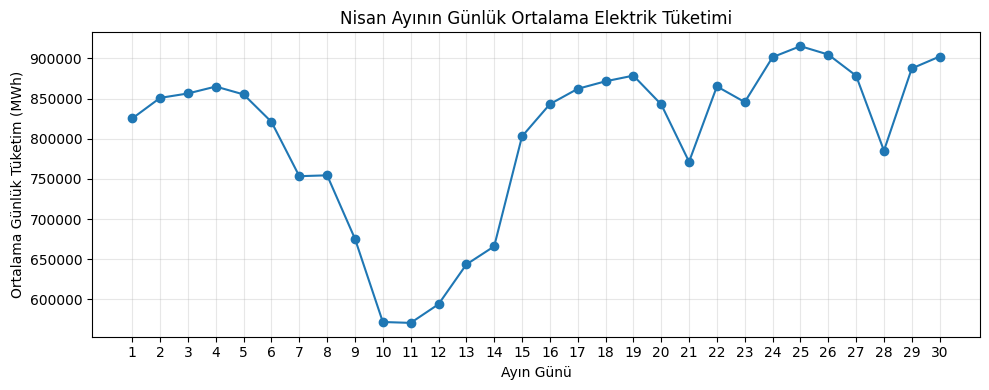


Mayıs ayı için:
  📈 En yüksek tüketim günü  : 22. gün (929872.50 MWh)
  📉 En düşük tüketim günü   : 26. gün (759431.98 MWh)


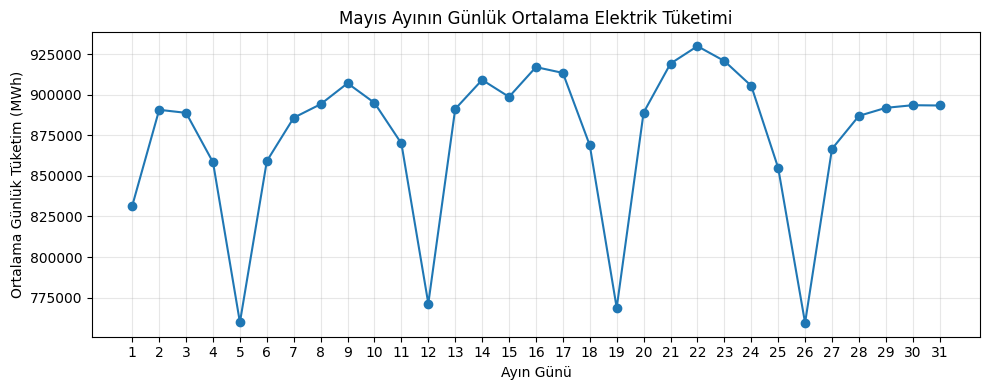


Haziran ayı için:
  📈 En yüksek tüketim günü  : 13. gün (1097731.41 MWh)
  📉 En düşük tüketim günü   : 16. gün (699375.60 MWh)


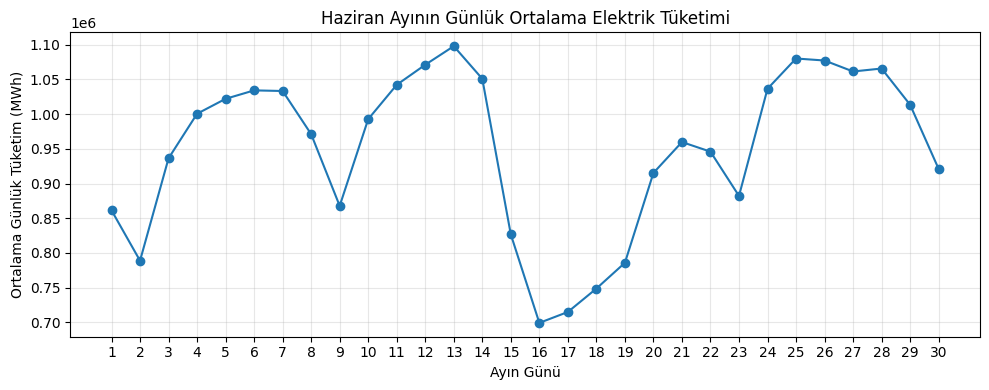


Temmuz ayı için:
  📈 En yüksek tüketim günü  : 23. gün (1203587.08 MWh)
  📉 En düşük tüketim günü   : 7. gün (941945.49 MWh)


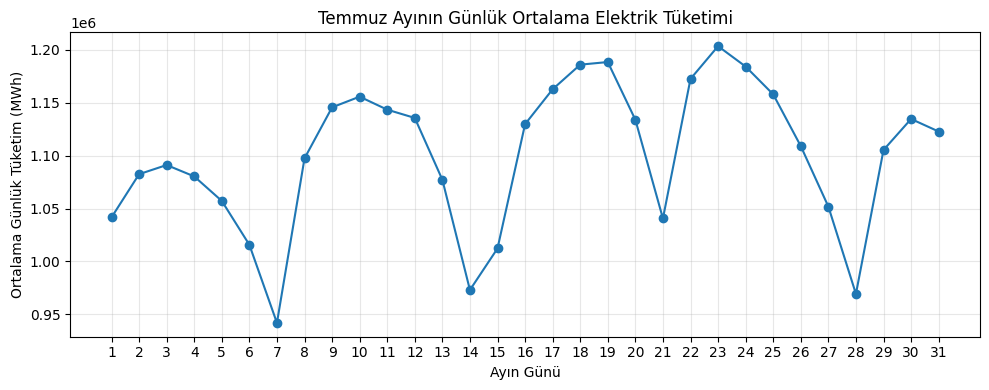


Ağustos ayı için:
  📈 En yüksek tüketim günü  : 15. gün (1168557.69 MWh)
  📉 En düşük tüketim günü   : 25. gün (947354.69 MWh)


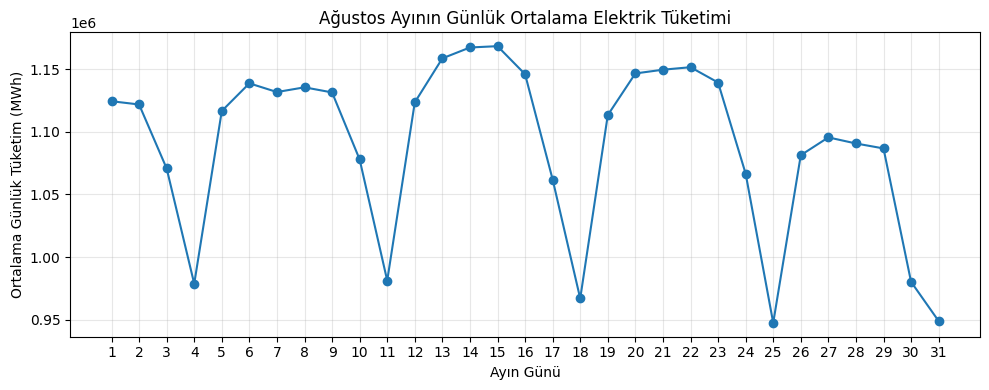


Eylül ayı için:
  📈 En yüksek tüketim günü  : 4. gün (1039710.37 MWh)
  📉 En düşük tüketim günü   : 22. gün (750094.40 MWh)


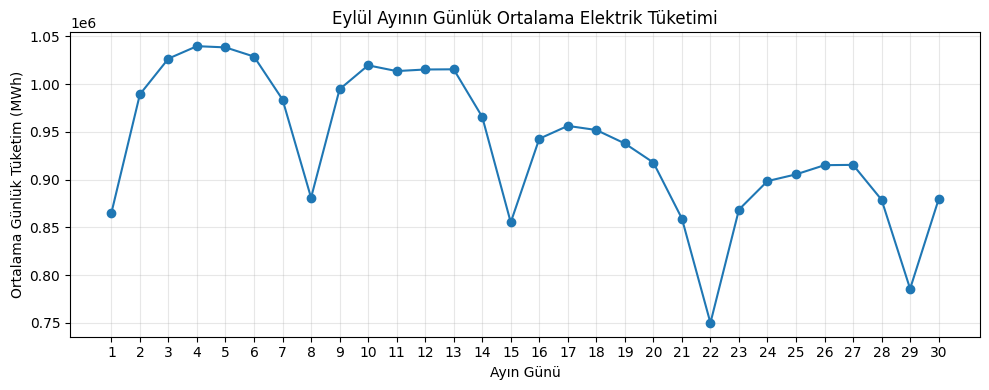


Ekim ayı için:
  📈 En yüksek tüketim günü  : 22. gün (915618.95 MWh)
  📉 En düşük tüketim günü   : 13. gün (757907.63 MWh)


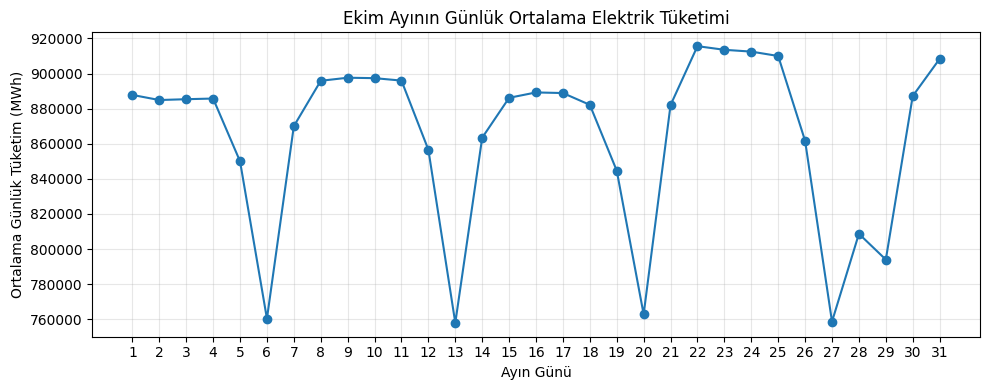


Kasım ayı için:
  📈 En yüksek tüketim günü  : 26. gün (1003822.93 MWh)
  📉 En düşük tüketim günü   : 3. gün (779387.79 MWh)


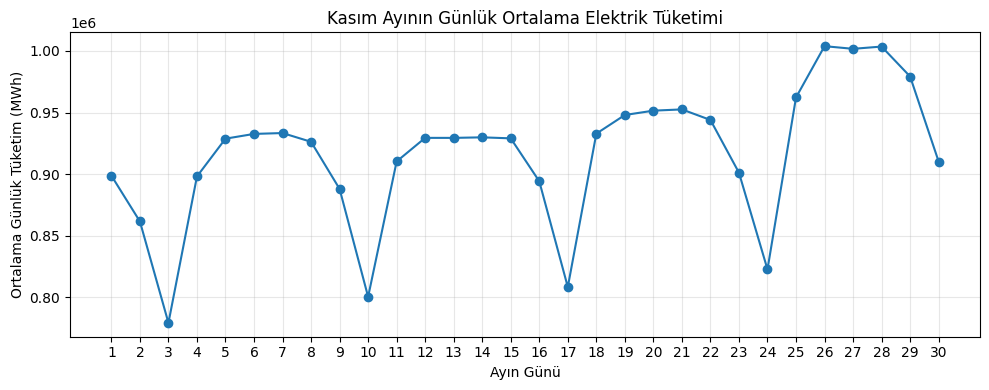


Aralık ayı için:
  📈 En yüksek tüketim günü  : 19. gün (1017644.20 MWh)
  📉 En düşük tüketim günü   : 8. gün (829651.50 MWh)


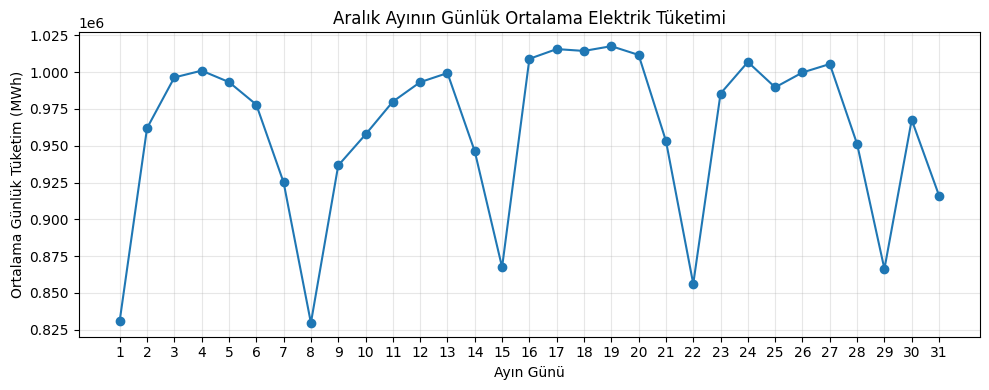

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

daily_month = daily.copy()
daily_month["Tarih"] = pd.to_datetime(daily_month["Tarih"])

daily_month["Ay"] = daily_month["Tarih"].dt.month
daily_month["Gun"] = daily_month["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

for ay in range(1, 13):

    df_ay = daily_month[daily_month["Ay"] == ay]

    if df_ay.empty:
        continue

    # Günlere göre ortalama günlük tüketim
    dom_mean = (
        df_ay.groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    # ====== EN YÜKSEK / EN DÜŞÜK GÜN ======
    max_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmax()]
    min_row = dom_mean.loc[dom_mean["Gunluk_Tuketim"].idxmin()]

    print(f"\n{ay_isimleri[ay]} ayı için:")
    print(f"  📈 En yüksek tüketim günü  : {int(max_row['Gun'])}. gün "
          f"({max_row['Gunluk_Tuketim']:.2f} MWh)")
    print(f"  📉 En düşük tüketim günü   : {int(min_row['Gun'])}. gün "
          f"({min_row['Gunluk_Tuketim']:.2f} MWh)")

    # ====== GRAFİK ======
    plt.figure(figsize=(10, 4))
    plt.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o")
    plt.title(f"{ay_isimleri[ay]} Ayının Günlük Ortalama Elektrik Tüketimi")
    plt.xlabel("Ayın Günü")
    plt.ylabel("Ortalama Günlük Tüketim (MWh)")
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, dom_mean["Gun"].max() + 1))
    plt.tight_layout()
    plt.show()




=== MODEL: 2024 SADECE TATİL/BAYRAM (EVENT) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.034
Method:                 Least Squares   F-statistic:                     14.00
Date:                Sat, 27 Dec 2025   Prob (F-statistic):           0.000213
Time:                        16:38:59   Log-Likelihood:                -4716.6
No. Observations:                 365   AIC:                             9437.
Df Residuals:                     363   BIC:                             9445.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
co

/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1966: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


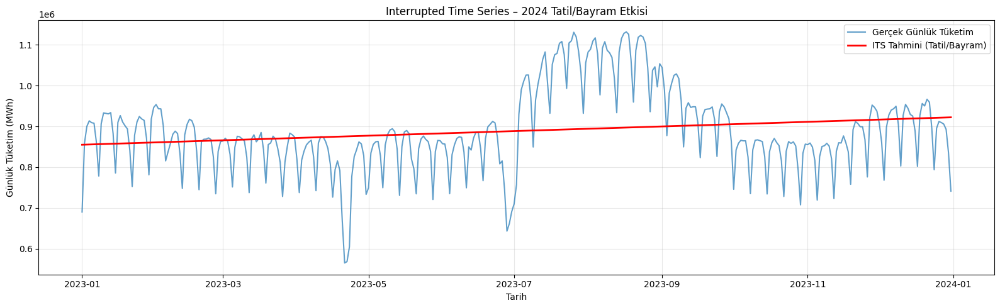

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# =========================
# 0) GÜNLÜK VERİYİ HAZIRLA
# =========================
df = daily.copy()
df["Tarih"] = pd.to_datetime(df["Tarih"])
df = df.sort_values("Tarih").reset_index(drop=True)

# Sadece 2024'ü analiz etmek istersen aç:
# df = df[df["Tarih"].dt.year == 2024].copy().reset_index(drop=True)

# Zaman indexi (t)
df["t"] = np.arange(len(df))

# =========================
# 1) 2024 RESMÎ TATİLLER (verdiğin listeye göre)
# =========================
holiday_info_2024 = [
    ("2024-01-01", 1),    # Yılbaşı

    # Ramazan Bayramı
    ("2024-04-09", 0.5),  # Arife (yarım gün)
    ("2024-04-10", 1),
    ("2024-04-11", 1),
    ("2024-04-12", 1),

    ("2024-04-23", 1),    # 23 Nisan
    ("2024-05-01", 1),    # 1 Mayıs
    ("2024-05-19", 1),    # 19 Mayıs

    # Kurban Bayramı
    ("2024-06-15", 0.5),  # Arife (yarım gün)
    ("2024-06-16", 1),
    ("2024-06-17", 1),
    ("2024-06-18", 1),
    ("2024-06-19", 1),

    ("2024-07-15", 1),    # Demokrasi Bayramı
    ("2024-08-30", 1),    # Zafer Bayramı
    ("2024-10-29", 1),    # Cumhuriyet Bayramı
]

holiday_df = pd.DataFrame(holiday_info_2024, columns=["Tarih", "holiday_weight"])
holiday_df["Tarih"] = pd.to_datetime(holiday_df["Tarih"])
holiday_dates = holiday_df["Tarih"].copy()

# =========================
# 2) EVENT DUMMY'LERİNİ OLUŞTUR
# =========================
df = df.merge(holiday_df, on="Tarih", how="left")
df["holiday_weight"] = df["holiday_weight"].fillna(0)

df["is_holiday"] = (df["holiday_weight"] > 0).astype(int)
df["is_event"]   = df["is_holiday"]

df["t_event"]   = df["t"] * df["is_event"]
df["t_holiday"] = df["t"] * df["is_holiday"]

y = df["Gunluk_Tuketim"]

# =========================
# 3) MODEL 1 – TEK "EVENT" (SADECE TATİL/BAYRAM)
# =========================
X1 = df[["t", "is_event", "t_event"]]
X1 = sm.add_constant(X1)

model1 = sm.OLS(y, X1).fit()

print("\n\n=== MODEL: 2024 SADECE TATİL/BAYRAM (EVENT) ===")
print(model1.summary())

# =========================
# 4) TAHMİN VE GRAFİK
# =========================
df["pred_event"] = model1.predict(X1)

plt.figure(figsize=(16,5))
plt.plot(df["Tarih"], df["Gunluk_Tuketim"], label="Gerçek Günlük Tüketim", alpha=0.7)
plt.plot(df["Tarih"], df["pred_event"], label="ITS Tahmini (Tatil/Bayram)", color="red", linewidth=2)

for d in holiday_dates:
    if df["Tarih"].min() <= d <= df["Tarih"].max():
        plt.axvline(d, color="green", linestyle="--", alpha=0.4)

plt.title("Interrupted Time Series – 2024 Tatil/Bayram Etkisi")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


/tmp/ipykernel_47/924049934.py:15: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")


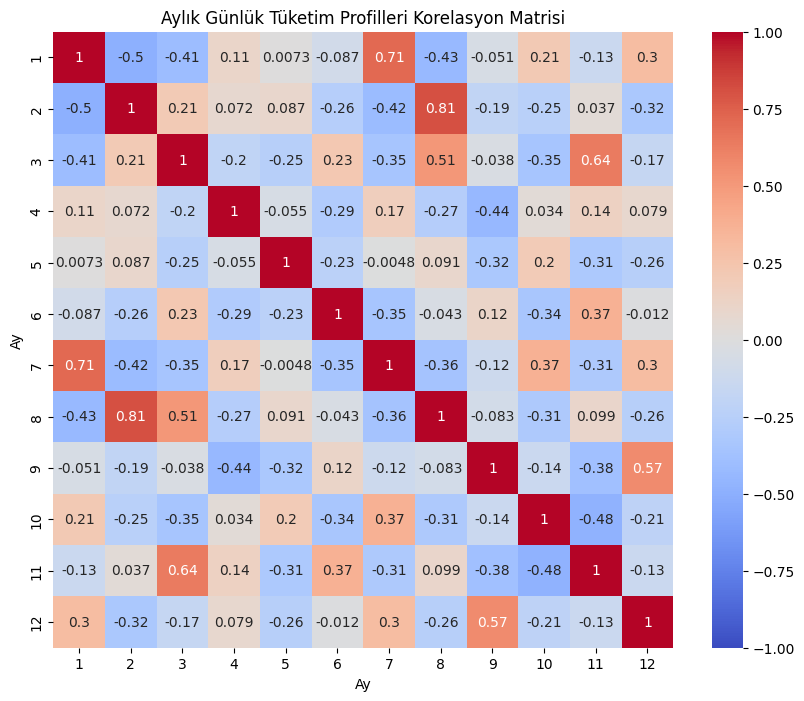

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Aylık günlük ortalamaları geniş formata alalım
pivot = daily_month.pivot_table(
    index="Gun",
    columns="Ay",
    values="Gunluk_Tuketim",
    aggfunc="mean"
)

# Şubat 29 vs eksik günleri dolduralım (interpolate)
pivot = pivot.interpolate().fillna(method="bfill").fillna(method="ffill")

# Korelasyon matrisi
corr = pivot.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Aylık Günlük Tüketim Profilleri Korelasyon Matrisi")
plt.show()




/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less
  return op(a, b)


🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:
2024-01-14  →  836987.47 MWh
2024-01-28  →  834947.43 MWh
2024-02-04  →  829409.41 MWh
2024-02-11  →  771540.58 MWh
2024-02-18  →  809141.64 MWh
2024-02-25  →  768411.83 MWh
2024-03-03  →  785573.22 MWh
2024-03-10  →  803376.10 MWh
2024-03-17  →  784736.02 MWh
2024-03-24  →  790940.62 MWh
2024-03-31  →  714451.38 MWh
2024-04-10  →  571902.23 MWh
2024-04-11  →  570802.05 MWh
2024-04-12  →  594002.03 MWh
2024-05-05  →  759758.02 MWh
2024-05-12  →  771340.72 MWh
2024-05-19  →  768731.87 MWh
2024-05-26  →  759431.98 MWh
2024-06-30  →  921027.29 MWh
2024-07-21  →  1040673.56 MWh
2024-08-04  →  978652.08 MWh
2024-08-11  →  981155.57 MWh
2024-08-25  →  947354.69 MWh
2024-09-08  →  881105.08 MWh
2024-09-22  →  750094.40 MWh
2024-09-29  →  785806.42 MWh
2024-10-06  →  760313.82 MWh
2024-10-13  →  757907.63 MWh
2024-10-20  →  762770.54 MWh
2024-11-03  →  779387.79 MWh
2024-11-10  →  800534.06 MWh
2024-11-17  →  808488.67 MWh
2024-12-08  →  829651.50

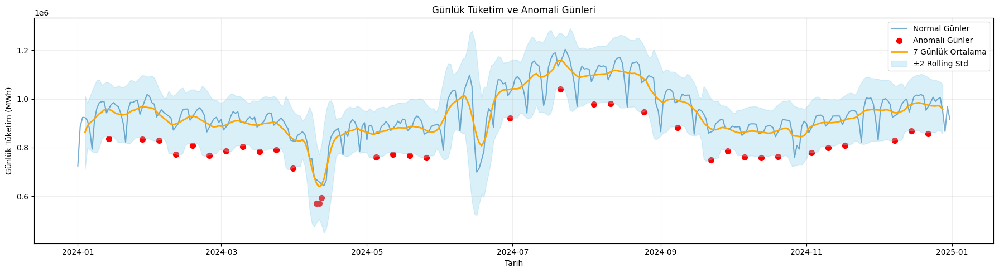

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==== 1) DAILY DATAFRAME'İN VAR OLDUĞUNU KABUL EDİYORUZ ====
# Eğer yoksa, önce df -> daily kısmını ÇALIŞTIRMAN lazım.
# daily: [Tarih, Gunluk_Tuketim]

daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# ==== 2) ANOMALİ DATAFRAME'İ (ana) OLUŞTUR ====
ana = daily.copy()

# --- Global z-score ---
mu = ana["Gunluk_Tuketim"].mean()
sigma = ana["Gunluk_Tuketim"].std()

ana["zscore"] = (ana["Gunluk_Tuketim"] - mu) / sigma
ana["is_z_anom"] = ana["zscore"].abs() > 3   # eşik: |z| > 3

# --- Rolling mean/std ---
window = 7
ana["roll_mean"] = ana["Gunluk_Tuketim"].rolling(window=window, center=True).mean()
ana["roll_std"]  = ana["Gunluk_Tuketim"].rolling(window=window, center=True).std()

upper = ana["roll_mean"] + 2 * ana["roll_std"]
lower = ana["roll_mean"] - 2 * ana["roll_std"]

ana["is_roll_anom"] = (ana["Gunluk_Tuketim"] > upper) | (ana["Gunluk_Tuketim"] < lower)

# --- Kombine etiket ---
ana["is_anom"] = ana["is_z_anom"] | ana["is_roll_anom"]

# ==== 3) SENİN KODUN: ANOMALİLERİ YAZDIR + GRAFİĞİ ÇİZ ====
df = ana.copy()   # senin koduna dokunmadan kullanabilelim

# Sadece anomalileri seç
anom_points = df[df["is_anom"]][["Tarih", "Gunluk_Tuketim"]]

# ---- TARİHLERİ YAZDIR ----
print("🔴 Anomali Günlerinin Tarih ve Tüketim Listesi:")
for idx, row in anom_points.iterrows():
    print(f"{row['Tarih'].date()}  →  {row['Gunluk_Tuketim']:.2f} MWh")

# ---- GRAFİK ----
plt.figure(figsize=(18,5))

# Normal günler
plt.plot(df.loc[~df["is_anom"], "Tarih"],
         df.loc[~df["is_anom"], "Gunluk_Tuketim"],
         color="#1f77b4", alpha=0.6, label="Normal Günler")

# Anomali günler (kırmızı noktalar)
plt.scatter(df.loc[df["is_anom"], "Tarih"],
            df.loc[df["is_anom"], "Gunluk_Tuketim"],
            color="red", s=50, label="Anomali Günler")

# Rolling ortalama
plt.plot(df["Tarih"], df["roll_mean"], color="orange", linewidth=2, label=f"{window} Günlük Ortalama")

# Rolling band (±2 std)
plt.fill_between(df["Tarih"],
                 df["roll_mean"] - 2*df["roll_std"],
                 df["roll_mean"] + 2*df["roll_std"],
                 color="skyblue", alpha=0.3, label="±2 Rolling Std")

plt.title("Günlük Tüketim ve Anomali Günleri")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.2)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# daily = senin günlük dataframe'in
gunluk = daily.copy()
gunluk["Tarih"] = pd.to_datetime(gunluk["Tarih"])

# Ay ve gün bilgileri
gunluk["AyNo"] = gunluk["Tarih"].dt.month
gunluk["GunEN"] = gunluk["Tarih"].dt.day_name()

gun_mapping = {
    "Monday": "Pazartesi",
    "Tuesday": "Salı",
    "Wednesday": "Çarşamba",
    "Thursday": "Perşembe",
    "Friday": "Cuma",
    "Saturday": "Cumartesi",
    "Sunday": "Pazar"
}

gun_sira = {
    "Pazartesi": 1,
    "Salı": 2,
    "Çarşamba": 3,
    "Perşembe": 4,
    "Cuma": 5,
    "Cumartesi": 6,
    "Pazar": 7
}

gunluk["Gün"] = gunluk["GunEN"].map(gun_mapping)
gunluk["GunSira"] = gunluk["Gün"].map(gun_sira)

ay_isimleri = {
    1:"Ocak",2:"Şubat",3:"Mart",4:"Nisan",5:"Mayıs",6:"Haziran",
    7:"Temmuz",8:"Ağustos",9:"Eylül",10:"Ekim",11:"Kasım",12:"Aralık"
}

# ---- Gün istatistikleri (12 ay tek tabloda) ----
gun_istatistik_tum = (
    gunluk
    .groupby(["AyNo","Gün"])["Gunluk_Tuketim"]
    .agg(["mean","min","max","std","count"])
    .reset_index()
)

gun_istatistik_tum["Ay"] = gun_istatistik_tum["AyNo"].map(ay_isimleri)
gun_istatistik_tum["GunSira"] = gun_istatistik_tum["Gün"].map(gun_sira)
gun_istatistik_tum = gun_istatistik_tum.sort_values(["AyNo","GunSira"])

gun_istatistik_tum = gun_istatistik_tum.rename(columns={
    "mean":"Ortalama (MWh)",
    "min":"Minimum (MWh)",
    "max":"Maksimum (MWh)",
    "std":"Std Sapma (MWh)",
    "count":"Gün Sayısı"
})

# ---- Her ay için tablo + en kararlı / en değişken ----
for ay_no in range(1,13):
    ay_adi = ay_isimleri[ay_no]
    alt = gun_istatistik_tum[gun_istatistik_tum["AyNo"] == ay_no].copy()
    if alt.empty:
        continue

    print(f"\n\n=== 2023 {ay_adi} - Günlere Göre Elektrik Tüketimi İstatistikleri ===\n")
    print(
        alt[["Gün","Ortalama (MWh)","Minimum (MWh)","Maksimum (MWh)",
             "Std Sapma (MWh)","Gün Sayısı"]]
        .round(2)
        .to_string(index=False)
    )

    en_stabil = alt.loc[alt["Std Sapma (MWh)"].idxmin()]
    en_degisen = alt.loc[alt["Std Sapma (MWh)"].idxmax()]

    print(f"\n-> En KARARLI gün: {en_stabil['Gün']}  (Std Sapma: {en_stabil['Std Sapma (MWh)']:.2f} MWh)")
    print(f"-> En DEĞİŞKEN gün: {en_degisen['Gün']}  (Std Sapma: {en_degisen['Std Sapma (MWh)']:.2f} MWh)")

# ---- Özet tablo ----
stabil_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmin(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Kararlı Gün"})

degisen_ozet = gun_istatistik_tum.loc[
    gun_istatistik_tum.groupby("AyNo")["Std Sapma (MWh)"].idxmax(),
    ["Ay","Gün","Std Sapma (MWh)"]
].rename(columns={"Gün":"En Değişken Gün","Std Sapma (MWh)":"Std Sapma (MWh) - Değişken"})

ozet = stabil_ozet.merge(degisen_ozet, on="Ay")

print("\n\n=== ÖZET: 2023 Her Ay İçin En Kararlı ve En Değişken Günler ===\n")
print(ozet.round(2).to_string(index=False))




=== 2023 Ocak - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std Sapma (MWh)  Gün Sayısı
Pazartesi       912434.17      724821.03       992437.79        108987.58           5
     Salı       967331.40      885724.29      1018137.95         49758.82           5
 Çarşamba       975605.59      924218.93      1010304.94         31679.77           5
 Perşembe       967556.92      922904.86       991223.72         31670.01           4
     Cuma       958914.86      912127.19       994712.74         39652.57           4
Cumartesi       912707.42      872200.41       942674.88         33083.27           4
    Pazar       822042.40      793777.21       836987.47         19908.02           4

-> En KARARLI gün: Pazar  (Std Sapma: 19908.02 MWh)
-> En DEĞİŞKEN gün: Pazartesi  (Std Sapma: 108987.58 MWh)


=== 2023 Şubat - Günlere Göre Elektrik Tüketimi İstatistikleri ===

      Gün  Ortalama (MWh)  Minimum (MWh)  Maksimum (MWh)  Std 

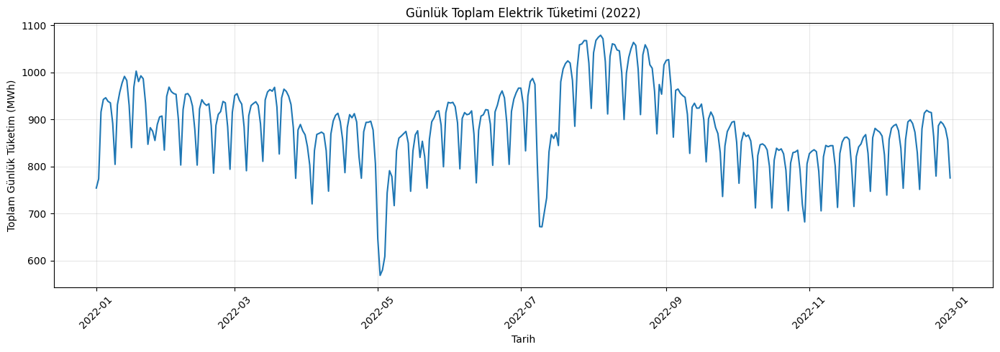

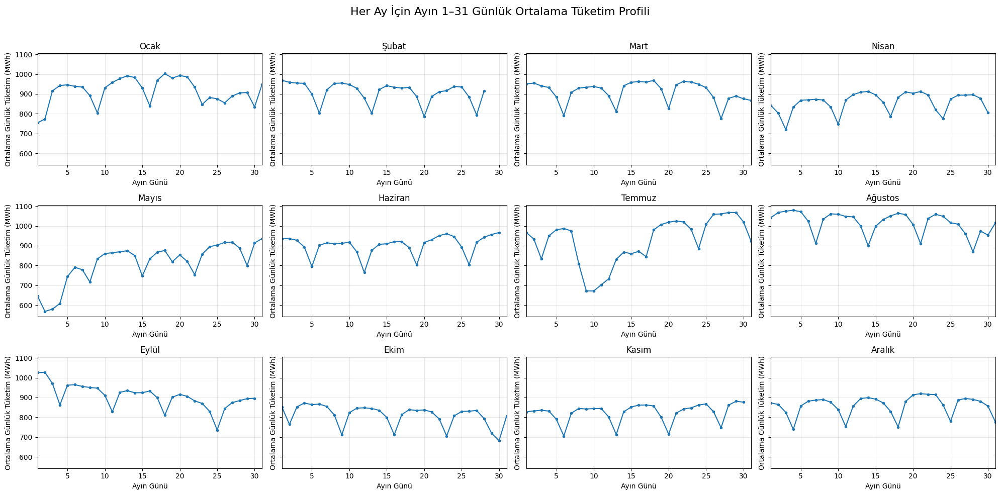

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ===================== 1) CSV'Yİ OKU VE TEMİZLE =====================
path = "/kaggle/input/tuketim2022/Gercek_Zamanli_Tuketim-01012022-31122022.csv"

df = pd.read_csv(
    path,
    sep=";",              # EPİAŞ CSV genelde ;
    engine="python",
    on_bad_lines="skip"   # bozuk satırları at
)

# Gereksiz kolonları sil
df = df.drop(columns=["Unnamed: 3"], errors="ignore")

# İsimleri sadeleştir
df = df.rename(columns={
    "Tarih": "Tarih",
    "Saat": "Saat",
    "Tüketim Miktarı(MWh)": "Tuketim"
})

# Boş tarih/saat satırlarını at
df = df.dropna(subset=["Tarih", "Saat"])

# Tarih + saat stringi oluştur
df["datetime_str"] = df["Tarih"].astype(str).str.strip() + " " + df["Saat"].astype(str).str.strip()

# Datetime'a çevir
df["datetime"] = pd.to_datetime(
    df["datetime_str"],
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# Datetime oluşmayanları at
df = df.dropna(subset=["datetime"])

# Tüketimi numeriğe çevir
df["Tuketim"] = (
    df["Tuketim"]
    .astype(str)
    .str.replace(".", "", regex=False)   # binlik ayraç
    .str.replace(",", ".", regex=False)  # ondalık virgül -> nokta
)
df["Tuketim"] = pd.to_numeric(df["Tuketim"], errors="coerce")

# ===================== 2) GÜNLÜK TOPLAMA (daily) =====================
daily = (
    df
    .groupby(df["datetime"].dt.date)["Tuketim"]
    .sum()
    .reset_index()
)

daily.columns = ["Tarih", "Gunluk_Tuketim"]
daily["Tarih"] = pd.to_datetime(daily["Tarih"])

# İstersen günlük grafiği de bir kontrol edelim:
plt.figure(figsize=(14,5))
plt.plot(daily["Tarih"], daily["Gunluk_Tuketim"])
plt.title("Günlük Toplam Elektrik Tüketimi (2022)")
plt.xlabel("Tarih")
plt.ylabel("Toplam Günlük Tüketim (MWh)")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ===================== 3) HER AY İÇİN 1–31 GÜNLÜK ORTALAMA GRAFİKLER =====================

dm = daily.copy()
dm["Ay"] = dm["Tarih"].dt.month
dm["Gun"] = dm["Tarih"].dt.day

ay_isimleri = {
    1: "Ocak", 2: "Şubat", 3: "Mart", 4: "Nisan",
    5: "Mayıs", 6: "Haziran", 7: "Temmuz", 8: "Ağustos",
    9: "Eylül", 10: "Ekim", 11: "Kasım", 12: "Aralık"
}

fig, axes = plt.subplots(3, 4, figsize=(20, 10), sharey=True)
fig.suptitle("Her Ay İçin Ayın 1–31 Günlük Ortalama Tüketim Profili", fontsize=16)

for ay in range(1, 13):
    ax = axes[(ay-1)//4, (ay-1)%4]
    df_ay = dm[dm["Ay"] == ay]

    if df_ay.empty:
        ax.set_visible(False)
        continue

    dom_mean = (
        df_ay
        .groupby("Gun")["Gunluk_Tuketim"]
        .mean()
        .reset_index()
    )

    ax.plot(dom_mean["Gun"], dom_mean["Gunluk_Tuketim"], marker="o", markersize=3)
    ax.set_title(ay_isimleri[ay])
    ax.set_xlabel("Ayın Günü")
    ax.set_ylabel("Ortalama Günlük Tüketim (MWh)")
    ax.set_xlim(1, 31)
    ax.grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


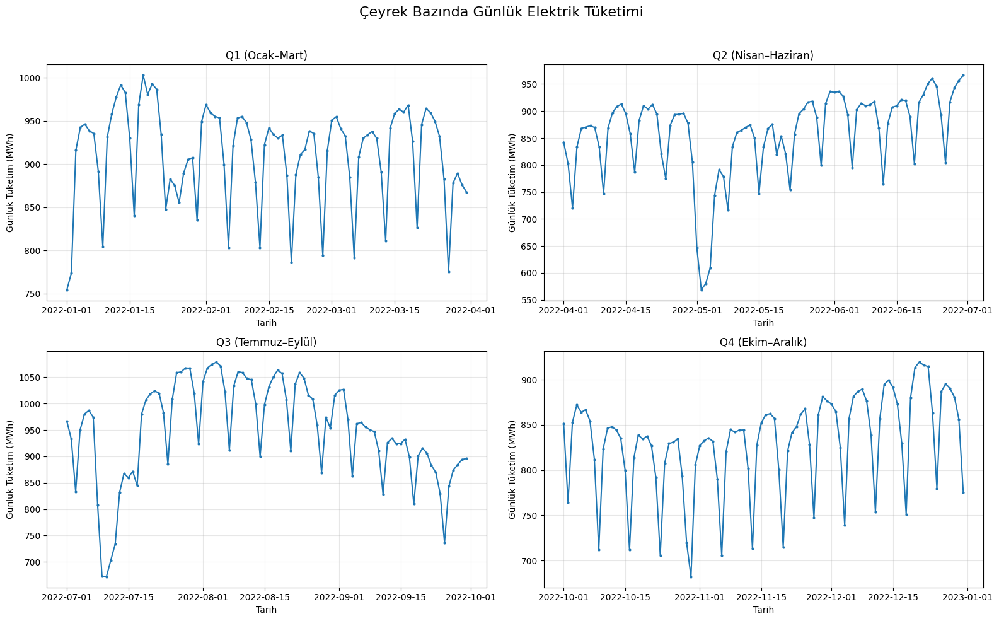


🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):
Q1 (Ocak–Mart) → 82021.94 MWh
Q2 (Nisan–Haziran) → 78006.25 MWh
Q3 (Temmuz–Eylül) → 87274.19 MWh
Q4 (Ekim–Aralık) → 76507.01 MWh

🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:
Q1 (Ocak–Mart) → Q2 (Nisan–Haziran) : %-4.90 büyüme
Q2 (Nisan–Haziran) → Q3 (Temmuz–Eylül) : %11.88 büyüme
Q3 (Temmuz–Eylül) → Q4 (Ekim–Aralık) : %-12.34 büyüme


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Günlük veri
df_q = daily.copy()
df_q["Tarih"] = pd.to_datetime(df_q["Tarih"])
df_q["Yil"] = df_q["Tarih"].dt.year
df_q["Ay"]  = df_q["Tarih"].dt.month

# Çeyrek belirleyelim
df_q["Ceyrek"] = ((df_q["Ay"] - 1) // 3) + 1   # 1→Q1, 2→Q2, 3→Q3, 4→Q4

# Çeyrek isimleri
q_labels = {1: "Q1 (Ocak–Mart)", 2: "Q2 (Nisan–Haziran)",
            3: "Q3 (Temmuz–Eylül)", 4: "Q4 (Ekim–Aralık)"}

# =======================================================
# 1) HER ÇEYREK İÇİN GRAFİKLERİ ÇİZ
# =======================================================

plt.figure(figsize=(16,10))

for q in range(1, 5):
    df_sub = df_q[df_q["Ceyrek"] == q]

    ax = plt.subplot(2, 2, q)
    ax.plot(df_sub["Tarih"], df_sub["Gunluk_Tuketim"], marker="o", markersize=2)
    ax.set_title(q_labels[q])
    ax.set_xlabel("Tarih")
    ax.set_ylabel("Günlük Tüketim (MWh)")
    ax.grid(True, alpha=0.3)

plt.suptitle("Çeyrek Bazında Günlük Elektrik Tüketimi", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# =======================================================
# 2) HER ÇEYREĞİN TOPLAM TÜKETİMİ
# =======================================================

quarter_total = df_q.groupby("Ceyrek")["Gunluk_Tuketim"].sum()
print("\n🔹 ÇEYREK TOPLAM TÜKETİMLERİ (MWh):")
for q in range(1,5):
    print(f"{q_labels[q]} → {quarter_total[q]:.2f} MWh")

# =======================================================
# 3) ÇEYREKLER ARASI BÜYÜME ORANI (%)
# =======================================================

print("\n🔹 ÇEYREKLER ARASI BÜYÜME ORANLARI:")

for q in range(2, 5):
    prev = quarter_total[q-1]
    curr = quarter_total[q]
    growth = ((curr - prev) / prev) * 100

    print(f"{q_labels[q-1]} → {q_labels[q]} : %{growth:.2f} büyüme")




=== YILLIK TOPLAMLAR (DÜZELTİLMİŞ, MWh) ===
    Yil  Yillik_Toplam_MWh
0  2022       3.238094e+08
1  2023       3.243229e+08
2  2024       3.426873e+08


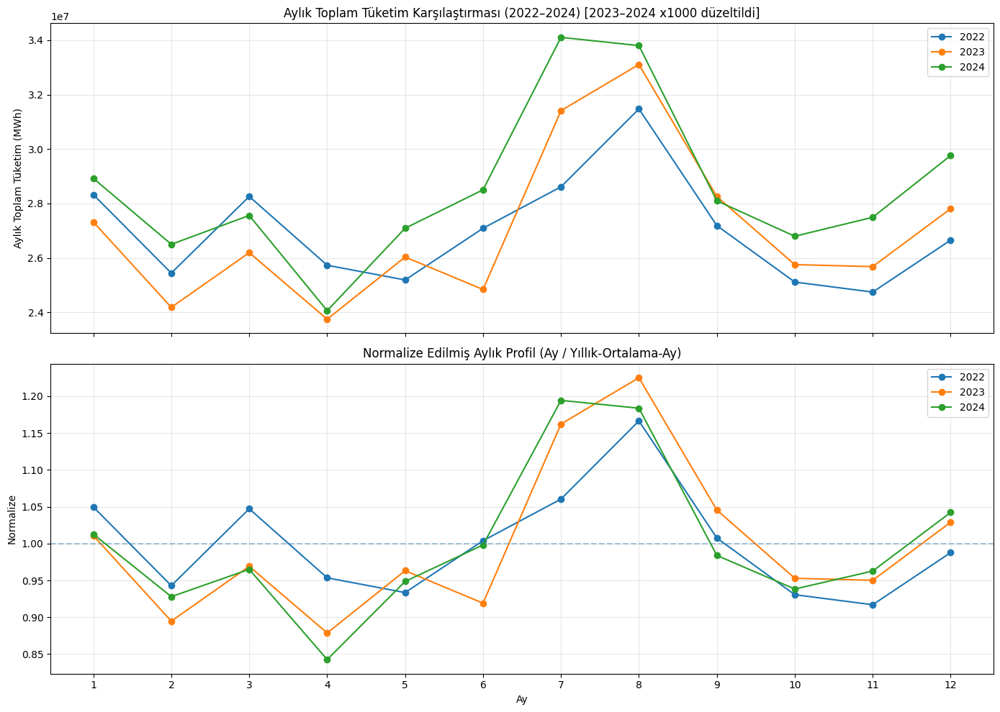

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================
# AYLIK TOPLAM (DÜZELTİLMİŞ) + NORMALIZE AYLIK PROFİL
# Tek figürde 2 grafik: (1) Aylık Toplam (2) Normalize
# =========================

# 2023-2024 ölçek düzeltmesi (senin verinde gerekli)
scale_2023_2024 = 1000

monthly_fixed = monthly.copy()
monthly_fixed.loc[monthly_fixed["Yil"].isin([2023, 2024]), "Tuketim"] *= scale_2023_2024

# Yıllık toplamlar (düzeltilmiş)
yearly_totals_fixed = (
    monthly_fixed.groupby("Yil", as_index=False)["Tuketim"]
    .sum()
    .rename(columns={"Tuketim": "Yillik_Toplam_MWh"})
)

# Normalize için: Ay / (YıllıkToplam/12)
monthly_norm_fixed = monthly_fixed.merge(yearly_totals_fixed, on="Yil", how="left")
monthly_norm_fixed["norm"] = monthly_norm_fixed["Tuketim"] / (monthly_norm_fixed["Yillik_Toplam_MWh"] / 12.0)

print("\n=== YILLIK TOPLAMLAR (DÜZELTİLMİŞ, MWh) ===")
print(yearly_totals_fixed)

# =========================
# TEK FIGÜRDE 2 GRAFİK
# =========================
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# --- (1) Aylık Toplam ---
ax = axes[0]
for yil in [2022, 2023, 2024]:
    tmp = monthly_fixed[monthly_fixed["Yil"] == yil].sort_values("Ay")
    ax.plot(tmp["Ay"], tmp["Tuketim"], marker="o", label=str(yil))

ax.set_title("Aylık Toplam Tüketim Karşılaştırması (2022–2024) [2023–2024 x1000 düzeltildi]")
ax.set_ylabel("Aylık Toplam Tüketim (MWh)")
ax.grid(True, alpha=0.3)
ax.legend()

# --- (2) Normalize Profil ---
ax2 = axes[1]
for yil in [2022, 2023, 2024]:
    tmp = monthly_norm_fixed[monthly_norm_fixed["Yil"] == yil].sort_values("Ay")
    ax2.plot(tmp["Ay"], tmp["norm"], marker="o", label=str(yil))

ax2.axhline(1, linestyle="--", alpha=0.4)
ax2.set_title("Normalize Edilmiş Aylık Profil (Ay / Yıllık-Ortalama-Ay)")
ax2.set_xlabel("Ay")
ax2.set_ylabel("Normalize")
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.xticks(range(1, 13))
plt.tight_layout()
plt.show()


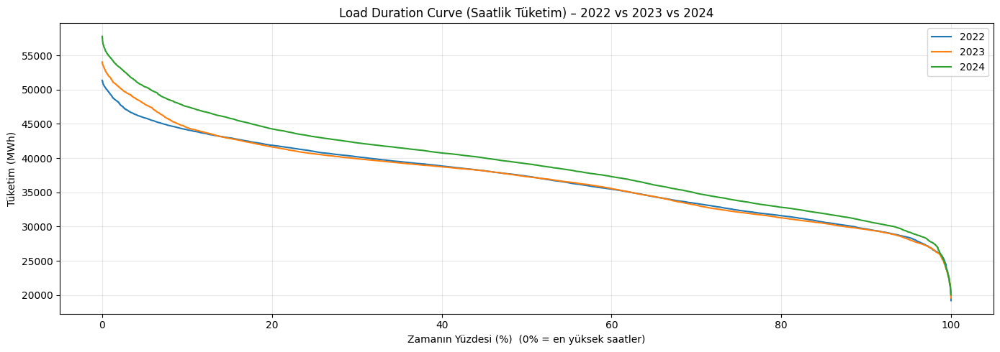


=== LDC ÖZET METRİKLERİ (Saatlik) ===
          Peak      Mean    Median  Base(P10)  P90(Top10% threshold)  \
2022  51353.67  36964.54  37363.07   29664.33               44148.66   
2023  54044.88  37023.17  37301.01   29586.69               44460.45   
2024  57772.40  39012.67  39169.78   30808.10               47504.79   

      P10(Low10% threshold)  Peak/Mean  Peak/Base  N_hours  
2022               29664.33       1.39       1.73     8760  
2023               29586.69       1.46       1.83     8760  
2024               30808.10       1.48       1.88     8784  


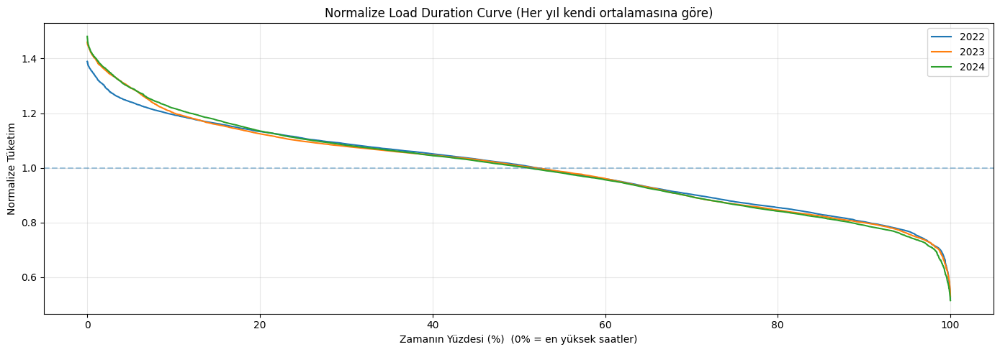

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# LOAD DURATION CURVE (2022-2024) - Saatlik tüketimden
# d2022, d2023, d2024 DataFrame'lerinin elinde olduğunu varsayar.
# Kolon adı: "Tuketim" (MWh)
# =========================================================

# 2023-2024 ölçek düzeltmesi (senin verinde 1000x gerekiyordu)
scale_2023_2024 = 1000

d2022_ldc = d2022.copy()
d2023_ldc = d2023.copy()
d2024_ldc = d2024.copy()

d2023_ldc["Tuketim"] *= scale_2023_2024
d2024_ldc["Tuketim"] *= scale_2023_2024

def make_ldc(series):
    s = pd.to_numeric(series, errors="coerce").dropna().values
    s_sorted = np.sort(s)[::-1]  # büyükten küçüğe
    n = len(s_sorted)
    # x ekseni: zaman yüzdesi (0-100)
    x = np.linspace(0, 100, n)
    return x, s_sorted

x22, y22 = make_ldc(d2022_ldc["Tuketim"])
x23, y23 = make_ldc(d2023_ldc["Tuketim"])
x24, y24 = make_ldc(d2024_ldc["Tuketim"])

# =========================================================
# 1) LDC GRAFİĞİ (3 yıl üst üste)
# =========================================================
plt.figure(figsize=(14,5))
plt.plot(x22, y22, label="2022")
plt.plot(x23, y23, label="2023")
plt.plot(x24, y24, label="2024")
plt.title("Load Duration Curve (Saatlik Tüketim) – 2022 vs 2023 vs 2024")
plt.xlabel("Zamanın Yüzdesi (%)  (0% = en yüksek saatler)")
plt.ylabel("Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =========================================================
# 2) ÖZET METRİKLER (rapor için çok iyi)
# =========================================================
def ldc_metrics(arr):
    arr = pd.to_numeric(pd.Series(arr), errors="coerce").dropna().values
    arr_sorted = np.sort(arr)[::-1]
    n = len(arr_sorted)

    # Percentile tabanlı noktalar:
    # %10 en yüksek saatlerin eşiği (P90)
    p10_high = np.percentile(arr, 90)
    # %50 (medyan)
    p50 = np.percentile(arr, 50)
    # %90 düşük taraf (P10)
    p90_low = np.percentile(arr, 10)

    peak = arr_sorted[0]
    mean = arr.mean()
    base = np.percentile(arr, 10)  # taban yük proxy (alt %10)

    return {
        "Peak": peak,
        "Mean": mean,
        "Median": p50,
        "Base(P10)": base,
        "P90(Top10% threshold)": p10_high,
        "P10(Low10% threshold)": p90_low,
        "Peak/Mean": peak / mean if mean != 0 else np.nan,
        "Peak/Base": peak / base if base != 0 else np.nan,
        "N_hours": n
    }

metrics_2022 = ldc_metrics(d2022_ldc["Tuketim"])
metrics_2023 = ldc_metrics(d2023_ldc["Tuketim"])
metrics_2024 = ldc_metrics(d2024_ldc["Tuketim"])

metrics_df = pd.DataFrame([metrics_2022, metrics_2023, metrics_2024], index=["2022","2023","2024"])
print("\n=== LDC ÖZET METRİKLERİ (Saatlik) ===")
print(metrics_df.round(2))

# =========================================================
# 3) İSTEĞE BAĞLI: Normalize LDC (her yıl kendi ortalamasına böl)
#    Şekil karşılaştırması için çok iyi
# =========================================================
def make_ldc_normalized(series):
    s = pd.to_numeric(series, errors="coerce").dropna().values
    s = s / s.mean()
    s_sorted = np.sort(s)[::-1]
    x = np.linspace(0, 100, len(s_sorted))
    return x, s_sorted

xn22, yn22 = make_ldc_normalized(d2022_ldc["Tuketim"])
xn23, yn23 = make_ldc_normalized(d2023_ldc["Tuketim"])
xn24, yn24 = make_ldc_normalized(d2024_ldc["Tuketim"])

plt.figure(figsize=(14,5))
plt.plot(xn22, yn22, label="2022")
plt.plot(xn23, yn23, label="2023")
plt.plot(xn24, yn24, label="2024")
plt.axhline(1, linestyle="--", alpha=0.4)
plt.title("Normalize Load Duration Curve (Her yıl kendi ortalamasına göre)")
plt.xlabel("Zamanın Yüzdesi (%)  (0% = en yüksek saatler)")
plt.ylabel("Normalize Tüketim")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


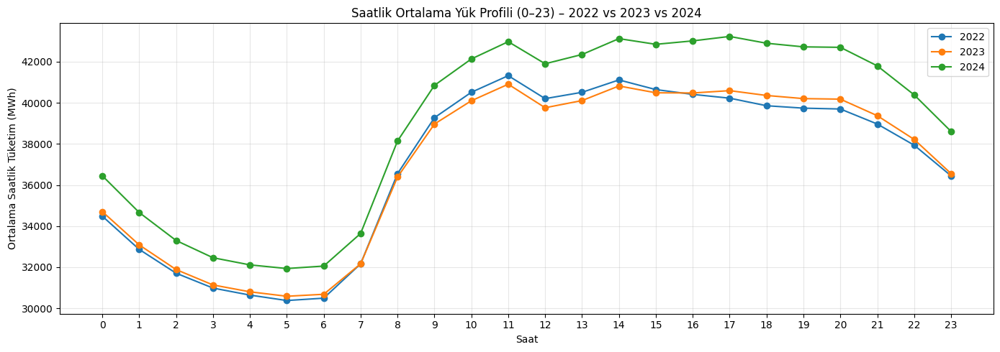

In [ ]:
import matplotlib.pyplot as plt

# =========================
# SAATLİK PROFİL (0–23)
# =========================

# 2023–2024 için ölçek düzeltmesi gerekiyordu
scale_2023_2024 = 1000

d2022_h = d2022.copy()
d2023_h = d2023.copy()
d2024_h = d2024.copy()

d2023_h["Tuketim"] *= scale_2023_2024
d2024_h["Tuketim"] *= scale_2023_2024

# Saat bilgisini çıkar
for d in [d2022_h, d2023_h, d2024_h]:
    d["Saat"] = d["datetime"].dt.hour

# Saatlik ortalamalar
h2022 = d2022_h.groupby("Saat")["Tuketim"].mean().reset_index()
h2023 = d2023_h.groupby("Saat")["Tuketim"].mean().reset_index()
h2024 = d2024_h.groupby("Saat")["Tuketim"].mean().reset_index()

# =========================
# GRAFİK
# =========================
plt.figure(figsize=(14,5))
plt.plot(h2022["Saat"], h2022["Tuketim"], marker="o", label="2022")
plt.plot(h2023["Saat"], h2023["Tuketim"], marker="o", label="2023")
plt.plot(h2024["Saat"], h2024["Tuketim"], marker="o", label="2024")

plt.xticks(range(0,24))
plt.xlabel("Saat")
plt.ylabel("Ortalama Saatlik Tüketim (MWh)")
plt.title("Saatlik Ortalama Yük Profili (0–23) – 2022 vs 2023 vs 2024")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


Tahmin edilen ayırıcı (sep): ';'
Kolonlar: ['Tarih', 'Saat', 'Tüketim Miktarı(MWh)']
        Tarih   Saat Tüketim Miktarı(MWh)
0  01.01.2023  00:00            28.836,10
1  01.01.2023  01:00            27.608,62
2  01.01.2023  02:00            26.347,75
3  01.01.2023  03:00            25.243,18
4  01.01.2023  04:00            24.654,99

Örnek Tarih: ['01.01.2023', '01.01.2023', '01.01.2023', '01.01.2023', '01.01.2023']
Örnek Saat : ['00:00', '01:00', '02:00', '03:00', '04:00']
Örnek Tük. : ['28.836,10', '27.608,62', '26.347,75', '25.243,18', '24.654,99']

Date parse başarı oranı: 1.0
Saat parse başarı oranı: 1.0

Datetime aralığı: 2023-01-01 00:00:00 -> 2023-12-31 23:00:00
Yıl dağılımı: {2023: 8760}
2023 saat sayısı: 8760
Gün sayısı: 365 | Aralık: 2023-01-01 00:00:00 -> 2023-12-31 00:00:00

=== ITS MODEL – 6 ŞUBAT 2023 DEPREMİ ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.049


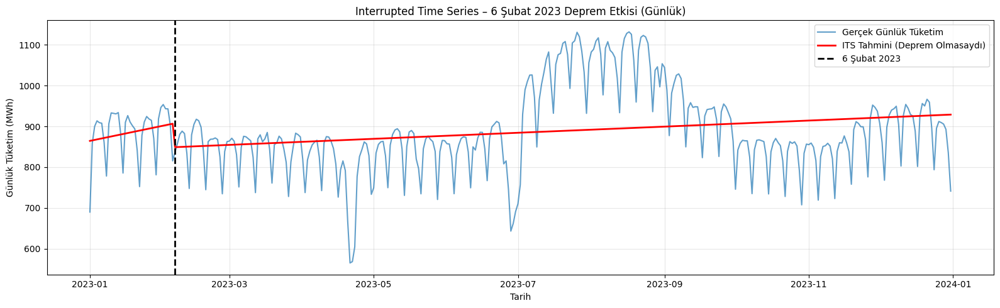

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import re

path_2023 = "/kaggle/input/tuketim2023/Gercek_Zamanli_Tuketim-01012023-31122023.csv"

# =========================
# 0) DELIMITER'I OTOMATİK BUL
# =========================
with open(path_2023, "r", encoding="utf-8", errors="ignore") as f:
    sample = "".join([next(f) for _ in range(10)])

candidates = [";", "\t", ","]
sep = max(candidates, key=lambda s: sample.count(s))
print("Tahmin edilen ayırıcı (sep):", repr(sep))

# =========================
# 1) DOSYAYI DOĞRU SEP İLE OKU
# =========================
raw = pd.read_csv(path_2023, sep=sep, engine="python", encoding="utf-8", on_bad_lines="skip")
raw.columns = [str(c).strip() for c in raw.columns]

# Unnamed kolonları at
raw = raw.loc[:, [c for c in raw.columns if not c.lower().startswith("unnamed")]]

print("Kolonlar:", list(raw.columns))
print(raw.head())

# =========================
# 2) GEREKLİ KOLONLARI BUL
# =========================
def pick_col(cols, keywords):
    cols_l = {c: c.lower() for c in cols}
    for c in cols:
        for k in keywords:
            if k in cols_l[c]:
                return c
    return None

col_tarih = pick_col(raw.columns, ["tarih"])
col_saat  = pick_col(raw.columns, ["saat"])
col_tuk   = pick_col(raw.columns, ["tüketim", "tuketim"])

if col_tarih is None or col_saat is None or col_tuk is None:
    raise ValueError(f"Kolonlar bulunamadı. Tarih={col_tarih}, Saat={col_saat}, Tuketim={col_tuk}. Kolonlar={list(raw.columns)}")

dfh = raw[[col_tarih, col_saat, col_tuk]].copy()
dfh.columns = ["Tarih", "Saat", "Tuketim_raw"]

print("\nÖrnek Tarih:", dfh["Tarih"].astype(str).head(5).tolist())
print("Örnek Saat :", dfh["Saat"].astype(str).head(5).tolist())
print("Örnek Tük. :", dfh["Tuketim_raw"].astype(str).head(5).tolist())

# =========================
# 3) TARİH PARSE (TR format)
# =========================
tarih_str = dfh["Tarih"].astype(str).str.strip()

# önce TR format dene: 01.01.2023
dates = pd.to_datetime(tarih_str, format="%d.%m.%Y", errors="coerce")

# olmazsa ISO dene: 2023-01-01
mask = dates.isna()
if mask.any():
    dates2 = pd.to_datetime(tarih_str[mask], format="%Y-%m-%d", errors="coerce")
    dates.loc[mask] = dates2

# son çare: infer
mask = dates.isna()
if mask.any():
    dates3 = pd.to_datetime(tarih_str[mask], dayfirst=True, errors="coerce")
    dates.loc[mask] = dates3

dfh["date"] = dates
print("\nDate parse başarı oranı:", dfh["date"].notna().mean())

# =========================
# 4) SAAT PARSE (00:00 / 0 / 0:00 / 00:00:00)
# =========================
def parse_hour_to_minutes(x):
    if pd.isna(x):
        return np.nan
    s = str(x).strip()

    # sadece sayı (0-23)
    if re.fullmatch(r"\d{1,2}", s):
        h = int(s)
        return h * 60 if 0 <= h <= 23 else np.nan

    # 0:00 / 00:00 / 00:00:00
    m = re.fullmatch(r"(\d{1,2}):(\d{1,2})(?::(\d{1,2}))?", s)
    if m:
        h = int(m.group(1)); mi = int(m.group(2))
        if 0 <= h <= 23 and 0 <= mi <= 59:
            return h * 60 + mi
    return np.nan

dfh["minute_of_day"] = dfh["Saat"].apply(parse_hour_to_minutes)
print("Saat parse başarı oranı:", dfh["minute_of_day"].notna().mean())

# =========================
# 5) TÜKETİM PARSE
# =========================
# EPİAŞ örneğinde 28,836.10 gibi binlik virgül var -> virgülü kaldır
s = dfh["Tuketim_raw"].astype(str).str.strip().str.replace(",", "", regex=False)
dfh["Tuketim"] = pd.to_numeric(s, errors="coerce")

# Temizle
dfh = dfh.dropna(subset=["date", "minute_of_day", "Tuketim"]).copy()
dfh["datetime"] = dfh["date"] + pd.to_timedelta(dfh["minute_of_day"], unit="m")

print("\nDatetime aralığı:", dfh["datetime"].min(), "->", dfh["datetime"].max())
print("Yıl dağılımı:", dfh["datetime"].dt.year.value_counts().sort_index().to_dict())

# =========================
# 6) SADECE 2023 + GÜNLÜK TOPLAM
# =========================
dfh_2023 = dfh[dfh["datetime"].dt.year == 2023].copy()
print("2023 saat sayısı:", len(dfh_2023))

if len(dfh_2023) == 0:
    raise ValueError("2023'e filtrelenince veri kalmadı. Yukarıda yıl dağılımı ne çıktıysa ona göre düzeltiriz.")

daily_2023 = (
    dfh_2023
    .groupby(dfh_2023["datetime"].dt.floor("D"))["Tuketim"]
    .sum()
    .reset_index()
)
daily_2023.columns = ["Tarih", "Gunluk_Tuketim"]
daily_2023 = daily_2023.sort_values("Tarih").reset_index(drop=True)

print("Gün sayısı:", len(daily_2023), "| Aralık:", daily_2023["Tarih"].min(), "->", daily_2023["Tarih"].max())

# =========================
# 7) ITS – 6 ŞUBAT 2023 DEPREM
# =========================
df = daily_2023.copy()
df["t"] = np.arange(len(df))

earthquake_date = pd.to_datetime("2023-02-06")
df["is_earthquake"] = (df["Tarih"] >= earthquake_date).astype(int)
df["t_eq"] = df["t"] * df["is_earthquake"]

X = sm.add_constant(df[["t", "is_earthquake", "t_eq"]])
y = df["Gunluk_Tuketim"]

model = sm.OLS(y, X).fit()
print("\n=== ITS MODEL – 6 ŞUBAT 2023 DEPREMİ ===")
print(model.summary())

df["pred_its"] = model.predict(X)

plt.figure(figsize=(16,5))
plt.plot(df["Tarih"], df["Gunluk_Tuketim"], label="Gerçek Günlük Tüketim", alpha=0.7)
plt.plot(df["Tarih"], df["pred_its"], label="ITS Tahmini (Deprem Olmasaydı)", color="red", linewidth=2)
plt.axvline(earthquake_date, color="black", linestyle="--", linewidth=2, label="6 Şubat 2023")
plt.title("Interrupted Time Series – 6 Şubat 2023 Deprem Etkisi (Günlük)")
plt.xlabel("Tarih")
plt.ylabel("Günlük Tüketim (MWh)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


Interrupted Time Series Analysis of the February 6, 2023 Earthquake*

An Interrupted Time Series (ITS) model was employed to examine the impact of the February 6, 2023 Kahramanmaraş earthquake on Türkiye’s daily total electricity consumption. The model includes a linear time trend, a post-earthquake indicator, and an interaction term capturing potential changes in the post-event trend.

Overall Model Significance

The regression results indicate that the model is statistically significant as a whole (F-statistic p-value = 0.0041). This suggests that, collectively, the included regressors provide explanatory power beyond a constant-only specification and that the model captures some systematic variation in daily electricity consumption over time.

However, the R-squared value is relatively low (R² = 0.049), which is expected given the highly volatile nature of daily electricity demand and the parsimonious structure of the model, which does not explicitly account for seasonality, weekday effects, weather conditions, or other demand drivers.

Individual Coefficient Interpretation

Despite the overall model significance, the individual earthquake-related coefficients are not statistically significant:

The post-earthquake level change (is_earthquake) is negative, indicating a decline in electricity consumption following the earthquake; however, this effect is not statistically distinguishable from zero.

The interaction term between time and the earthquake indicator (t_eq), which captures a potential post-event trend change or recovery pattern, is also statistically insignificant.

The baseline time trend itself is not statistically significant, suggesting the absence of a clear linear trend in daily electricity consumption over the analyzed period.

This divergence between overall model significance and insignificant individual coefficients indicates that while the model captures general temporal variation in the data, the earthquake effect cannot be cleanly isolated into a distinct, persistent level or trend shift within the national-level daily aggregate.

Interpretation and Implications

These findings do not imply that the earthquake had no impact on electricity consumption. Rather, they suggest that the effect:

Was short-lived, concentrated in the immediate aftermath of the event,

Was regionally heterogeneous, and therefore diluted when analyzing national-level aggregates, and

Is difficult to disentangle from normal day-to-day volatility and serial correlation in daily demand data.

Consequently, when the earthquake effect is decomposed into individual ITS components (level and slope changes), it does not emerge as statistically significant, even though the model as a whole remains significant.

In [ ]:
import pandas as pd
import numpy as np
import re
import statsmodels.formula.api as smf

PATH_2022 = "/kaggle/input/tuketim2022/Gercek_Zamanli_Tuketim-01012022-31122022.csv"

def detect_sep(path, nlines=15):
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        sample = "".join([next(f) for _ in range(nlines)])
    cands = [";", "\t", ","]
    return max(cands, key=lambda s: sample.count(s))

def pick_col(cols, keywords):
    cols_l = {c: c.lower() for c in cols}
    for c in cols:
        for k in keywords:
            if k in cols_l[c]:
                return c
    return None

def parse_hour_to_minutes(x):
    if pd.isna(x): return np.nan
    s = str(x).strip()
    if re.fullmatch(r"\d{1,2}", s):
        h = int(s); return h*60 if 0<=h<=23 else np.nan
    m = re.fullmatch(r"(\d{1,2}):(\d{1,2})(?::(\d{1,2}))?", s)
    if m:
        h=int(m.group(1)); mi=int(m.group(2))
        if 0<=h<=23 and 0<=mi<=59: return h*60+mi
    return np.nan

def load_hourly_to_daily(path, year):
    sep = detect_sep(path)
    raw = pd.read_csv(path, sep=sep, engine="python", encoding="utf-8", on_bad_lines="skip")
    raw.columns = [str(c).strip() for c in raw.columns]
    raw = raw.loc[:, [c for c in raw.columns if not c.lower().startswith("unnamed")]]

    col_tarih = pick_col(raw.columns, ["tarih"])
    col_saat  = pick_col(raw.columns, ["saat"])
    col_tuk   = pick_col(raw.columns, ["tüketim miktarı", "tuketim miktarı", "tüketim", "tuketim"])
    if col_tarih is None or col_saat is None or col_tuk is None:
        raise ValueError(f"Kolon bulunamadı. Kolonlar={list(raw.columns)}")

    dfh = raw[[col_tarih, col_saat, col_tuk]].copy()
    dfh.columns = ["Tarih","Saat","Tuketim_raw"]

    tstr = dfh["Tarih"].astype(str).str.strip()
    d = pd.to_datetime(tstr, format="%d.%m.%Y", errors="coerce")
    m = d.isna()
    if m.any():
        d2 = pd.to_datetime(tstr[m], format="%Y-%m-%d", errors="coerce")
        d.loc[m] = d2
    m = d.isna()
    if m.any():
        d3 = pd.to_datetime(tstr[m], dayfirst=True, errors="coerce")
        d.loc[m] = d3
    dfh["date"] = d

    dfh["minute_of_day"] = dfh["Saat"].apply(parse_hour_to_minutes)

    s = dfh["Tuketim_raw"].astype(str).str.strip().str.replace(",", "", regex=False)
    dfh["Tuketim"] = pd.to_numeric(s, errors="coerce")

    dfh = dfh.dropna(subset=["date","minute_of_day","Tuketim"]).copy()
    dfh["datetime"] = dfh["date"] + pd.to_timedelta(dfh["minute_of_day"], unit="m")
    dfh = dfh[dfh["datetime"].dt.year == year].copy()

    daily = (dfh.groupby(dfh["datetime"].dt.floor("D"))["Tuketim"].sum()
             .reset_index().rename(columns={"datetime":"Tarih","Tuketim":"Gunluk_Tuketim"}))
    daily["Tarih"] = pd.to_datetime(daily["Tarih"])
    daily["Ay"] = daily["Tarih"].dt.month
    daily["Haftanin_Gunu"] = daily["Tarih"].dt.dayofweek
    return daily.sort_values("Tarih").reset_index(drop=True)

# ---- 2022 tatiller (senin verdiğin)
holiday_info_2022 = [
    ("2022-01-01", 1.0),
    ("2022-04-23", 1.0),
    ("2022-05-01", 1.0),
    ("2022-05-02", 1.0),
    ("2022-05-03", 1.0),
    ("2022-05-04", 1.0),
    ("2022-05-19", 1.0),
    ("2022-07-08", 0.5),
    ("2022-07-09", 1.0),
    ("2022-07-10", 1.0),
    ("2022-07-11", 1.0),
    ("2022-07-12", 1.0),
    ("2022-07-15", 1.0),
    ("2022-08-30", 1.0),
    ("2022-10-28", 0.5),
    ("2022-10-29", 1.0),
]
hol = pd.DataFrame(holiday_info_2022, columns=["Tarih","holiday_weight"])
hol["Tarih"] = pd.to_datetime(hol["Tarih"])

# ---- veriyi hazırla
daily_2022 = load_hourly_to_daily(PATH_2022, 2022).merge(hol, on="Tarih", how="left")
daily_2022["holiday_weight"] = daily_2022["holiday_weight"].fillna(0.0)

# ---- FE regresyon (DiD mantığıyla: holiday vs non-holiday, ay+weekday kontrol)
model_2022 = smf.ols("Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)", data=daily_2022).fit(cov_type="HC1")

print("\n=== 2022 Holiday Effect (FE + HC1) ===")
print(model_2022.summary())

print("\n2022 tatil etkisi (holiday_weight katsayısı, MWh):", round(model_2022.params["holiday_weight"], 3))
print("p-value:", round(model_2022.pvalues["holiday_weight"], 4))



=== 2022 Holiday Effect (FE + HC1) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     128.7
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          3.75e-141
Time:                        17:36:24   Log-Likelihood:                -4342.5
No. Observations:                 365   AIC:                             8723.
Df Residuals:                     346   BIC:                             8797.
Df Model:                          18                                         
Covariance Type:                  HC1                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------

In [ ]:
# =========================
# 2022 – HAC / Newey-West Robust SE
# =========================

# maxlags: günlük veride genelde 7 veya 14 mantıklı
model_2022_hac = smf.ols(
    "Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)",
    data=daily_2022
).fit(
    cov_type="HAC",
    cov_kwds={"maxlags": 7}
)

print("\n=== 2022 Holiday Effect (FE + Newey-West HAC) ===")
print(model_2022_hac.summary())

print("\n2022 tatil etkisi (HAC):", round(model_2022_hac.params["holiday_weight"], 3))
print("HAC p-value:", round(model_2022_hac.pvalues["holiday_weight"], 4))



=== 2022 Holiday Effect (FE + Newey-West HAC) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     145.3
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          4.54e-149
Time:                        17:41:03   Log-Likelihood:                -4342.5
No. Observations:                 365   AIC:                             8723.
Df Residuals:                     346   BIC:                             8797.
Df Model:                          18                                         
Covariance Type:                  HAC                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------

Robustness Check Using Newey–West (HAC) Standard Errors

Daily electricity consumption data exhibit strong serial correlation, as confirmed by a low Durbin–Watson statistic (approximately 0.72). This behavior is expected in electricity demand time series, where consumption levels on consecutive days are highly dependent. While the baseline fixed-effects model with heteroskedasticity-robust (HC1) standard errors accounts for non-constant variance, it does not correct for serial correlation in the error terms. Ignoring serial correlation may lead to underestimated standard errors and overly optimistic statistical significance.

To address this issue, the model was re-estimated using heteroskedasticity and autocorrelation consistent (HAC) Newey–West standard errors with a 7-day lag structure. This approach does not alter the estimated coefficients but adjusts the standard errors to remain valid in the presence of both heteroskedasticity and autocorrelation.

The transition from HC1 to HAC standard errors led to the following changes:

Coefficient estimates remained unchanged, indicating that the underlying relationships captured by the model are stable.

Standard errors increased for several regressors, particularly for monthly fixed effects, reflecting a more conservative and statistically appropriate inference.

As a result, some coefficients that were marginally significant under HC1 lost statistical significance under HAC, which is consistent with the presence of serial correlation.

Crucially, the estimated effect of public holidays remained negative and highly statistically significant under HAC standard errors.

Specifically, in 2022, public holidays and religious festivals are associated with an average reduction of approximately 176,000 MWh in daily total electricity consumption, even after controlling for monthly seasonality and day-of-week effects. The persistence of this result under HAC standard errors confirms that the observed holiday effect is robust and not an artifact of heteroskedasticity or serial correlation in the residuals.

Overall, the use of Newey–West standard errors strengthens the credibility of the empirical findings by ensuring valid statistical inference, while leaving the substantive conclusions regarding the impact of public holidays on electricity demand unchanged.

<Figure size 800x400 with 0 Axes>

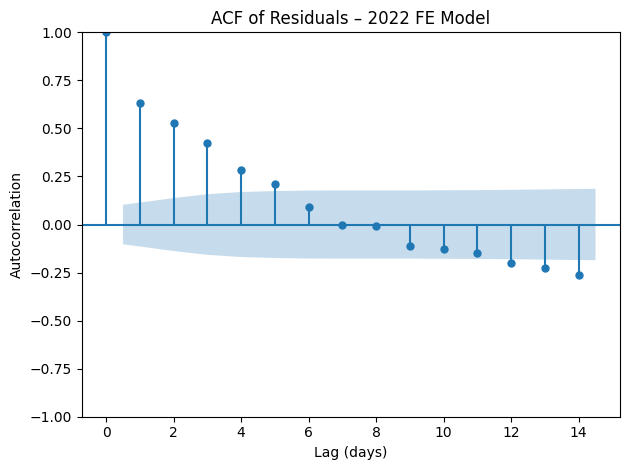

In [ ]:
# Residual'ları al
daily_2022["resid"] = model_2022.resid
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plot_acf(daily_2022["resid"], lags=14)
plt.title("ACF of Residuals – 2022 FE Model")
plt.xlabel("Lag (days)")
plt.ylabel("Autocorrelation")
plt.tight_layout()
plt.show()


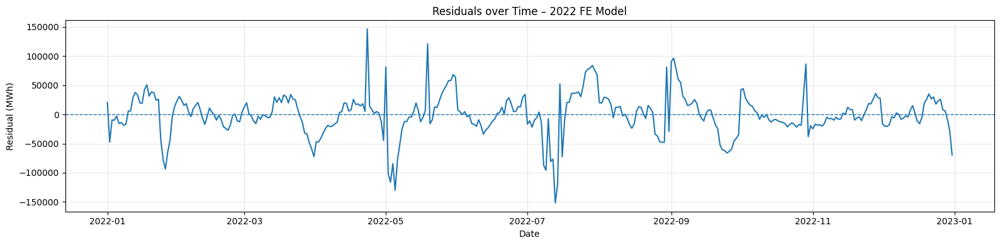

In [ ]:
plt.figure(figsize=(16,4))
plt.plot(daily_2022["Tarih"], daily_2022["resid"])
plt.axhline(0, linestyle="--", linewidth=1)
plt.title("Residuals over Time – 2022 FE Model")
plt.xlabel("Date")
plt.ylabel("Residual (MWh)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import re
import statsmodels.formula.api as smf

PATH_2023 = "/kaggle/input/tuketim2023/Gercek_Zamanli_Tuketim-01012023-31122023.csv"

def detect_sep(path, nlines=15):
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        sample = "".join([next(f) for _ in range(nlines)])
    cands = [";", "\t", ","]
    return max(cands, key=lambda s: sample.count(s))

def pick_col(cols, keywords):
    cols_l = {c: c.lower() for c in cols}
    for c in cols:
        for k in keywords:
            if k in cols_l[c]:
                return c
    return None

def parse_hour_to_minutes(x):
    if pd.isna(x): return np.nan
    s = str(x).strip()
    if re.fullmatch(r"\d{1,2}", s):
        h = int(s); return h*60 if 0<=h<=23 else np.nan
    m = re.fullmatch(r"(\d{1,2}):(\d{1,2})(?::(\d{1,2}))?", s)
    if m:
        h=int(m.group(1)); mi=int(m.group(2))
        if 0<=h<=23 and 0<=mi<=59: return h*60+mi
    return np.nan

def load_hourly_to_daily(path, year):
    sep = detect_sep(path)
    raw = pd.read_csv(path, sep=sep, engine="python", encoding="utf-8", on_bad_lines="skip")
    raw.columns = [str(c).strip() for c in raw.columns]
    raw = raw.loc[:, [c for c in raw.columns if not c.lower().startswith("unnamed")]]

    col_tarih = pick_col(raw.columns, ["tarih"])
    col_saat  = pick_col(raw.columns, ["saat"])
    col_tuk   = pick_col(raw.columns, ["tüketim miktarı", "tuketim miktarı", "tüketim", "tuketim"])
    if col_tarih is None or col_saat is None or col_tuk is None:
        raise ValueError(f"Kolon bulunamadı. Kolonlar={list(raw.columns)}")

    dfh = raw[[col_tarih, col_saat, col_tuk]].copy()
    dfh.columns = ["Tarih","Saat","Tuketim_raw"]

    tstr = dfh["Tarih"].astype(str).str.strip()
    d = pd.to_datetime(tstr, format="%d.%m.%Y", errors="coerce")
    m = d.isna()
    if m.any():
        d2 = pd.to_datetime(tstr[m], format="%Y-%m-%d", errors="coerce")
        d.loc[m] = d2
    m = d.isna()
    if m.any():
        d3 = pd.to_datetime(tstr[m], dayfirst=True, errors="coerce")
        d.loc[m] = d3
    dfh["date"] = d

    dfh["minute_of_day"] = dfh["Saat"].apply(parse_hour_to_minutes)

    s = dfh["Tuketim_raw"].astype(str).str.strip().str.replace(",", "", regex=False)
    dfh["Tuketim"] = pd.to_numeric(s, errors="coerce")

    dfh = dfh.dropna(subset=["date","minute_of_day","Tuketim"]).copy()
    dfh["datetime"] = dfh["date"] + pd.to_timedelta(dfh["minute_of_day"], unit="m")
    dfh = dfh[dfh["datetime"].dt.year == year].copy()

    daily = (dfh.groupby(dfh["datetime"].dt.floor("D"))["Tuketim"].sum()
             .reset_index().rename(columns={"datetime":"Tarih","Tuketim":"Gunluk_Tuketim"}))
    daily["Tarih"] = pd.to_datetime(daily["Tarih"])
    daily["Ay"] = daily["Tarih"].dt.month
    daily["Haftanin_Gunu"] = daily["Tarih"].dt.dayofweek
    return daily.sort_values("Tarih").reset_index(drop=True)

# ---- 2023 tatiller (senin verdiğin)
holiday_info_2023 = [
    ("2023-01-01", 1.0),
    ("2023-04-23", 1.0),
    ("2023-04-20", 0.5),
    ("2023-04-21", 1.0),
    ("2023-04-22", 1.0),
    ("2023-04-23", 1.0),
    ("2023-05-01", 1.0),
    ("2023-05-19", 1.0),
    ("2023-06-27", 0.5),
    ("2023-06-28", 1.0),
    ("2023-06-29", 1.0),
    ("2023-06-30", 1.0),
    ("2023-07-01", 1.0),
    ("2023-07-15", 1.0),
    ("2023-08-30", 1.0),
    ("2023-10-29", 1.0),
]
hol = pd.DataFrame(holiday_info_2023, columns=["Tarih","holiday_weight"])
hol["Tarih"] = pd.to_datetime(hol["Tarih"])

# ---- veriyi hazırla
daily_2023 = load_hourly_to_daily(PATH_2023, 2023).merge(hol, on="Tarih", how="left")
daily_2023["holiday_weight"] = daily_2023["holiday_weight"].fillna(0.0)

# ---- FE regresyon
model_2023 = smf.ols("Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)", data=daily_2023).fit(cov_type="HC1")

print("\n=== 2023 Holiday Effect (FE + HC1) ===")
print(model_2023.summary())

print("\n2023 tatil etkisi (holiday_weight katsayısı, MWh):", round(model_2023.params["holiday_weight"], 3))
print("p-value:", round(model_2023.pvalues["holiday_weight"], 4))



=== 2023 Holiday Effect (FE + HC1) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.893
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     183.1
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          7.62e-165
Time:                        17:52:11   Log-Likelihood:                -1801.8
No. Observations:                 366   AIC:                             3642.
Df Residuals:                     347   BIC:                             3716.
Df Model:                          18                                         
Covariance Type:                  HC1                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------

The 2023 results indicate that public holidays and religious festivals are associated with a statistically significant reduction in daily electricity consumption. After controlling for monthly seasonality and day-of-week effects, a full holiday day is estimated to reduce total daily electricity demand by approximately 151 MWh on average. The model explains nearly 89% of the variation in daily consumption, reflecting the strong role of calendar effects in shaping electricity demand patterns. The negative and highly significant holiday coefficient confirms that electricity consumption systematically declines on public holidays in 2023, consistent with the findings for 2022.

Given the strong serial correlation observed in daily electricity consumption (Durbin–Watson statistic = 0.69), the 2023 model was also re-estimated using Newey–West heteroskedasticity and autocorrelation consistent (HAC) standard errors. This ensures valid statistical inference in the presence of serially correlated errors and allows for a consistent comparison with the 2022 results.

In [ ]:
# =========================
# 2023 – HAC / Newey–West Robust SE
# =========================

import statsmodels.formula.api as smf

# 7 günlük lag (haftalık bağımlılık)
model_2023_hac = smf.ols(
    "Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)",
    data=daily_2023
).fit(
    cov_type="HAC",
    cov_kwds={"maxlags": 7}
)

print("\n=== 2023 Holiday Effect (FE + Newey-West HAC) ===")
print(model_2023_hac.summary())

print("\n2023 tatil etkisi (HAC, holiday_weight katsayısı):",
      round(model_2023_hac.params["holiday_weight"], 3))
print("HAC p-value:",
      round(model_2023_hac.pvalues["holiday_weight"], 4))



=== 2023 Holiday Effect (FE + Newey-West HAC) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.893
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     157.6
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          9.99e-155
Time:                        17:56:07   Log-Likelihood:                -1801.8
No. Observations:                 366   AIC:                             3642.
Df Residuals:                     347   BIC:                             3716.
Df Model:                          18                                         
Covariance Type:                  HAC                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------

<Figure size 800x400 with 0 Axes>

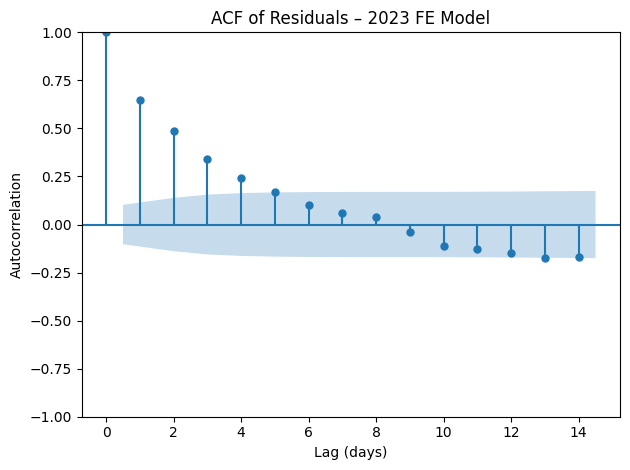

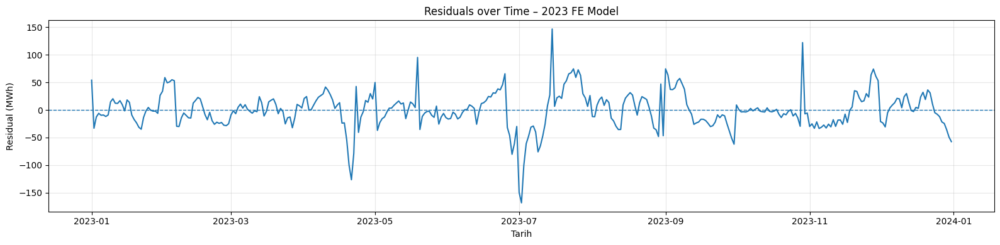

In [ ]:
plt.figure(figsize=(7,4))
normal = daily_2023.loc[daily_2023["holiday_weight"] == 0, "Gunluk_Tuketim"]
holiday = daily_2023.loc[daily_2023["holiday_weight"] > 0, "Gunluk_Tuketim"]

plt.boxplot([normal, holiday],
            labels=["Normal Days", "Holidays"],
            showfliers=False)

plt.title("2023 Daily Electricity Consumption\nNormal vs Holiday Days")
plt.ylabel("Daily Consumption")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import re
import statsmodels.formula.api as smf

PATH_2024 = "/kaggle/input/tuketim2024/Gercek_Zamanli_Tuketim-01012024-31122024.csv"

def detect_sep(path, nlines=15):
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        sample = "".join([next(f) for _ in range(nlines)])
    cands = [";", "\t", ","]
    return max(cands, key=lambda s: sample.count(s))

def pick_col(cols, keywords):
    cols_l = {c: c.lower() for c in cols}
    for c in cols:
        for k in keywords:
            if k in cols_l[c]:
                return c
    return None

def parse_hour_to_minutes(x):
    if pd.isna(x): return np.nan
    s = str(x).strip()
    if re.fullmatch(r"\d{1,2}", s):
        h = int(s); return h*60 if 0<=h<=23 else np.nan
    m = re.fullmatch(r"(\d{1,2}):(\d{1,2})(?::(\d{1,2}))?", s)
    if m:
        h=int(m.group(1)); mi=int(m.group(2))
        if 0<=h<=23 and 0<=mi<=59: return h*60+mi
    return np.nan

def load_hourly_to_daily(path, year):
    sep = detect_sep(path)
    raw = pd.read_csv(path, sep=sep, engine="python", encoding="utf-8", on_bad_lines="skip")
    raw.columns = [str(c).strip() for c in raw.columns]
    raw = raw.loc[:, [c for c in raw.columns if not c.lower().startswith("unnamed")]]

    col_tarih = pick_col(raw.columns, ["tarih"])
    col_saat  = pick_col(raw.columns, ["saat"])
    col_tuk   = pick_col(raw.columns, ["tüketim miktarı", "tuketim miktarı", "tüketim", "tuketim"])
    if col_tarih is None or col_saat is None or col_tuk is None:
        raise ValueError(f"Kolon bulunamadı. Kolonlar={list(raw.columns)}")

    dfh = raw[[col_tarih, col_saat, col_tuk]].copy()
    dfh.columns = ["Tarih","Saat","Tuketim_raw"]

    tstr = dfh["Tarih"].astype(str).str.strip()
    d = pd.to_datetime(tstr, format="%d.%m.%Y", errors="coerce")
    m = d.isna()
    if m.any():
        d2 = pd.to_datetime(tstr[m], format="%Y-%m-%d", errors="coerce")
        d.loc[m] = d2
    m = d.isna()
    if m.any():
        d3 = pd.to_datetime(tstr[m], dayfirst=True, errors="coerce")
        d.loc[m] = d3
    dfh["date"] = d

    dfh["minute_of_day"] = dfh["Saat"].apply(parse_hour_to_minutes)

    s = dfh["Tuketim_raw"].astype(str).str.strip().str.replace(",", "", regex=False)
    dfh["Tuketim"] = pd.to_numeric(s, errors="coerce")

    dfh = dfh.dropna(subset=["date","minute_of_day","Tuketim"]).copy()
    dfh["datetime"] = dfh["date"] + pd.to_timedelta(dfh["minute_of_day"], unit="m")
    dfh = dfh[dfh["datetime"].dt.year == year].copy()

    daily = (dfh.groupby(dfh["datetime"].dt.floor("D"))["Tuketim"].sum()
             .reset_index().rename(columns={"datetime":"Tarih","Tuketim":"Gunluk_Tuketim"}))
    daily["Tarih"] = pd.to_datetime(daily["Tarih"])
    daily["Ay"] = daily["Tarih"].dt.month
    daily["Haftanin_Gunu"] = daily["Tarih"].dt.dayofweek
    return daily.sort_values("Tarih").reset_index(drop=True)

# ---- 2024 tatiller (senin verdiğin)
holiday_info_2024 = [
    ("2024-01-01", 1.0),
    ("2024-04-09", 0.5),
    ("2024-04-10", 1.0),
    ("2024-04-11", 1.0),
    ("2024-04-12", 1.0),
    ("2024-04-23", 1.0),
    ("2024-05-01", 1.0),
    ("2024-05-19", 1.0),
    ("2024-06-15", 0.5),
    ("2024-06-16", 1.0),
    ("2024-06-17", 1.0),
    ("2024-06-18", 1.0),
    ("2024-06-19", 1.0),
    ("2024-07-15", 1.0),
    ("2024-08-30", 1.0),
    ("2024-10-29", 1.0),
]
hol = pd.DataFrame(holiday_info_2024, columns=["Tarih","holiday_weight"])
hol["Tarih"] = pd.to_datetime(hol["Tarih"])

# ---- veriyi hazırla
daily_2024 = load_hourly_to_daily(PATH_2024, 2024).merge(hol, on="Tarih", how="left")
daily_2024["holiday_weight"] = daily_2024["holiday_weight"].fillna(0.0)

# ---- FE regresyon
model_2024 = smf.ols("Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)", data=daily_2024).fit(cov_type="HC1")

print("\n=== 2024 Holiday Effect (FE + HC1) ===")
print(model_2024.summary())

print("\n2024 tatil etkisi (holiday_weight katsayısı, MWh):", round(model_2024.params["holiday_weight"], 3))
print("p-value:", round(model_2024.pvalues["holiday_weight"], 4))



=== 2024 Holiday Effect (FE + HC1) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     134.2
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          4.10e-144
Time:                        17:58:10   Log-Likelihood:                -1857.3
No. Observations:                 366   AIC:                             3753.
Df Residuals:                     347   BIC:                             3827.
Df Model:                          18                                         
Covariance Type:                  HC1                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------

In [ ]:
# =========================
# 2024 – HAC / Newey-West Robust SE
# =========================

model_2024_hac = smf.ols(
    "Gunluk_Tuketim ~ holiday_weight + C(Ay) + C(Haftanin_Gunu)",
    data=daily_2024
).fit(
    cov_type="HAC",
    cov_kwds={"maxlags": 7}
)

print("\n=== 2024 Holiday Effect (FE + Newey-West HAC) ===")
print(model_2024_hac.summary())

print("\n2024 tatil etkisi (HAC, holiday_weight katsayısı):",
      round(model_2024_hac.params["holiday_weight"], 3))
print("HAC p-value:",
      round(model_2024_hac.pvalues["holiday_weight"], 4))



=== 2024 Holiday Effect (FE + Newey-West HAC) ===
                            OLS Regression Results                            
Dep. Variable:         Gunluk_Tuketim   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     107.7
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          6.38e-130
Time:                        17:59:14   Log-Likelihood:                -1857.3
No. Observations:                 366   AIC:                             3753.
Df Residuals:                     347   BIC:                             3827.
Df Model:                          18                                         
Covariance Type:                  HAC                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------

<Figure size 800x400 with 0 Axes>

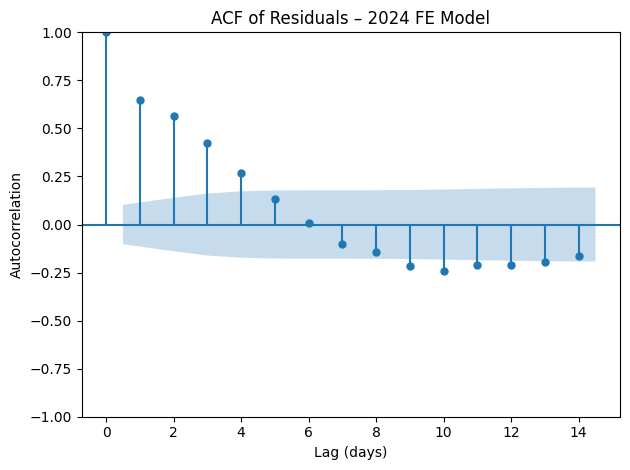

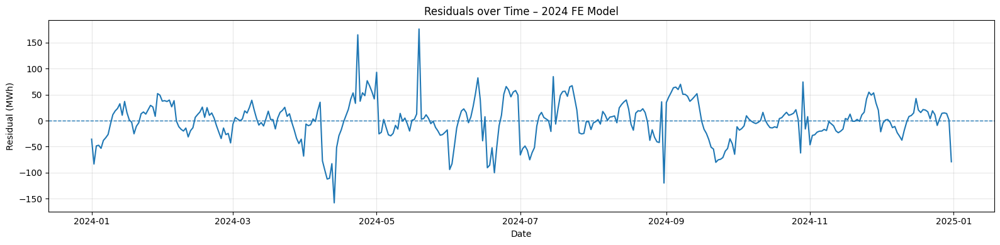

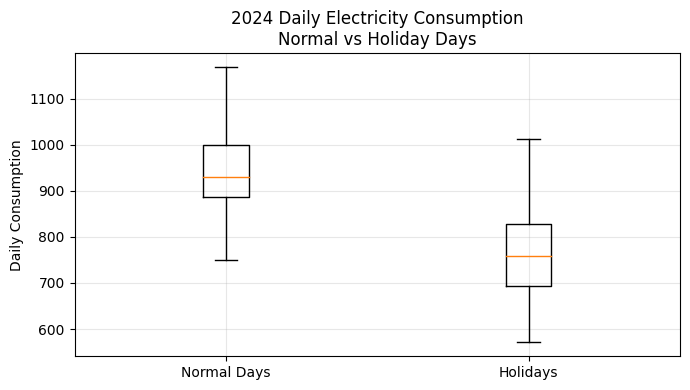

In [ ]:
# 2024 HAC residual'ları
daily_2024["resid_hac"] = model_2024_hac.resid
#ACF grafiği
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plot_acf(daily_2024["resid_hac"], lags=14)
plt.title("ACF of Residuals – 2024 FE Model")
plt.xlabel("Lag (days)")
plt.ylabel("Autocorrelation")
plt.tight_layout()
plt.show()
#Residual Time Series
plt.figure(figsize=(16,4))
plt.plot(daily_2024["Tarih"], daily_2024["resid_hac"])
plt.axhline(0, linestyle="--", linewidth=1)
plt.title("Residuals over Time – 2024 FE Model")
plt.xlabel("Date")
plt.ylabel("Residual (MWh)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
#Holiday vs Normal Day Box-Plot
plt.figure(figsize=(7,4))

normal = daily_2024.loc[daily_2024["holiday_weight"] == 0, "Gunluk_Tuketim"]
holiday = daily_2024.loc[daily_2024["holiday_weight"] > 0, "Gunluk_Tuketim"]

plt.boxplot([normal, holiday],
            labels=["Normal Days", "Holidays"],
            showfliers=False)

plt.title("2024 Daily Electricity Consumption\nNormal vs Holiday Days")
plt.ylabel("Daily Consumption")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



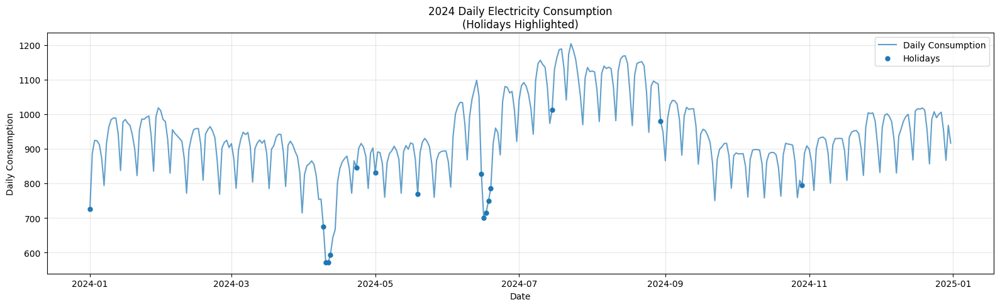

In [ ]:
#Time Series but holidays highlighted
plt.figure(figsize=(16,5))
plt.plot(daily_2024["Tarih"], daily_2024["Gunluk_Tuketim"],
         label="Daily Consumption", alpha=0.7)

hol_pts = daily_2024[daily_2024["holiday_weight"] > 0]
plt.scatter(hol_pts["Tarih"], hol_pts["Gunluk_Tuketim"],
            label="Holidays", s=25)

plt.title("2024 Daily Electricity Consumption\n(Holidays Highlighted)")
plt.xlabel("Date")
plt.ylabel("Daily Consumption")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Gercek_Zamanli_Tuketim-01012024-31122024.csv to Gercek_Zamanli_Tuketim-01012024-31122024.csv
Saving Gercek_Zamanli_Tuketim-01012023-31122023.csv to Gercek_Zamanli_Tuketim-01012023-31122023.csv
Saving Gercek_Zamanli_Tuketim-01012022-31122022.csv to Gercek_Zamanli_Tuketim-01012022-31122022.csv


Kolonlar: ['Tarih', 'Saat', 'Tüketim Miktarı(MWh)']
        Tarih   Saat Tüketim Miktarı(MWh)
0  01.01.2023  00:00            28.836,10
1  01.01.2023  01:00            27.608,62
2  01.01.2023  02:00            26.347,75
3  01.01.2023  03:00            25.243,18
4  01.01.2023  04:00            24.654,99

df_hourly örnek:
             datetime   Tuketim
0 2023-01-01 00:00:00  28836.10
1 2023-01-01 01:00:00  27608.62
2 2023-01-01 02:00:00  26347.75
3 2023-01-01 03:00:00  25243.18
4 2023-01-01 04:00:00  24654.99
Satır sayısı: 8760

Saatlik seri hazır:
datetime
2023-01-01 00:00:00    10.269383
2023-01-01 01:00:00    10.225883
2023-01-01 02:00:00    10.179138
2023-01-01 03:00:00    10.136311
2023-01-01 04:00:00    10.112735
Freq: h, Name: Tuketim, dtype: float64
ADF p-value (raw): 2.7857213913004056e-09
Seçilen d = 0
Seçilen D = 1


<Figure size 1000x400 with 0 Axes>

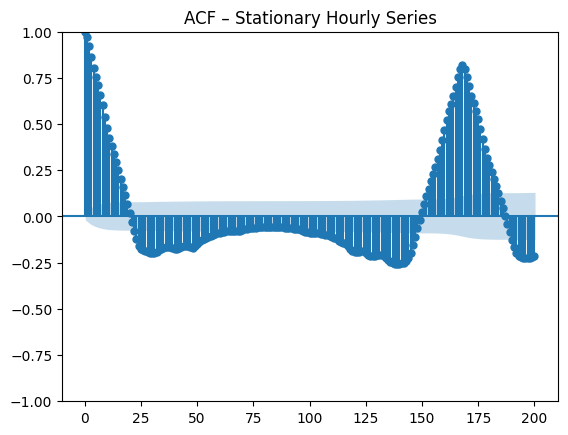

<Figure size 1000x400 with 0 Axes>

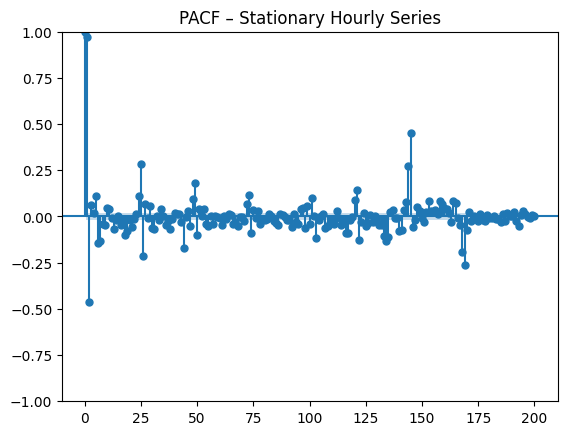

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# =========================
# 0) CSV'Yİ OKU
# =========================
PATH = "Gercek_Zamanli_Tuketim-01012023-31122023.csv"

raw = pd.read_csv(PATH, sep=";", encoding="utf-8", engine="python")
raw.columns = [c.strip() for c in raw.columns]

print("Kolonlar:", raw.columns.tolist())
print(raw.head())

# =========================
# 1) df_hourly OLUŞTUR (NET)
# =========================
df_hourly = raw[["Tarih", "Saat", "Tüketim Miktarı(MWh)"]].copy()

# datetime
df_hourly["datetime"] = pd.to_datetime(
    df_hourly["Tarih"].astype(str).str.strip() + " " +
    df_hourly["Saat"].astype(str).str.strip(),
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# tüketim temizleme
s = df_hourly["Tüketim Miktarı(MWh)"].astype(str)
s = s.str.replace(".", "", regex=False)
s = s.str.replace(",", ".", regex=False)

df_hourly["Tuketim"] = pd.to_numeric(s, errors="coerce")

df_hourly = (
    df_hourly[["datetime", "Tuketim"]]
    .dropna()
    .sort_values("datetime")
    .reset_index(drop=True)
)

print("\ndf_hourly örnek:")
print(df_hourly.head())
print("Satır sayısı:", len(df_hourly))

# =========================
# 2) SAATLİK SERİ
# =========================
df = df_hourly.set_index("datetime")

y = df["Tuketim"].asfreq("h")
y = y.interpolate("time")

# log dönüşümü
y = np.log(y + 1e-6)

print("\nSaatlik seri hazır:")
print(y.head())

# =========================
# 3) ADF → d SEÇİMİ
# =========================
adf_p = adfuller(y.dropna(), autolag="AIC")[1]
print("ADF p-value (raw):", adf_p)

d = 0 if adf_p < 0.05 else 1
print("Seçilen d =", d)

# =========================
# 4) MEVSİMSEL D (24)
# =========================
s = 24
y_season = y.diff(s).dropna()
p_season = adfuller(y_season, autolag="AIC")[1]

D = 1 if p_season < 0.05 else 0
print("Seçilen D =", D)

# =========================
# 5) ACF / PACF
# =========================
y_stat = y.copy()
if d == 1:
    y_stat = y_stat.diff()
if D == 1:
    y_stat = y_stat.diff(s)
y_stat = y_stat.dropna()

plt.figure(figsize=(10,4))
plot_acf(y_stat, lags=200)
plt.title("ACF – Stationary Hourly Series")
plt.show()

plt.figure(figsize=(10,4))
plot_pacf(y_stat, lags=200, method="ywm")
plt.title("PACF – Stationary Hourly Series")
plt.show()



PACF %95 sınırı ~ ±0.0210
PACF anlamlı lag'ler (ilk 60): [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 24, 25, 26, 27] ...
>> PACF tabanlı p önerisi (ilk ardışık anlamlı): 3


<Figure size 900x400 with 0 Axes>

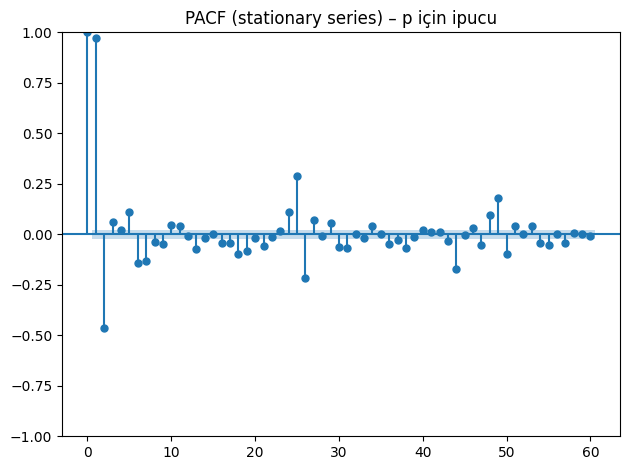

<Figure size 900x400 with 0 Axes>

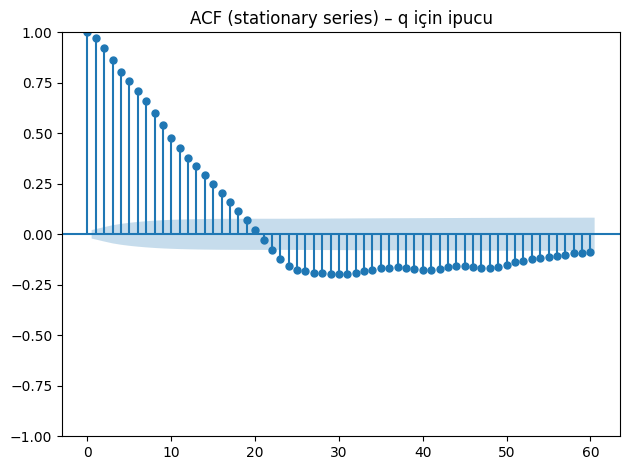

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ---------------------------------------------------------
# 0) SENİN ELİNDE OLANLAR: df_hourly -> y (log) -> d, D, s
# ---------------------------------------------------------
# df_hourly: columns = ["datetime","Tuketim"]  (SENDE VAR)
df = df_hourly.set_index("datetime").sort_index()
y = df["Tuketim"].astype(float).asfreq("h").interpolate("time")

# log dönüşümü
eps = 1e-6
y = np.log(y + eps)

# SENİN BULDUĞUN
d = 0
D = 1
s = 24

# ---------------------------------------------------------
# 1) p'yi PACF'den otomatik öner (heuristic)
#    (stationary seri: d ve D uygulanmış hal)
# ---------------------------------------------------------
y_stat = y.copy()
for _ in range(d):
    y_stat = y_stat.diff()
if D == 1:
    y_stat = y_stat.diff(s)
y_stat = y_stat.dropna()

# PACF değerleri ve %95 sınırı (yaklaşık)
N = len(y_stat)
conf = 1.96 / np.sqrt(N)

pacf_vals = pacf(y_stat, nlags=60, method="ywm")
# 1..60 lag içinde anlamlı pozitif/negatif olanları bul
sig_lags = [lag for lag in range(1, len(pacf_vals)) if abs(pacf_vals[lag]) > conf]

# p önerisi: en baştaki ardışık anlamlı lag sayısı (çok kullanılan pratik)
# örn: lag1 anlamlı, lag2 anlamsız => p≈1
p_suggest = 0
for lag in range(1, 11):  # ilk 10 lag'e bak
    if abs(pacf_vals[lag]) > conf:
        p_suggest = lag
    else:
        break

print(f"\nPACF %95 sınırı ~ ±{conf:.4f}")
print("PACF anlamlı lag'ler (ilk 60):", sig_lags[:20], "..." if len(sig_lags)>20 else "")
print(">> PACF tabanlı p önerisi (ilk ardışık anlamlı):", p_suggest)

# Görsel (istersen)
plt.figure(figsize=(9,4))
plot_pacf(y_stat, lags=60, method="ywm")
plt.title("PACF (stationary series) – p için ipucu")
plt.tight_layout()
plt.show()

plt.figure(figsize=(9,4))
plot_acf(y_stat, lags=60)
plt.title("ACF (stationary series) – q için ipucu")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 2) Grid Search (AIC): p,q,P,Q küçük aralık
#    p'yi PACF önerisine yakın tutarak hızlandırıyoruz
# ---------------------------------------------------------
p_candidates = sorted(set([0,1,2,3,4, p_suggest, max(0,p_suggest-1), p_suggest+1]))
p_candidates = [p for p in p_candidates if 0 <= p <= 6]  # sınırla
q_candidates = [0,1,2,3,4]
P_candidates = [0,1,2]
Q_candidates = [0,1,2]

results = []
for p in p_candidates:
    for q in q_candidates:
        for P in P_candidates:
            for Q in Q_candidates:
                try:
                    model = SARIMAX(
                        y,
                        order=(p,d,q),
                        seasonal_order=(P,D,Q,s),
                        trend="c",
                        enforce_stationarity=False,
                        enforce_invertibility=False
                    )
                    fit = model.fit(disp=False)
                    results.append((p,q,P,Q,fit.aic))
                except:
                    pass

res_df = pd.DataFrame(results, columns=["p","q","P","Q","AIC"]).sort_values("AIC").reset_index(drop=True)

print("\nEN İYİ 10 MODEL (AIC):")
print(res_df.head(10))

best = res_df.iloc[0]
p_best, q_best, P_best, Q_best = map(int, [best.p, best.q, best.P, best.Q])
print(f"\n✅ SEÇİLEN MODEL: SARIMA({p_best},{d},{q_best})({P_best},{D},{Q_best})[{s}]  | AIC={best.AIC:.2f}")

# ---------------------------------------------------------
# 3) Final modeli fit + residual kontrolleri
# ---------------------------------------------------------
final = SARIMAX(
    y,
    order=(p_best,d,q_best),
    seasonal_order=(P_best,D,Q_best,s),
    trend="c",
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

print("\nFINAL MODEL SUMMARY (kısaltılmış):")
print(final.summary())

# Residual (artık) serisi
resid = final.resid.dropna()

# Ljung-Box: artıklar otokorelasyon taşıyor mu?
lb = acorr_ljungbox(resid, lags=[24, 48], return_df=True)  # 1 ve 2 günlük kontrol
print("\nLjung-Box (Residual Autocorrelation Test):")
print(lb)

# Residual ACF
plt.figure(figsize=(9,4))
plot_acf(resid, lags=72)
plt.title("Residual ACF – beyaz gürültü mü?")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 4) İstersen 7 gün ahead forecast örneği
# ---------------------------------------------------------
steps = 24*7
fc = final.get_forecast(steps=steps)
fc_mean = fc.predicted_mean

# log'u geri çevir (yaklaşık)
fc_mean_level = np.exp(fc_mean) - eps

plt.figure(figsize=(12,4))
plt.plot(np.exp(y.tail(24*14)) - eps, label="Son 14 gün (gerçek, seviye)")
plt.plot(fc_mean_level, label="7 gün tahmin")
plt.title("Saatlik Tüketim – 7 Gün Tahmin (SARIMA)")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =====================================================
# 1) Saatlik seriyi hazırla
# =====================================================
df = df_hourly.set_index("datetime").sort_index()
y = df["Tuketim"].astype(float).asfreq("h").interpolate("time")

# log dönüşümü
eps = 1e-6
y = np.log(y + eps)

# =====================================================
# 2) Küçük parametreleri SABİTLE (senin değerlerin)
#    p,d,q'yu kendi bulduğun değerlere göre ayarla
# =====================================================
p, d, q = 3, 0, 1
s = 24
D = 1

# =====================================================
# 3) SADECE P ve Q için küçük grid (0..2)
# =====================================================
P_range = range(0, 3)  # 0,1,2
Q_range = range(0, 3)  # 0,1,2

rows = []
for P in P_range:
    for Q in Q_range:
        try:
            model = SARIMAX(
                y,
                order=(p, d, q),
                seasonal_order=(P, D, Q, s),
                trend="c",
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fit = model.fit(disp=False)
            rows.append((P, Q, fit.aic, fit.bic))
            print(f"OK: (P,Q)=({P},{Q}) | AIC={fit.aic:.2f} | BIC={fit.bic:.2f}")
        except Exception as e:
            print(f"FAIL: (P,Q)=({P},{Q}) | {type(e).__name__}")

res = pd.DataFrame(rows, columns=["P","Q","AIC","BIC"]).sort_values("AIC").reset_index(drop=True)

print("\n=== EN İYİ 9 MODEL (AIC sıralı) ===")
print(res)

best = res.iloc[0]
bestP, bestQ = int(best.P), int(best.Q)

print(f"\n✅ SEÇİLEN (P,Q): ({bestP},{bestQ}) | AIC={best.AIC:.2f} | BIC={best.BIC:.2f}")

# =====================================================
# 4) Final modeli seçilen P,Q ile fit et + summary
# =====================================================
final_model = SARIMAX(
    y,
    order=(p, d, q),
    seasonal_order=(bestP, D, bestQ, s),
    trend="c",
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

print("\n=== FINAL MODEL SUMMARY ===")
print(final_model.summary())


OK: (P,Q)=(0,0) | AIC=-45748.40 | BIC=-45705.95


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK: (P,Q)=(0,1) | AIC=-49452.15 | BIC=-49402.65


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK: (P,Q)=(0,2) | AIC=-49466.80 | BIC=-49410.25
OK: (P,Q)=(1,0) | AIC=-47049.90 | BIC=-47000.40


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK: (P,Q)=(1,1) | AIC=-49494.79 | BIC=-49438.22


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK: (P,Q)=(1,2) | AIC=-49507.07 | BIC=-49443.44


In [ ]:
import numpy as np
import pandas as pd
import gc
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =====================================================
# 0) DOSYA YOLU (COLAB)
# =====================================================
PATH = "Gercek_Zamanli_Tuketim-01012023-31122023.csv"

# =====================================================
# 1) CSV → df_hourly (GARANTİLİ)
# =====================================================
raw = pd.read_csv(PATH, sep=";", encoding="utf-8", engine="python")
raw.columns = [c.strip() for c in raw.columns]

df_hourly = raw[["Tarih", "Saat", "Tüketim Miktarı(MWh)"]].copy()

df_hourly["datetime"] = pd.to_datetime(
    df_hourly["Tarih"].astype(str).str.strip() + " " +
    df_hourly["Saat"].astype(str).str.strip(),
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

s = df_hourly["Tüketim Miktarı(MWh)"].astype(str)
s = s.str.replace(".", "", regex=False)
s = s.str.replace(",", ".", regex=False)

df_hourly["Tuketim"] = pd.to_numeric(s, errors="coerce")

df_hourly = (
    df_hourly[["datetime", "Tuketim"]]
    .dropna()
    .sort_values("datetime")
    .reset_index(drop=True)
)

print("df_hourly hazır | satır sayısı:", len(df_hourly))

# =====================================================
# 2) Saatlik seri
# =====================================================
df = df_hourly.set_index("datetime").sort_index()

y = (
    df["Tuketim"]
    .astype(np.float32)
    .asfreq("h")
    .interpolate("time")
)

y = np.log(y + 1e-6).astype(np.float32)

# =====================================================
# 3) SABİT PARAMETRELER (SENİN BULDUKLARIN)
# =====================================================
p, d, q = 3, 0, 1
D = 1
s = 24

# =====================================================
# 4) SADECE P ve Q (0..2) – RAM SAFE
# =====================================================
P_range = range(0, 3)
Q_range = range(0, 3)

rows = []

for P in P_range:
    for Q in Q_range:
        try:
            model = SARIMAX(
                y,
                order=(p,d,q),
                seasonal_order=(P,D,Q,s),
                trend="c",
                enforce_stationarity=False,
                enforce_invertibility=False,
                simple_differencing=True
            )
            fit = model.fit(disp=False, maxiter=50)
            converged = fit.mle_retvals.get("converged", False)

            rows.append((P,Q,fit.aic,fit.bic,converged))
            print(f"OK (P,Q)=({P},{Q}) | AIC={fit.aic:.2f} | conv={converged}")

        except Exception as e:
            print(f"FAIL (P,Q)=({P},{Q}) | {type(e).__name__}")

        del model, fit
        gc.collect()

res = (
    pd.DataFrame(rows, columns=["P","Q","AIC","BIC","converged"])
    .sort_values("AIC")
    .reset_index(drop=True)
)

print("\n=== P–Q SONUÇ TABLOSU ===")
print(res)


df_hourly hazır | satır sayısı: 8760
OK (P,Q)=(0,0) | AIC=-45747.52 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(0,1) | AIC=-49460.91 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(0,2) | AIC=-49459.79 | conv=False
OK (P,Q)=(1,0) | AIC=-47049.83 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,1) | AIC=-49501.06 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,2) | AIC=-49493.10 | conv=False
OK (P,Q)=(2,0) | AIC=-47713.77 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(2,1) | AIC=-48703.37 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(2,2) | AIC=-49407.64 | conv=False

=== P–Q SONUÇ TABLOSU ===
   P  Q           AIC           BIC  converged
0  1  1 -49501.064788 -49444.487890      False
1  1  2 -49493.104930 -49429.479720      False
2  0  1 -49460.913881 -49411.408292      False
3  0  2 -49459.792920 -49403.237177      False
4  2  2 -49407.635784 -49336.942257      False
5  2  1 -48703.367660 -48639.743486      False
6  2  0 -47713.767923 -47657.213101       True
7  1  0 -47049.831835 -47000.327049       True
8  0  0 -45747.521694 -45705.072508       True


Kolonlar: ['Tarih', 'Saat', 'Tüketim Miktarı(MWh)']
        Tarih   Saat Tüketim Miktarı(MWh)
0  01.01.2022  00:00            31,021.25
1  01.01.2022  01:00            29,710.69
2  01.01.2022  02:00            28,318.53
3  01.01.2022  03:00            27,169.55
4  01.01.2022  04:00            26,525.16

df_hourly örnek:
             datetime   Tuketim
0 2022-01-01 00:00:00  31.02125
1 2022-01-01 01:00:00  29.71069
2 2022-01-01 02:00:00  28.31853
3 2022-01-01 03:00:00  27.16955
4 2022-01-01 04:00:00  26.52516
Satır sayısı: 8760

Saatlik seri hazır:
datetime
2022-01-01 00:00:00    3.434672
2022-01-01 01:00:00    3.391507
2022-01-01 02:00:00    3.343516
2022-01-01 03:00:00    3.302097
2022-01-01 04:00:00    3.278094
Freq: h, Name: Tuketim, dtype: float64
ADF p-value (raw): 3.441928012046977e-12
Seçilen d = 0
Seçilen D = 1


<Figure size 1000x400 with 0 Axes>

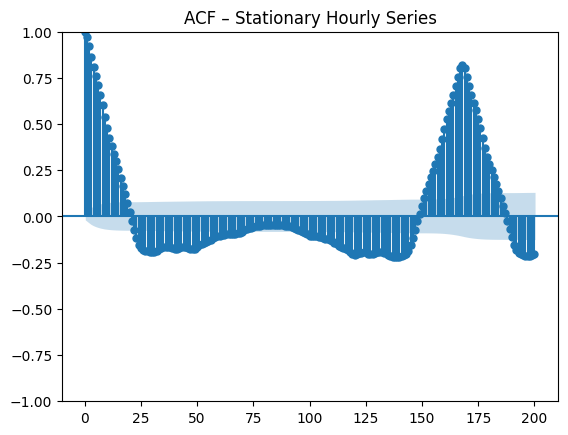

<Figure size 1000x400 with 0 Axes>

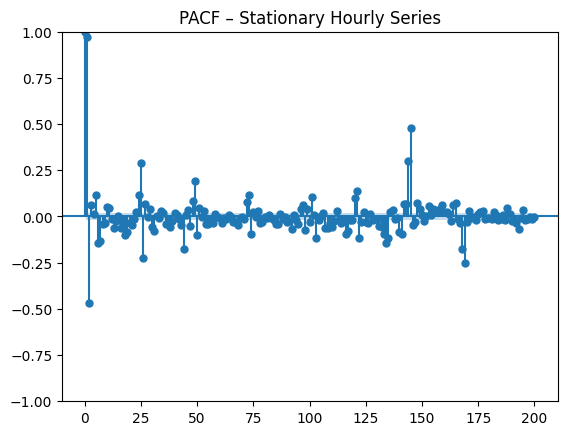

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# =========================
# 0) CSV'Yİ OKU
# =========================
PATH = "Gercek_Zamanli_Tuketim-01012022-31122022.csv"

raw = pd.read_csv(PATH, sep=";", encoding="utf-8", engine="python")
raw.columns = [c.strip() for c in raw.columns]

print("Kolonlar:", raw.columns.tolist())
print(raw.head())

# =========================
# 1) df_hourly OLUŞTUR (NET)
# =========================
df_hourly = raw[["Tarih", "Saat", "Tüketim Miktarı(MWh)"]].copy()

# datetime
df_hourly["datetime"] = pd.to_datetime(
    df_hourly["Tarih"].astype(str).str.strip() + " " +
    df_hourly["Saat"].astype(str).str.strip(),
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

# tüketim temizleme
s = df_hourly["Tüketim Miktarı(MWh)"].astype(str)
s = s.str.replace(".", "", regex=False)
s = s.str.replace(",", ".", regex=False)

df_hourly["Tuketim"] = pd.to_numeric(s, errors="coerce")

df_hourly = (
    df_hourly[["datetime", "Tuketim"]]
    .dropna()
    .sort_values("datetime")
    .reset_index(drop=True)
)

print("\ndf_hourly örnek:")
print(df_hourly.head())
print("Satır sayısı:", len(df_hourly))

# =========================
# 2) SAATLİK SERİ
# =========================
df = df_hourly.set_index("datetime")

y = df["Tuketim"].asfreq("h")
y = y.interpolate("time")

# log dönüşümü
y = np.log(y + 1e-6)

print("\nSaatlik seri hazır:")
print(y.head())

# =========================
# 3) ADF → d SEÇİMİ
# =========================
adf_p = adfuller(y.dropna(), autolag="AIC")[1]
print("ADF p-value (raw):", adf_p)

d = 0 if adf_p < 0.05 else 1
print("Seçilen d =", d)

# =========================
# 4) MEVSİMSEL D (24)
# =========================
s = 24
y_season = y.diff(s).dropna()
p_season = adfuller(y_season, autolag="AIC")[1]

D = 1 if p_season < 0.05 else 0
print("Seçilen D =", D)

# =========================
# 5) ACF / PACF
# =========================
y_stat = y.copy()
if d == 1:
    y_stat = y_stat.diff()
if D == 1:
    y_stat = y_stat.diff(s)
y_stat = y_stat.dropna()

plt.figure(figsize=(10,4))
plot_acf(y_stat, lags=200)
plt.title("ACF – Stationary Hourly Series")
plt.show()

plt.figure(figsize=(10,4))
plot_pacf(y_stat, lags=200, method="ywm")
plt.title("PACF – Stationary Hourly Series")
plt.show()



PACF %95 sınırı ~ ±0.0210
PACF anlamlı lag'ler (ilk 60): [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 23, 24] ...
>> PACF tabanlı p önerisi (ilk ardışık anlamlı): 3


<Figure size 900x400 with 0 Axes>

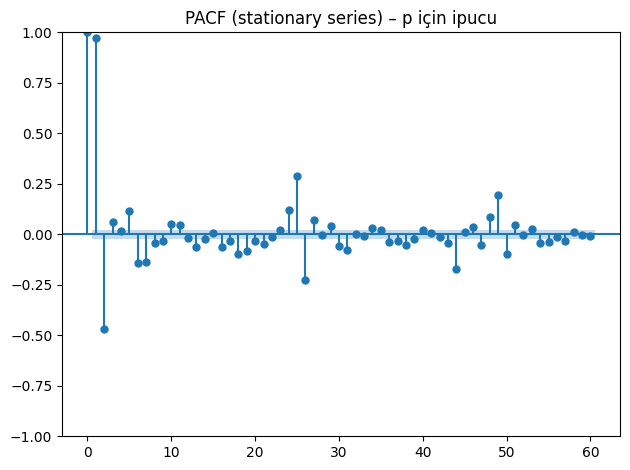

<Figure size 900x400 with 0 Axes>

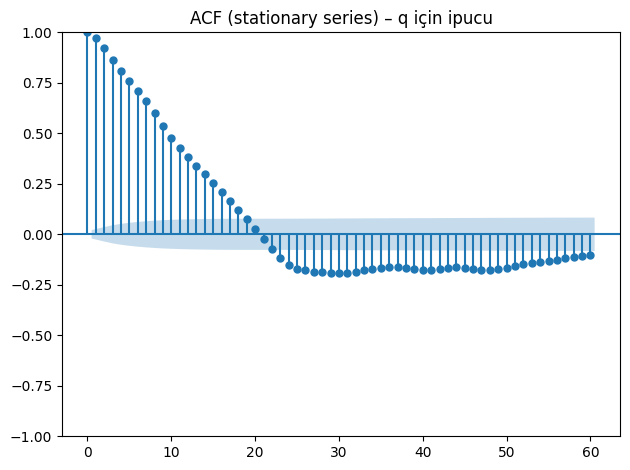

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ---------------------------------------------------------
# 0) SENİN ELİNDE OLANLAR: df_hourly -> y (log) -> d, D, s
# ---------------------------------------------------------
# df_hourly: columns = ["datetime","Tuketim"]  (SENDE VAR)
df = df_hourly.set_index("datetime").sort_index()
y = df["Tuketim"].astype(float).asfreq("h").interpolate("time")

# log dönüşümü
eps = 1e-6
y = np.log(y + eps)

# SENİN BULDUĞUN
d = 0
D = 1
s = 24

# ---------------------------------------------------------
# 1) p'yi PACF'den otomatik öner (heuristic)
#    (stationary seri: d ve D uygulanmış hal)
# ---------------------------------------------------------
y_stat = y.copy()
for _ in range(d):
    y_stat = y_stat.diff()
if D == 1:
    y_stat = y_stat.diff(s)
y_stat = y_stat.dropna()

# PACF değerleri ve %95 sınırı (yaklaşık)
N = len(y_stat)
conf = 1.96 / np.sqrt(N)

pacf_vals = pacf(y_stat, nlags=60, method="ywm")
# 1..60 lag içinde anlamlı pozitif/negatif olanları bul
sig_lags = [lag for lag in range(1, len(pacf_vals)) if abs(pacf_vals[lag]) > conf]

# p önerisi: en baştaki ardışık anlamlı lag sayısı (çok kullanılan pratik)
# örn: lag1 anlamlı, lag2 anlamsız => p≈1
p_suggest = 0
for lag in range(1, 11):  # ilk 10 lag'e bak
    if abs(pacf_vals[lag]) > conf:
        p_suggest = lag
    else:
        break

print(f"\nPACF %95 sınırı ~ ±{conf:.4f}")
print("PACF anlamlı lag'ler (ilk 60):", sig_lags[:20], "..." if len(sig_lags)>20 else "")
print(">> PACF tabanlı p önerisi (ilk ardışık anlamlı):", p_suggest)

# Görsel (istersen)
plt.figure(figsize=(9,4))
plot_pacf(y_stat, lags=60, method="ywm")
plt.title("PACF (stationary series) – p için ipucu")
plt.tight_layout()
plt.show()

plt.figure(figsize=(9,4))
plot_acf(y_stat, lags=60)
plt.title("ACF (stationary series) – q için ipucu")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 2) Grid Search (AIC): p,q,P,Q küçük aralık
#    p'yi PACF önerisine yakın tutarak hızlandırıyoruz
# ---------------------------------------------------------
p_candidates = sorted(set([0,1,2,3,4, p_suggest, max(0,p_suggest-1), p_suggest+1]))
p_candidates = [p for p in p_candidates if 0 <= p <= 6]  # sınırla
q_candidates = [0,1,2,3,4]
P_candidates = [0,1,2]
Q_candidates = [0,1,2]

results = []
for p in p_candidates:
    for q in q_candidates:
        for P in P_candidates:
            for Q in Q_candidates:
                try:
                    model = SARIMAX(
                        y,
                        order=(p,d,q),
                        seasonal_order=(P,D,Q,s),
                        trend="c",
                        enforce_stationarity=False,
                        enforce_invertibility=False
                    )
                    fit = model.fit(disp=False)
                    results.append((p,q,P,Q,fit.aic))
                except:
                    pass

res_df = pd.DataFrame(results, columns=["p","q","P","Q","AIC"]).sort_values("AIC").reset_index(drop=True)

print("\nEN İYİ 10 MODEL (AIC):")
print(res_df.head(10))

best = res_df.iloc[0]
p_best, q_best, P_best, Q_best = map(int, [best.p, best.q, best.P, best.Q])
print(f"\n✅ SEÇİLEN MODEL: SARIMA({p_best},{d},{q_best})({P_best},{D},{Q_best})[{s}]  | AIC={best.AIC:.2f}")

# ---------------------------------------------------------
# 3) Final modeli fit + residual kontrolleri
# ---------------------------------------------------------
final = SARIMAX(
    y,
    order=(p_best,d,q_best),
    seasonal_order=(P_best,D,Q_best,s),
    trend="c",
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

print("\nFINAL MODEL SUMMARY (kısaltılmış):")
print(final.summary())

# Residual (artık) serisi
resid = final.resid.dropna()

# Ljung-Box: artıklar otokorelasyon taşıyor mu?
lb = acorr_ljungbox(resid, lags=[24, 48], return_df=True)  # 1 ve 2 günlük kontrol
print("\nLjung-Box (Residual Autocorrelation Test):")
print(lb)

# Residual ACF
plt.figure(figsize=(9,4))
plot_acf(resid, lags=72)
plt.title("Residual ACF – beyaz gürültü mü?")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 4) İstersen 7 gün ahead forecast örneği
# ---------------------------------------------------------
steps = 24*7
fc = final.get_forecast(steps=steps)
fc_mean = fc.predicted_mean

# log'u geri çevir (yaklaşık)
fc_mean_level = np.exp(fc_mean) - eps

plt.figure(figsize=(12,4))
plt.plot(np.exp(y.tail(24*14)) - eps, label="Son 14 gün (gerçek, seviye)")
plt.plot(fc_mean_level, label="7 gün tahmin")
plt.title("Saatlik Tüketim – 7 Gün Tahmin (SARIMA)")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import re
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =====================================================
# 0) DOSYA YOLU (BURAYI KENDİNE GÖRE DÜZELT)
#    - Drive: /content/drive/MyDrive/...
#    - Upload: /content/...
# =====================================================
PATH_2022 = "Gercek_Zamanli_Tuketim-01012022-31122022.csv"

# =====================================================
# 1) CSV'yi sağlam oku (ayraç otomatik)
# =====================================================
def detect_sep(path, nlines=10):
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        sample = "".join([next(f) for _ in range(nlines)])
    cands = [";", "\t", ","]
    return max(cands, key=lambda s: sample.count(s))

sep = detect_sep(PATH_2022)
raw = pd.read_csv(PATH_2022, sep=sep, encoding="utf-8", engine="python")
raw.columns = [str(c).strip() for c in raw.columns]

print("Separator:", repr(sep))
print("Kolonlar:", list(raw.columns))
print(raw.head())

# =====================================================
# 2) Kolon adlarını güvenli bul (Türkçe/İngilizce varyasyonlar için)
# =====================================================
def pick_col(cols, keywords):
    cols_l = {c: c.lower() for c in cols}
    for c in cols:
        for k in keywords:
            if k in cols_l[c]:
                return c
    return None

col_tarih = pick_col(raw.columns, ["tarih", "date"])
col_saat  = pick_col(raw.columns, ["saat", "hour", "time"])
col_tuk   = pick_col(raw.columns, ["tüketim miktarı", "tuketim miktarı", "tüketim", "tuketim", "consumption"])

if col_tarih is None or col_saat is None or col_tuk is None:
    raise ValueError(f"Kolonları bulamadım. Bulduklarım: tarih={col_tarih}, saat={col_saat}, tuketim={col_tuk}. Kolonlar={list(raw.columns)}")

# =====================================================
# 3) df_hourly üret (datetime + numeric consumption)
# =====================================================
df_hourly = raw[[col_tarih, col_saat, col_tuk]].copy()
df_hourly.columns = ["Tarih", "Saat", "Tuketim_raw"]

# datetime parse (en sık format: dd.mm.yyyy HH:MM)
dt_str = df_hourly["Tarih"].astype(str).str.strip() + " " + df_hourly["Saat"].astype(str).str.strip()
df_hourly["datetime"] = pd.to_datetime(dt_str, format="%d.%m.%Y %H:%M", errors="coerce")

# Bazı dosyalarda tarih farklı format olabiliyor: 2022-01-01 00:00 gibi
m = df_hourly["datetime"].isna()
if m.any():
    df_hourly.loc[m, "datetime"] = pd.to_datetime(dt_str[m], dayfirst=True, errors="coerce")

# tüketim parse:
# - "28.836,10" => 28836.10  (binlik '.' sil, ',' -> '.')
s = df_hourly["Tuketim_raw"].astype(str).str.strip()
s = s.str.replace(".", "", regex=False)
s = s.str.replace(",", ".", regex=False)
df_hourly["Tuketim"] = pd.to_numeric(s, errors="coerce")

df_hourly = df_hourly[["datetime", "Tuketim"]].dropna().sort_values("datetime").reset_index(drop=True)

print("\nSaatlik veri örnek:")
print(df_hourly.head())
print("Satır sayısı:", len(df_hourly))
if len(df_hourly) == 0:
    raise ValueError("df_hourly boş kaldı. Tarih/Saat parse edilemedi veya tüketim sayıya çevrilemedi.")

# =====================================================
# 4) Saatlik seri (log) hazırla
# =====================================================
df = df_hourly.set_index("datetime").sort_index()
y = df["Tuketim"].astype(float).asfreq("h").interpolate("time")

eps = 1e-6
y = np.log(y + eps)

# =====================================================
# 5) Küçük parametreleri SABİTLE (senin verdiğin)
# =====================================================
p, d, q = 3, 0, 1
s_season = 24
D = 1

# =====================================================
# 6) SADECE P ve Q için küçük grid (0..2)
#    + convergence bilgisini de yazdır (önemli!)
# =====================================================
P_range = range(0, 3)
Q_range = range(0, 3)

rows = []
for P in P_range:
    for Q in Q_range:
        try:
            model = SARIMAX(
                y,
                order=(p, d, q),
                seasonal_order=(P, D, Q, s_season),
                trend="c",
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fit = model.fit(disp=False)

            # convergence kontrolü
            conv = True
            try:
                conv = bool(fit.mle_retvals.get("converged", True))
            except Exception:
                pass

            rows.append((P, Q, fit.aic, fit.bic, conv))
            print(f"OK (P,Q)=({P},{Q}) | AIC={fit.aic:.2f} | BIC={fit.bic:.2f} | conv={conv}")
        except Exception as e:
            print(f"FAIL (P,Q)=({P},{Q}) | {type(e).__name__}: {e}")

res = pd.DataFrame(rows, columns=["P","Q","AIC","BIC","converged"]).sort_values(["converged","AIC"], ascending=[False, True]).reset_index(drop=True)

print("\n=== P–Q SONUÇ TABLOSU (önce converged=True, sonra AIC) ===")
print(res)

if len(res) == 0:
    raise ValueError("Hiçbir (P,Q) kombinasyonu fit edilemedi. Veri/parametre/Colab RAM kontrol etmeliyiz.")

best = res.iloc[0]
bestP, bestQ = int(best.P), int(best.Q)
print(f"\n✅ SEÇİLEN (P,Q): ({bestP},{bestQ}) | AIC={best.AIC:.2f} | BIC={best.BIC:.2f} | conv={best.converged}")

# =====================================================
# 7) Final modeli seçilen P,Q ile fit et + summary
# =====================================================
final_model = SARIMAX(
    y,
    order=(p, d, q),
    seasonal_order=(bestP, D, bestQ, s_season),
    trend="c",
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

print("\n=== FINAL MODEL SUMMARY ===")
print(final_model.summary())


Separator: ';'
Kolonlar: ['Tarih', 'Saat', 'Tüketim Miktarı(MWh)']
        Tarih   Saat Tüketim Miktarı(MWh)
0  01.01.2022  00:00            31,021.25
1  01.01.2022  01:00            29,710.69
2  01.01.2022  02:00            28,318.53
3  01.01.2022  03:00            27,169.55
4  01.01.2022  04:00            26,525.16

Saatlik veri örnek:
             datetime   Tuketim
0 2022-01-01 00:00:00  31.02125
1 2022-01-01 01:00:00  29.71069
2 2022-01-01 02:00:00  28.31853
3 2022-01-01 03:00:00  27.16955
4 2022-01-01 04:00:00  26.52516
Satır sayısı: 8760
OK (P,Q)=(0,0) | AIC=-46404.43 | BIC=-46361.98 | conv=True
OK (P,Q)=(0,1) | AIC=-50113.92 | BIC=-50064.41 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(0,2) | AIC=-50205.39 | BIC=-50148.83 | conv=False
OK (P,Q)=(1,0) | AIC=-47639.59 | BIC=-47590.09 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,1) | AIC=-48762.66 | BIC=-48706.09 | conv=False
OK (P,Q)=(1,2) | AIC=-50231.40 | BIC=-50167.77 | conv=True
OK (P,Q)=(2,0) | AIC=-48411.03 | BIC=-48354.48 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
import numpy as np
import pandas as pd
import gc
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =====================================================
# 0) DOSYA YOLU (COLAB)
# =====================================================
PATH = "Gercek_Zamanli_Tuketim-01012022-31122022.csv"

# =====================================================
# 1) CSV → df_hourly (GARANTİLİ)
# =====================================================
raw = pd.read_csv(PATH, sep=";", encoding="utf-8", engine="python")
raw.columns = [c.strip() for c in raw.columns]

df_hourly = raw[["Tarih", "Saat", "Tüketim Miktarı(MWh)"]].copy()

df_hourly["datetime"] = pd.to_datetime(
    df_hourly["Tarih"].astype(str).str.strip() + " " +
    df_hourly["Saat"].astype(str).str.strip(),
    format="%d.%m.%Y %H:%M",
    errors="coerce"
)

s = df_hourly["Tüketim Miktarı(MWh)"].astype(str)
s = s.str.replace(".", "", regex=False)
s = s.str.replace(",", ".", regex=False)

df_hourly["Tuketim"] = pd.to_numeric(s, errors="coerce")

df_hourly = (
    df_hourly[["datetime", "Tuketim"]]
    .dropna()
    .sort_values("datetime")
    .reset_index(drop=True)
)

print("df_hourly hazır | satır sayısı:", len(df_hourly))

# =====================================================
# 2) Saatlik seri
# =====================================================
df = df_hourly.set_index("datetime").sort_index()

y = (
    df["Tuketim"]
    .astype(np.float32)
    .asfreq("h")
    .interpolate("time")
)

y = np.log(y + 1e-6).astype(np.float32)

# =====================================================
# 3) SABİT PARAMETRELER (SENİN BULDUKLARIN)
# =====================================================
p, d, q = 3, 0, 1
D = 1
s = 24

# =====================================================
# 4) SADECE P ve Q (0..2) – RAM SAFE
# =====================================================
P_range = range(0, 3)
Q_range = range(0, 3)

rows = []

for P in P_range:
    for Q in Q_range:
        try:
            model = SARIMAX(
                y,
                order=(p,d,q),
                seasonal_order=(P,D,Q,s),
                trend="c",
                enforce_stationarity=False,
                enforce_invertibility=False,
                simple_differencing=True
            )
            fit = model.fit(disp=False, maxiter=50)
            converged = fit.mle_retvals.get("converged", False)

            rows.append((P,Q,fit.aic,fit.bic,converged))
            print(f"OK (P,Q)=({P},{Q}) | AIC={fit.aic:.2f} | conv={converged}")

        except Exception as e:
            print(f"FAIL (P,Q)=({P},{Q}) | {type(e).__name__}")

        del model, fit
        gc.collect()

res = (
    pd.DataFrame(rows, columns=["P","Q","AIC","BIC","converged"])
    .sort_values("AIC")
    .reset_index(drop=True)
)

print("\n=== P–Q SONUÇ TABLOSU ===")
print(res)


df_hourly hazır | satır sayısı: 8760
OK (P,Q)=(0,0) | AIC=-46404.18 | conv=True
OK (P,Q)=(0,1) | AIC=-50155.92 | conv=True


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(0,2) | AIC=-50198.78 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,0) | AIC=-47643.57 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,1) | AIC=-49861.73 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(1,2) | AIC=-50245.13 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(2,0) | AIC=-48410.91 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(2,1) | AIC=-48572.69 | conv=False


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


OK (P,Q)=(2,2) | AIC=-50188.95 | conv=False

=== P–Q SONUÇ TABLOSU ===
   P  Q           AIC           BIC  converged
0  1  2 -50245.133087 -50181.507877      False
1  0  2 -50198.781305 -50142.225562      False
2  2  2 -50188.951171 -50118.257644      False
3  0  1 -50155.917115 -50106.411525       True
4  1  1 -49861.733828 -49805.156930      False
5  2  1 -48572.686776 -48509.062602      False
6  2  0 -48410.905852 -48354.351031      False
7  1  0 -47643.574387 -47594.069601      False
8  0  0 -46404.181601 -46361.732415       True
